# Packages


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.simplefilter("ignore", UserWarning)
import pandas as pd
import csv
import sys
import array
import xarray as xr
import cmocean.cm as cmocean
def write_with_byte_inversion(f, tab):
    tab2write = array.array('f', tab.T.flatten())
    if sys.byteorder == 'little':
        tab2write.byteswap()
    f.write(tab2write)

dtype=np.float32
#topo_adjust to topo wi
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
from matplotlib.ticker import FuncFormatter
import pathlib
from pathlib import Path
import os
import netCDF4
from netCDF4 import Dataset as nc

import glob
from glob import glob
import glidertools as gt
import gsw
from scipy.interpolate import griddata
import cmocean
import cmocean.cm as cmo
from scipy.ndimage import gaussian_filter
import matplotlib.patches as mpatches


# AOU gridded on glider distance

In [90]:
ds_glider = xr.open_dataset('ds_distance.nc')

In [92]:
ds_glider


<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 ...
    lat             (distance) float64 ...
    time            (distance) datetime64[ns] ...
Data variables:
    temp            (ctd_depth, distance) float64 ...
    salinity        (ctd_depth, distance) float64 ...
    o2              (ctd_depth, distance) float64 ...
    sol             (ctd_depth, distance) float64 ...
    p               (ctd_depth, distance) float64 ...
    spectral_slope  (ctd_depth, distance) float64 ...
    bp_470_grid_15  (ctd_depth, distance) float64 ...
    bp_700_grid_15  (ctd_depth, distance) float64 ...
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2024-10-05
    comment:        This dataset contains temperature, salinity, oxygen, and ...

In [4]:
density_glider = gsw.sigma0(ds_glider.salinity, ds_glider.temp)

In [5]:
AOU_glider = ds_glider.sol - ds_glider.o2

# Transform time to Yearday

In [93]:
ds_glider = xr.open_dataset('ds_distance_alg.nc')

In [7]:
# Convert time to pandas datetime
time_as_datetime = pd.to_datetime(ds_glider.time.values)

# Get the start of the year for each timestamp
start_of_year = pd.to_datetime(time_as_datetime.year.astype(str) + '-01-01')

# Calculate the difference in seconds between the time and the start of the year
time_difference = (time_as_datetime - start_of_year).total_seconds()

# Calculate yearday with decimals
yearday_with_decimals = time_difference / (24 * 60 * 60) + 1

# Add yearday with decimals as a new data variable in ds_glider
ds_glider = ds_glider.assign(year_day=("time", yearday_with_decimals))
ds_glider

<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544, time: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 ...
    lat             (distance) float64 ...
    time            (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05...
Data variables:
    temp            (ctd_depth, distance) float64 ...
    salinity        (ctd_depth, distance) float64 ...
    o2              (ctd_depth, distance) float64 ...
    sol             (ctd_depth, distance) float64 ...
    p               (ctd_depth, distance) float64 ...
    spectral_slope  (ctd_depth, distance) float64 ...
    bp_470_grid_15  (ctd_depth, distance) float64 ...
    bp_700_grid_15  (ctd_depth, distance) float64 ...
    chl_15          (ctd_depth, distance) float64 ...
    year_day        (time) float64 81.36 81.5 81.59 81.67 ... 143.5 143.6 143.7
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2025-01-22
    comment:        This dataset contains temperature, salinity, oxygen, and ...

# mixed layer depth


In [8]:
import numpy as np
import xarray as xr
import gsw

mixed_layer_densities = []

for i in range(len(ds_glider.distance)):
    # Calculate density for the current ATD point
    density = gsw.sigma0(ds_glider.salinity.isel(distance=i), ds_glider.temp.isel(distance=i)).expand_dims(distance=ds_glider.distance)
    
    # Select reference depth based on the value of ATD
    if ds_glider.distance.isel(distance=i).item() == 0:
        reference_depth = 13
    else:
        reference_depth = 10
    
    # Calculate the reference density at the chosen reference depth
    reference_density = density.sel(ctd_depth=reference_depth)
    density_difference = density - reference_density
    
    # Find the index where the difference is greater than the threshold for the first time
    mixed_layer_index_flat = np.argmax((density_difference > 0.03).values)
    
    # Get the depth index where the difference is greater than the threshold for the first time
    mixed_layer_index = mixed_layer_index_flat.item()
    
    # Get the density value at that depth for the current ATD point
    mixed_layer_density = density.isel(ctd_depth=mixed_layer_index, distance=i)
    
    # Append the mixed layer density directly to the list
    mixed_layer_densities.append(mixed_layer_density)

# Concatenate the list of mixed layer densities along the ATD dimension
mixed_layer_densities = xr.concat(mixed_layer_densities, dim=ds_glider.distance)

#mixed_layer_densities


In [9]:
# NaN zero values
mixed_layer_densities['ctd_depth'] = mixed_layer_densities['ctd_depth'].where(mixed_layer_densities['ctd_depth'] != 0.0, np.nan)
mixed_layer_densities['ctd_depth'] = mixed_layer_densities['ctd_depth'].where(mixed_layer_densities['ctd_depth'] != 0., np.nan)

In [10]:
MLD = mixed_layer_densities.ctd_depth

In [26]:
ds_glider

<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544, time: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 ...
    lat             (distance) float64 ...
    time            (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05...
Data variables:
    temp            (ctd_depth, distance) float64 ...
    salinity        (ctd_depth, distance) float64 ...
    o2              (ctd_depth, distance) float64 nan 214.4 214.3 ... nan nan
    sol             (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    p               (ctd_depth, distance) float64 ...
    spectral_slope  (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    bp_470_grid_15  (ctd_depth, distance) float64 ...
    bp_700_grid_15  (ctd_depth, distance) float64 ...
    chl_15          (ctd_depth, distance) float64 nan 86.13 109.8 ... nan nan
    year_day        (time) float64 81.36 81.5 81.59 81.67 ... 143.5 143.6 143.7
    ratio           (ctd_depth, distance) float64 nan nan nan ... nan nan nan
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2025-01-22
    comment:        This dataset contains temperature, salinity, oxygen, and ...

# chl/ backscatter ratio

In [95]:
import xarray as xr

ds_glider['chl']=0.0119*(ds_glider.chl_15-13)
        
ds_glider
# Compute ratio while avoiding division by zero
ratio = ds_glider.chl / ds_glider.bp_700_grid_15


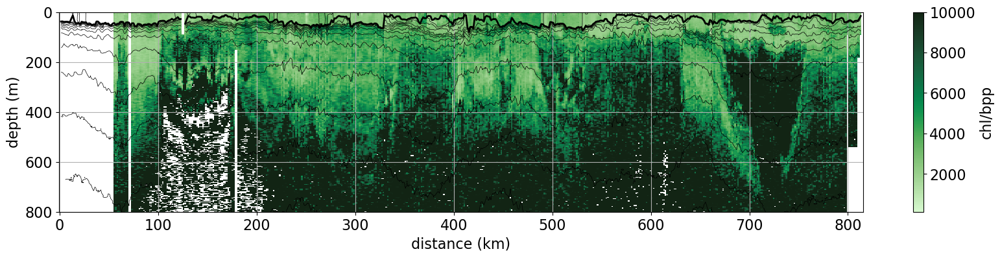

In [107]:
density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
beginning = 25  # Beginning value
ending = 27.8    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)

# Plot the smoothed data
plt.figure(figsize=(20, 4))
plt.ylim(0,800)
plt.pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ratio,cmap=cmo.algae, vmax=10000)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km)')
plt.ylabel('depth (m)')

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('chl/bpp')
#plt.xlim(600,720)


plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Add contours (optional)
plt.contour(density.distance, density.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
#plt.title('after gaussian filter')

plt.show()

 # Combined figure backscatter and  T, S, Oxygen, AOU, Spectral slope, POC

In [14]:
# Replace NaN values with zero in the ds_glider.year_day DataArray
ds_glider['year_day'] = ds_glider['year_day'].fillna(0)

In [15]:
ds_glider

<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544, time: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 ...
    lat             (distance) float64 ...
    time            (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05...
Data variables:
    temp            (ctd_depth, distance) float64 ...
    salinity        (ctd_depth, distance) float64 ...
    o2              (ctd_depth, distance) float64 ...
    sol             (ctd_depth, distance) float64 ...
    p               (ctd_depth, distance) float64 ...
    spectral_slope  (ctd_depth, distance) float64 ...
    bp_470_grid_15  (ctd_depth, distance) float64 ...
    bp_700_grid_15  (ctd_depth, distance) float64 ...
    chl_15          (ctd_depth, distance) float64 nan 86.13 109.8 ... nan nan
    year_day        (time) float64 81.36 81.5 81.59 81.67 ... 143.5 143.6 143.7
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2025-01-22
    comment:        This dataset contains temperature, salinity, oxygen, and ...

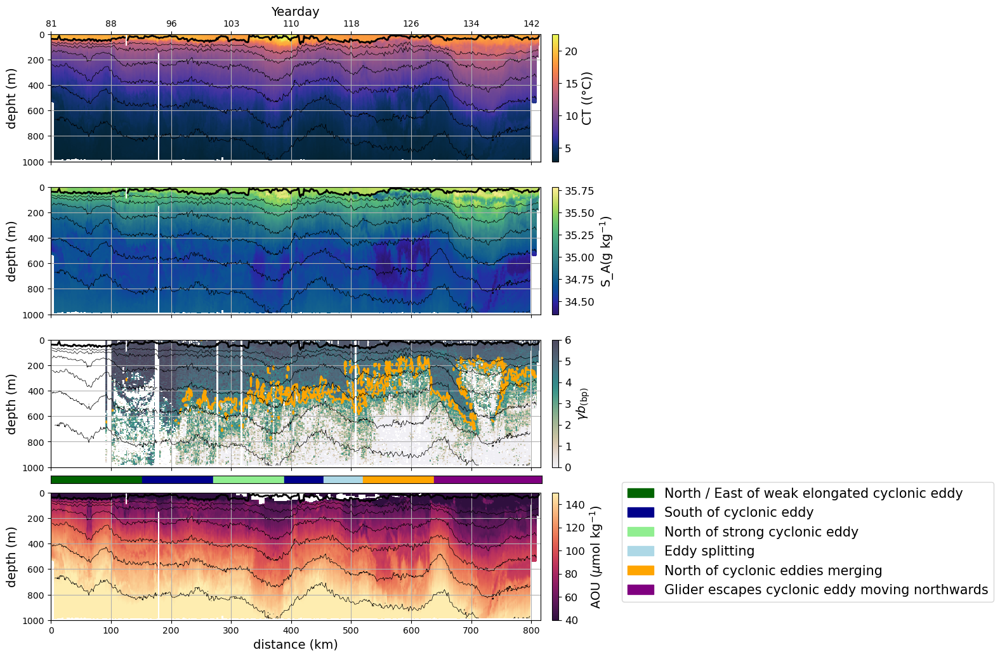

In [104]:
fig, ax = plt.subplots(4, figsize=(12, 12), sharex=True)


density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2

# Create the bar chart

img0 = ax[0].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.temp, cmap = cmo.thermal)
img1 = ax[1].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.salinity, cmap = cmo.haline)
img2 = ax[2].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.spectral_slope,vmin=0, vmax=6, cmap=cmo.rain, alpha= 0.8)
img3 = ax[3].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, AOU, cmap = cmo.matter_r, vmin = 40, vmax = 150)



# Copy the original spectral_slope data
original_spectral_slope = ds_glider.spectral_slope.copy()



# Apply Gaussian smoothing to the entire dataset with sigma=[40, 0]
smoothed_spectral_slope = gaussian_filter(original_spectral_slope, sigma=[20, 0])

# Find the indices where the distance is between 680 and 760, and ctd_depth is less than 300
distance_mask = (ds_glider.distance >= 680) & (ds_glider.distance <= 760)
depth_mask = ds_glider.ctd_depth < 300

# Use np.ix_ to create a combined mask for both dimensions
combined_mask = np.ix_(depth_mask, distance_mask)

# Apply Gaussian smoothing with sigma=[5, 0] only to the region 680 to 760 and depth < 300
smoothed_region = gaussian_filter(original_spectral_slope, sigma=[5, 0])

# Replace the values in the specified region with the new smoothing
smoothed_spectral_slope[combined_mask] = smoothed_region[combined_mask]



# Optionally, add a specific contour at level 4
contour_level_4 = ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, smoothed_spectral_slope, levels=[4], colors='orange', linewidths=2)






[a.invert_yaxis() for a in ax]
# Add colorbars to the plots
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label('CT ((°C))', fontsize=14)
cbar0.ax.tick_params(labelsize=12)

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label('S_A(g kg$^{-1}$)', fontsize=14)
cbar1.ax.tick_params(labelsize=12)

cbar2 = plt.colorbar(img2, ax=ax[2], pad=0.02)
cbar2.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$', fontsize=14)
cbar2.ax.tick_params(labelsize=12)

cbar3 = plt.colorbar(img3, ax=ax[3], pad=0.02)
cbar3.set_label(r'AOU ($\mu$mol kg$^{-1}$)', fontsize=14)
cbar3.ax.tick_params(labelsize=12)

ax[3].set_xlabel('distance (km)')
ax[0].set_ylabel('depht (m)')
ax[1].set_ylabel('depth (m)')
ax[2].set_ylabel('depth (m)')
ax[3].set_ylabel('depth (m)')

# Enable grid for all subplots
for a in ax:
    a.grid()

# Generate levels for the contour lines
# Specify the beginning, ending, and spacing
beginning = 26.4  # Beginning value
ending = 27.8    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)




#ax[0].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
#ax[1].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)


#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.6], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.6], colors='b', linestyle='--', linewidths=1)
#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.8], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.8], colors='b', linestyle='--', linewidths=1)

#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.8], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.8], colors='b', linestyle='--', linewidths=1)
#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27], colors='b', linestyle='--', linewidths=1)

#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27], colors='b', linestyle='--', linewidths=1)
#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.2], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.2], colors='b', linestyle='--', linewidths=1)

#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.2], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.2], colors='b', linestyle='--', linewidths=1)
#ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.4], colors='b', linestyle='--', linewidths=1)
#ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.4], colors='b', linestyle='--', linewidths=1)



ax[0].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[1].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[2].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[3].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)


# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})  # Set the default font size

# Set the xlabel on the top
ax0 = ax[0].twiny()
ax0.set_xlabel('Yearday')

tick_positions = np.arange(0, max(ds_glider.distance), 100)
tick_labels = ds_glider.year_day[np.searchsorted(ds_glider.distance, tick_positions)].astype(int)  # Convert to integers
ax0.set_xlim(ax[0].get_xlim())
ax0.set_xticks(tick_positions)
ax[3].set_xticks(tick_positions)
ax0.set_xticklabels([f'{t:.0f}' for t in tick_labels])

ax0.tick_params(axis='x', which='major', labelsize='10')

# Set font sizes for specific elements
for a in ax:
    a.set_title(a.get_title(), fontsize=14)  # Increase title font size
    a.set_xlabel(a.get_xlabel(), fontsize=14)  # Increase x-axis label font size
    a.set_ylabel(a.get_ylabel(), fontsize=14)  # Increase y-axis label font size
    a.tick_params(axis='both', which='major', labelsize=10)  # Increase tick label font size
    
# Generate levels for the contour lines
beginning = 26.4
ending = 27.8
spacing = 0.2
levels = np.arange(beginning, ending + spacing, spacing)

# Draw contour lines for each subplot
for a in ax:
    a.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
    

# Define the time intervals as day-of-year (DOY)
time_intervals = [
    (81, 93),   # 22-03 till 02-04 (DOY for March 22 is 81)
    (93, 102),  # 02-04 till 11-04
    (102, 111), # 11-04 till 20-04
    (111, 116), # 20-04 till 25-04
    (116, 121), # 25-04 till 01-05
    (121, 130), # 01-05 till 10-05
    (130, ds_glider.year_day.max())  # 08-05 till the end
]

# Colors for each time interval
colors = ['darkgreen', 'darkblue', 'lightgreen', 'darkblue', 'lightblue', 'orange', 'purple']

# Create a new axis at the top for the time-based color bar
ax_colorbar = fig.add_axes([0.125, 0.29, 0.645, 0.01])  # [left, bottom, width, height]



# Draw the horizontal color bar based on time intervals using axvspan
for (start_day, end_day), color in zip(time_intervals, colors):
    ax_colorbar.axvspan(start_day, end_day, color=color, alpha=1.0)
    
# Set the limits of the new axis to match the year_day axis (DOY)
ax_colorbar.set_xlim(ds_glider.year_day.min(), ds_glider.year_day.max())

# Remove the xlabel and ylabel from the color bar
ax_colorbar.set_xlabel('')  # Remove the label
ax_colorbar.set_ylabel('')  # Remove the y-axis label

# Remove ticks and labels from the color bar axis
ax_colorbar.tick_params(axis='both', which='both', length=0)  # No tick marks
ax_colorbar.set_xticks([])  # No x ticks
ax_colorbar.set_yticks([])  # No y ticks (if applicable)


# Create the custom legend for the colors and their meanings
legend_patches = [
    mpatches.Patch(color='darkgreen', label='North / East of weak elongated cyclonic eddy'),
    mpatches.Patch(color='darkblue', label='South of cyclonic eddy'),
    mpatches.Patch(color='lightgreen', label='North of strong cyclonic eddy'),
    mpatches.Patch(color='lightblue', label='Eddy splitting'),
    mpatches.Patch(color='orange', label='North of cyclonic eddies merging'),
    mpatches.Patch(color='purple', label='Glider escapes cyclonic eddy moving northwards')
]

# Position the legend on the side
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1.15, 1), fontsize=15)

# Save the figure
plt.savefig('Combined_backscatter_colorbar.png', bbox_inches='tight', dpi=100)

# Show the plot
plt.show()


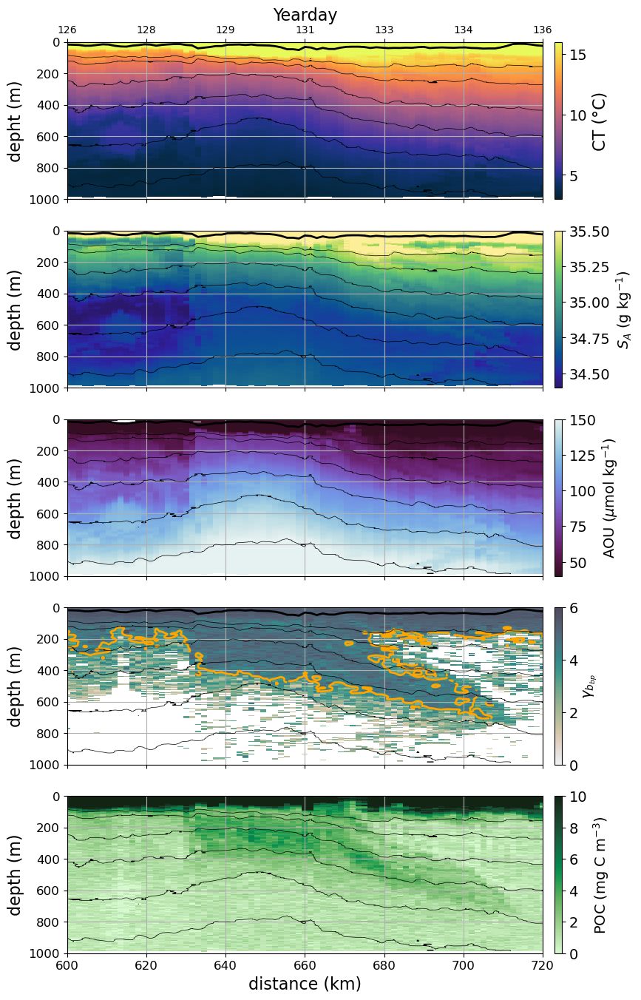

In [249]:
fig, ax = plt.subplots(5, figsize=(10, 16), sharex=True)


density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2

# Create the bar chart

img0 = ax[0].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.temp, cmap = cmo.thermal, vmin=3, vmax=16)
img1 = ax[1].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.salinity, cmap = cmo.haline, vmin= 34.4, vmax = 35.5)
img2 = ax[3].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.spectral_slope,vmin=0, vmax=6, cmap=cmo.rain, alpha= 0.8)
img3 = ax[2].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, AOU, cmap=cmo.dense_r,  vmin = 40, vmax = 150)
img4 = ax[4].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.POC, cmap = cmo.algae, vmin=0, vmax=10)

  




# Copy the original spectral_slope data
original_spectral_slope = ds_glider.spectral_slope.copy()



# Apply Gaussian smoothing to the entire dataset with sigma=[40, 0]
smoothed_spectral_slope = gaussian_filter(original_spectral_slope, sigma=[15, 0])

# Find the indices where the distance is between 680 and 760, and ctd_depth is less than 300
distance_mask = (ds_glider.distance >= 680) & (ds_glider.distance <= 760)
depth_mask = ds_glider.ctd_depth < 300

# Use np.ix_ to create a combined mask for both dimensions
combined_mask = np.ix_(depth_mask, distance_mask)

# Apply Gaussian smoothing with sigma=[5, 0] only to the region 680 to 760 and depth < 300
smoothed_region = gaussian_filter(original_spectral_slope, sigma=[5, 0])

# Replace the values in the specified region with the new smoothing
smoothed_spectral_slope[combined_mask] = smoothed_region[combined_mask]



# Optionally, add a specific contour at level 4
contour_level_4 = ax[3].contour(ds_glider.distance, ds_glider.ctd_depth, smoothed_spectral_slope, levels=[4], colors='orange', linewidths=2)


[a.invert_yaxis() for a in ax]
# Add colorbars to the plots
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label('CT (°C)', fontsize=16)
cbar0.ax.tick_params(labelsize=14)

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label('$S_A$ (g kg$^{-1}$)', fontsize=14)
cbar1.ax.tick_params(labelsize=14)

cbar2 = plt.colorbar(img2, ax=ax[3], pad=0.02)
cbar2.set_label(r'$\gamma_{b_{bp}}$', fontsize=14)
cbar2.ax.tick_params(labelsize=14)

cbar3 = plt.colorbar(img3, ax=ax[2], pad=0.02)
cbar3.set_label(r'AOU ($\mu$mol kg$^{-1}$)', fontsize=14)
cbar3.ax.tick_params(labelsize=14)

cbar4 = plt.colorbar(img4, ax=ax[4], pad=0.02)
cbar4.set_label(r'POC (mg C m$^{-3}$)', fontsize=14)
cbar4.ax.tick_params(labelsize=14)

ax[4].set_xlabel('distance (km)')
ax[0].set_ylabel('depht (m)')
ax[1].set_ylabel('depth (m)')
ax[2].set_ylabel('depth (m)')
ax[3].set_ylabel('depth (m)')
ax[4].set_ylabel('depth (m)')

# Enable grid for all subplots
for a in ax:
    a.grid()
# Generate levels for the contour lines
# Specify the beginning, ending, and spacing
beginning = 26.4  # Beginning value
ending = 27.8    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)

ax[0].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[1].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[2].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[3].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)


# Draw contour lines for each subplot
for a in ax:
    a.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)





# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 16})  # Set the default font size


# Set the xlabel on the top
ax0 = ax[0].twiny()
ax0.set_xlabel('Yearday')

tick_positions = np.arange(0, max(ds_glider.distance), 20)
tick_labels = ds_glider.year_day[np.searchsorted(ds_glider.distance, tick_positions)].astype(int)  # Convert to integers
ax0.set_xlim(ax[0].get_xlim())
ax0.set_xticks(tick_positions)
ax[4].set_xticks(tick_positions)
ax0.set_xticklabels([f'{t:.0f}' for t in tick_labels])

ax0.tick_params(axis='x', which='major', labelsize='10')

# Set font sizes for specific elements
for a in ax:
    a.set_title(a.get_title(), fontsize=16)  # Increase title font size
    a.set_xlabel(a.get_xlabel(), fontsize=16)  # Increase x-axis label font size
    a.set_ylabel(a.get_ylabel(), fontsize=16)  # Increase y-axis label font size
    a.tick_params(axis='both', which='major', labelsize=12)  # Increase tick label font size
    a.set_xlim(600, 720)


# Ensure the top x-axis (Yearday) is consistent
ax0.set_xlim(600, 720)


# Save the figure
plt.savefig('Combined_backscatter_colorbar.png', bbox_inches='tight', dpi=100)


# Show the plot
plt.show()


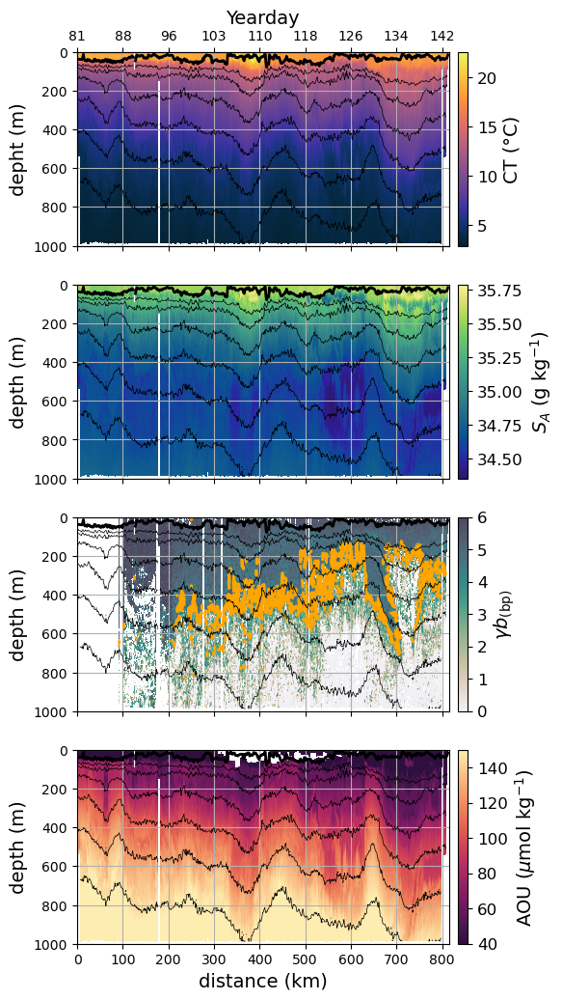

In [116]:
fig, ax = plt.subplots(4, figsize=(6, 12), sharex=True)


density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2

# Create the bar chart

img0 = ax[0].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.temp, cmap = cmo.thermal)
img1 = ax[1].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.salinity, cmap = cmo.haline)
img2 = ax[2].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.spectral_slope,vmin=0, vmax=6, cmap=cmo.rain, alpha= 0.8)
img3 = ax[3].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, AOU, cmap = cmo.matter_r, vmin = 40, vmax = 150)

    




# Copy the original spectral_slope data
original_spectral_slope = ds_glider.spectral_slope.copy()



# Apply Gaussian smoothing to the entire dataset with sigma=[40, 0]
smoothed_spectral_slope = gaussian_filter(original_spectral_slope, sigma=[15, 0])

# Find the indices where the distance is between 680 and 760, and ctd_depth is less than 300
distance_mask = (ds_glider.distance >= 680) & (ds_glider.distance <= 760)
depth_mask = ds_glider.ctd_depth < 300

# Use np.ix_ to create a combined mask for both dimensions
combined_mask = np.ix_(depth_mask, distance_mask)

# Apply Gaussian smoothing with sigma=[5, 0] only to the region 680 to 760 and depth < 300
smoothed_region = gaussian_filter(original_spectral_slope, sigma=[5, 0])

# Replace the values in the specified region with the new smoothing
smoothed_spectral_slope[combined_mask] = smoothed_region[combined_mask]



# Optionally, add a specific contour at level 4
contour_level_4 = ax[2].contour(ds_glider.distance, ds_glider.ctd_depth, smoothed_spectral_slope, levels=[4], colors='orange', linewidths=2)


[a.invert_yaxis() for a in ax]
# Add colorbars to the plots
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label('CT (°C)', fontsize=14)
cbar0.ax.tick_params(labelsize=12)

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label('$S_A$ (g kg$^{-1}$)', fontsize=14)
cbar1.ax.tick_params(labelsize=12)

cbar2 = plt.colorbar(img2, ax=ax[2], pad=0.02)
cbar2.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$', fontsize=14)
cbar2.ax.tick_params(labelsize=12)

cbar3 = plt.colorbar(img3, ax=ax[3], pad=0.02)
cbar3.set_label(r'AOU ($\mu$mol kg$^{-1}$)', fontsize=14)
cbar3.ax.tick_params(labelsize=12)

ax[3].set_xlabel('distance (km)')
ax[0].set_ylabel('depht (m)')
ax[1].set_ylabel('depth (m)')
ax[2].set_ylabel('depth (m)')
ax[3].set_ylabel('depth (m)')

# Enable grid for all subplots
for a in ax:
    a.grid()
# Generate levels for the contour lines
# Specify the beginning, ending, and spacing
beginning = 26.4  # Beginning value
ending = 27.8    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)

ax[0].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[1].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[2].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
ax[3].plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)


# Draw contour lines for each subplot
for a in ax:
    a.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)





# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})  # Set the default font size


# Set the xlabel on the top
ax0 = ax[0].twiny()
ax0.set_xlabel('Yearday')

tick_positions = np.arange(0, max(ds_glider.distance), 100)
tick_labels = ds_glider.year_day[np.searchsorted(ds_glider.distance, tick_positions)].astype(int)  # Convert to integers
ax0.set_xlim(ax[0].get_xlim())
ax0.set_xticks(tick_positions)
ax[3].set_xticks(tick_positions)
ax0.set_xticklabels([f'{t:.0f}' for t in tick_labels])

ax0.tick_params(axis='x', which='major', labelsize='10')

# Set font sizes for specific elements
for a in ax:
    a.set_title(a.get_title(), fontsize=14)  # Increase title font size
    a.set_xlabel(a.get_xlabel(), fontsize=14)  # Increase x-axis label font size
    a.set_ylabel(a.get_ylabel(), fontsize=14)  # Increase y-axis label font size
    a.tick_params(axis='both', which='major', labelsize=10)  # Increase tick label font size
    a.set_ylim(0,1000)


# Ensure the top x-axis (Yearday) is consistent

ax0.set_ylim(0,1000)
[a.invert_yaxis() for a in ax]
# Save the figure
plt.savefig('Combined_backscatter_colorbar.png', bbox_inches='tight', dpi=100)


# Show the plot
plt.show()


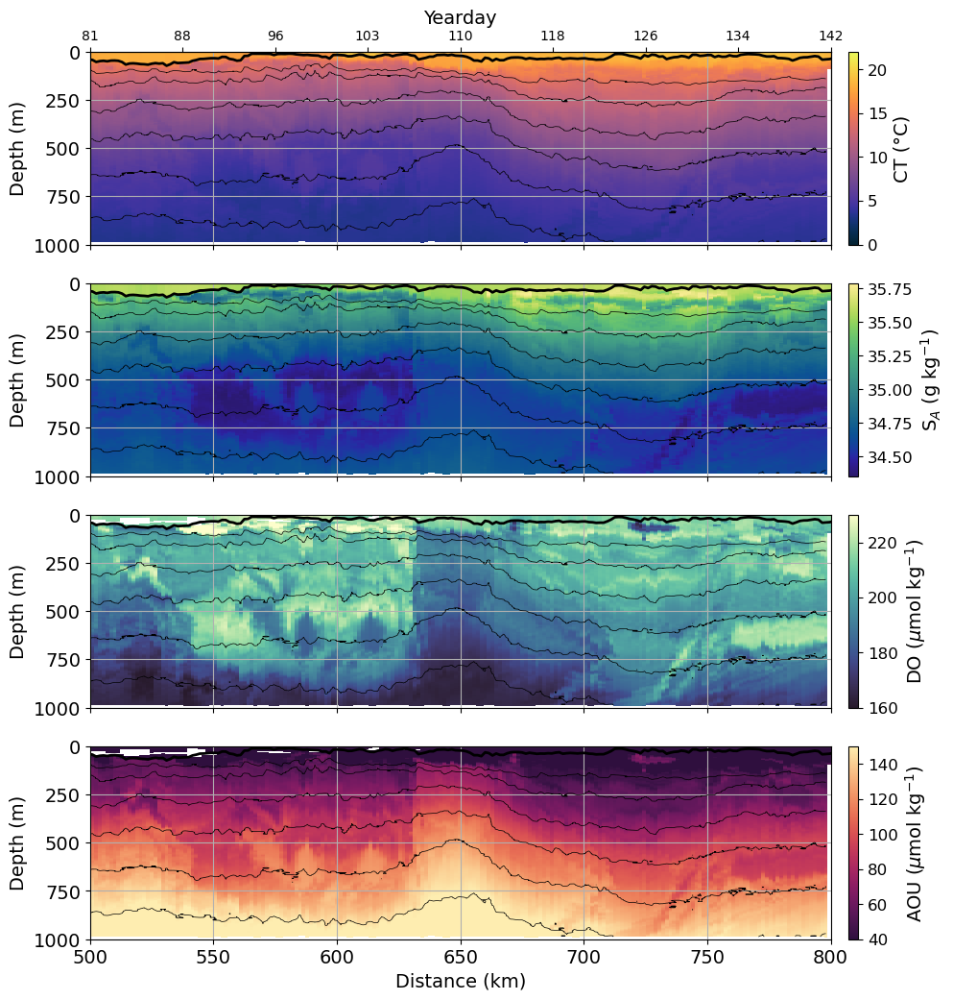

In [141]:
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cmocean.cm as cmo  # Make sure to import cmocean if you use its colormaps
import gsw  # Ensure you have the gsw library for the density calculations

# Create figure and axes for 4 subplots
fig, ax = plt.subplots(4, figsize=(12, 12), sharex=True)

# Define parameters for colormaps
vmin = 160
vmax = 230

# Calculate density and AOU from the provided datasets
density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2

# Create the bar charts for each subplot
img0 = ax[0].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.temp, cmap=cmo.thermal, vmin=0, vmax=22)
img1 = ax[1].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.salinity, cmap=cmo.haline)
img2 = ax[2].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.o2, cmap=cmo.deep_r, vmin=vmin, vmax=vmax)
img3 = ax[3].pcolormesh(ds_glider.distance, ds_glider.ctd_depth, AOU, cmap=cmo.matter_r, vmin=40, vmax=150)

# Invert y-axis for all plots
[a.invert_yaxis() for a in ax]

# Add colorbars to the plots with increased label and tick sizes
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label('CT (°C)', fontsize=14)
cbar0.ax.tick_params(labelsize=12)

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label('S$_{A}$ (g kg$^{-1}$)', fontsize=14)
cbar1.ax.tick_params(labelsize=12)

cbar2 = plt.colorbar(img2, ax=ax[2], pad=0.02)
cbar2.set_label(r'DO ($\mu$mol kg$^{-1}$)', fontsize=14)
cbar2.ax.tick_params(labelsize=12)

cbar3 = plt.colorbar(img3, ax=ax[3], pad=0.02)
cbar3.set_label(r'AOU ($\mu$mol kg$^{-1}$)', fontsize=14)
cbar3.ax.tick_params(labelsize=12)

# Set labels for the x and y axes
ax[3].set_xlabel('Distance (km)')
for a in ax:
    a.set_ylabel('Depth (m)')
    a.set_xlim(500,800)

# Enable grid for all subplots
for a in ax:
    a.grid()

# Generate levels for the contour lines
beginning = 26.4
ending = 27.8
spacing = 0.2
levels = np.arange(beginning, ending + spacing, spacing)

# Draw contour lines for each subplot
for a in ax:
    a.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)

# Plot mixed layer densities
for a in ax:
    a.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})

# Set the xlabel on the top axis
ax0 = ax[0].twiny()
ax0.set_xlabel('Yearday')

# Set tick positions and labels for the top x-axis
tick_positions = np.arange(0, max(ds_glider.distance), 100)
tick_labels = ds_glider.year_day[np.searchsorted(ds_glider.distance, tick_positions)].astype(int)
ax0.set_xlim(ax[0].get_xlim())
ax0.set_xticks(tick_positions)
ax0.set_xticklabels([f'{t:.0f}' for t in tick_labels])
ax0.tick_params(axis='x', which='major', labelsize='10')



# Save the figure
plt.savefig('Combined_glider_speed_with_time_based_colorbar.png', bbox_inches='tight', dpi=100)

# Show the plot
plt.show()


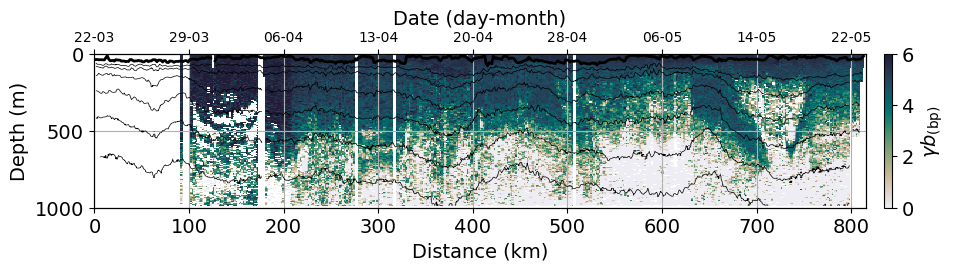

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

fig, ax = plt.subplots(figsize=(12, 2))  # Only create one subplot for the last figure

vmin = 160
vmax = 230

density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2

# Plot the AOU data
img3 = ax.pcolormesh(ds_glider.distance, ds_glider.ctd_depth, ds_glider.spectral_slope, cmap=cmo.rain, vmin=0, vmax=6)

ax.invert_yaxis()

# Add a colorbar to the plot
cbar3 = plt.colorbar(img3, ax=ax, pad=0.02)
cbar3.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$')

ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

# Enable grid
ax.grid()

# Generate levels for the contour lines
beginning = 26.4
ending = 27.8
spacing = 0.2
levels = np.arange(beginning, ending + spacing, spacing)

# Add contour lines
ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)



#ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.6], colors='b', linestyle='--', linewidths=1)
#ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[26.8], colors='b', linestyle='--', linewidths=1)
#ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27], colors='b', linestyle='--', linewidths=1)
#ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.2], colors='b', linestyle='--', linewidths=1)
#ax.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=[27.4], colors='b', linestyle='--', linewidths=1)


# Plot the mixed layer densities
ax.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})

# Set the xlabel on the top
ax_top = ax.twiny()

# Convert yeardays to dates in 2023
year_days = ds_glider.year_day
dates_2023 = pd.to_datetime('2023-01-01') + pd.to_timedelta(year_days - 1, unit='D')

# Generate tick positions and labels in 'day-month' format
tick_positions = np.arange(0, max(ds_glider.distance), 100)
tick_labels = dates_2023[np.searchsorted(ds_glider.distance, tick_positions)].strftime('%d-%m')

ax_top.set_xlim(ax.get_xlim())
ax_top.set_xticks(tick_positions)
ax_top.set_xticklabels(tick_labels)

ax_top.set_xlabel('Date (day-month)')
ax_top.tick_params(axis='x', which='major', labelsize=10)

# Save the figure
plt.savefig('AOU_glider_2023_day_month.png', bbox_inches='tight', dpi=100)

plt.show()


# scatter plot AOU against glider track

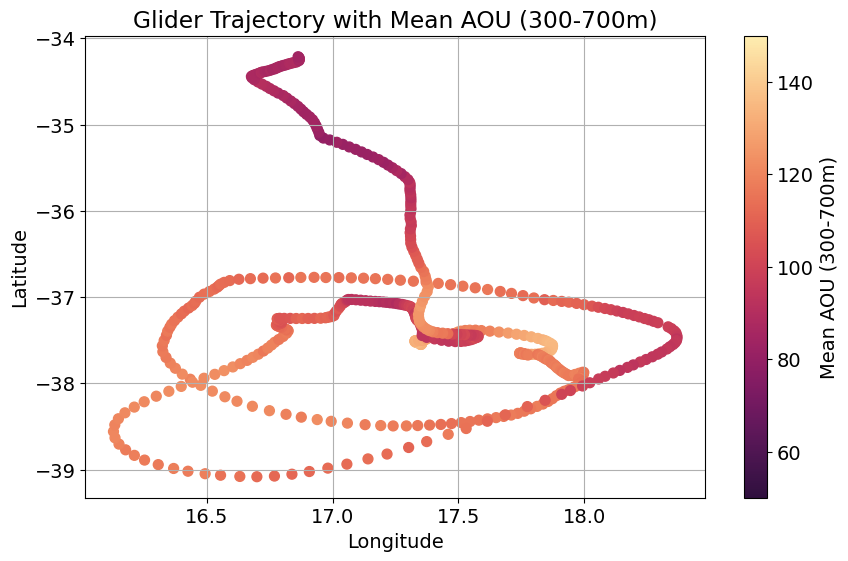

In [91]:
ds_glider['AOU'] = ds_glider.sol - ds_glider.o2

# Step 2: Calculate the mean AOU between 300m and 700m
depth_range = (ds_glider.ctd_depth >= 300) & (ds_glider.ctd_depth <= 700)
mean_AOU = ds_glider.AOU.where(depth_range, drop=True).mean(dim='ctd_depth')

# Step 3: Ensure the mean_AOU and filtered coordinates are aligned in time
#mean_AOU_filtered = mean_AOU.sel(time=lon_filtered.time)

# Step 4: Create the scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(ds_glider.long, ds_glider.lat, c=mean_AOU, cmap = cmo.matter_r, vmin = 50, vmax = 150, s=50)
plt.colorbar(scatter, label='Mean AOU (300-700m)')
plt.title('Glider Trajectory with Mean AOU (300-700m)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)

# Show the plot
plt.show()

# POC

In [204]:
import xarray as xr

# Assuming ds_glider is your dataset and MLD is defined
# Replace MLD with a specific value or an array if it varies across distance

# Apply the conditional multipliers based on ctd_depth
POC = xr.where(
    ds_glider.ctd_depth > MLD,
    ds_glider.bp_700_grid_15 * 31519,
    ds_glider.bp_700_grid_15 * 37537
)

# Assign POC to ds_glider as a new data variable
ds_glider['POC'] = POC

In [13]:
ds_glider.POC

<xarray.DataArray 'POC' (ctd_depth: 2001, distance: 544)>
array([[        nan,         nan,         nan, ..., 17.23073617,
                nan,         nan],
       [        nan,         nan,         nan, ..., 17.23073617,
                nan,         nan],
       [        nan,         nan,         nan, ..., 17.23073617,
        21.10352558,         nan],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])
Coordinates:
  * ctd_depth  (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 998.5 999.0 999.5 1e+03
  * distance   (distance) float64 0.0 1.5 3.0 4.5 ... 810.0 811.5 813.0 814.5
    long       (distance) float64 17.32 17.34 17.35 17.35 ... 16.83 16.82 16.8
    lat        (distance) float64 -37.52 -37.53 -37.54 ... -34.19 -34.18 -34.16
    time       (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05-23T1...

(600.0, 720.0)

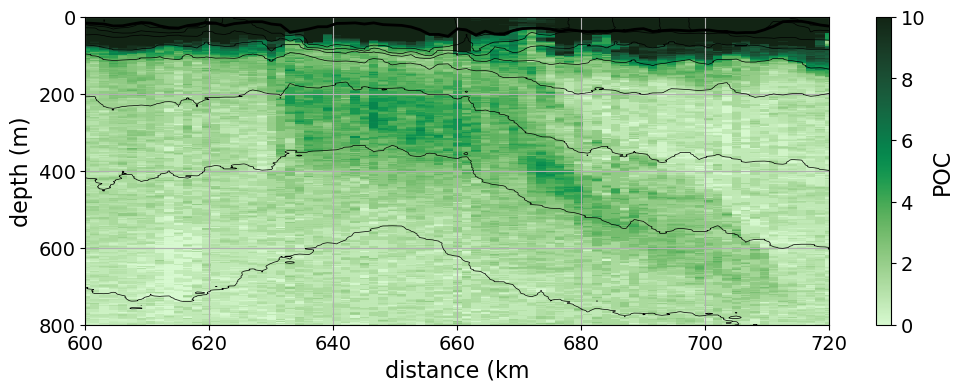

In [237]:
plt.figure(figsize=(12,4))
plt.pcolormesh(POC.distance,POC.ctd_depth,POC,vmin=0,vmax=10,cmap=cmo.algae)
plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
plt.ylim(0,1000)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km')
plt.ylabel('depth (m)')
cbar = plt.colorbar()
cbar.set_label('POC')
plt.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=15, colors='k', linewidths=0.5)
plt.xlim(600,720)


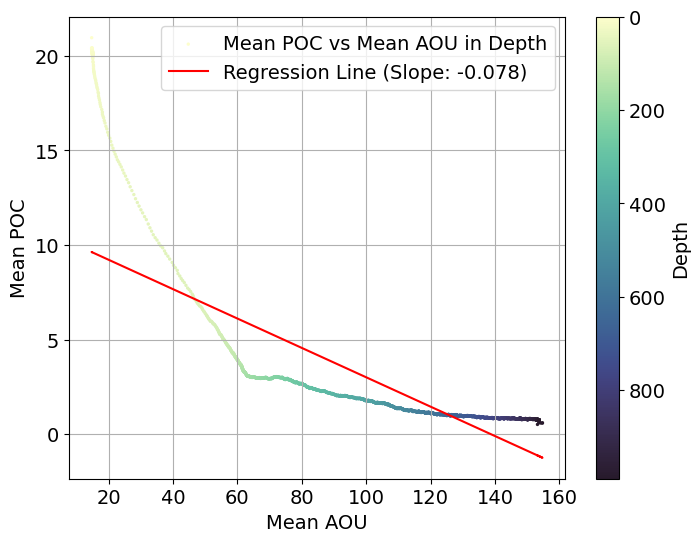

In [321]:
import numpy as np
import matplotlib.pyplot as plt
import cmocean.cm as cmo

ds_glider['AOU'] = ds_glider.sol - ds_glider.o2

# Calculate the mean of POC over the distance dimension
mean_POC = ds_glider.POC.mean(dim="distance")

# Calculate the mean of AOU over the distance dimension
mean_AOU_depth = ds_glider.AOU.mean(dim="distance")

# Flatten the arrays to 1D for easier masking
mean_AOU_depth_flat = mean_AOU_depth.values.flatten()
mean_POC_flat = mean_POC.values.flatten()

# Use the original ctd_depth values for coloring, ensuring it aligns with POC
ctd_depth_flat = ds_glider.ctd_depth.values.flatten()  # Use the original depth values directly

# Create a mask to remove NaN values
valid_mask = ~np.isnan(mean_AOU_depth_flat) & ~np.isnan(mean_POC_flat)

# Apply the mask
clean_mean_AOU_depth = mean_AOU_depth_flat[valid_mask]
clean_mean_POC = mean_POC_flat[valid_mask]
clean_ctd_depth = ctd_depth_flat[valid_mask]  # Use the same mask for ctd_depth

# Scatter plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(clean_mean_AOU_depth, clean_mean_POC, c=clean_ctd_depth, cmap=cmo.deep, s=2, label='Mean POC vs Mean AOU in Depth')

# Perform linear regression on the cleaned data
if len(clean_mean_AOU_depth) > 1 and len(np.unique(clean_mean_AOU_depth)) > 1:
    slope, intercept = np.polyfit(clean_mean_AOU_depth, clean_mean_POC, 1)
    regression_line = np.poly1d([slope, intercept])

    # Plot the regression line
    plt.plot(clean_mean_AOU_depth, regression_line(clean_mean_AOU_depth), color='red', label=f'Regression Line (Slope: {slope:.3f})')

# Add labels and title
plt.xlabel('Mean AOU')
plt.ylabel('Mean POC')
#plt.title('Scatter Plot of Mean POC vs Mean AOU with Regression Line')

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Depth')
cbar.ax.invert_yaxis()

# Show the slope in the legend
plt.legend()

# Add grid
plt.grid(True)

# Show the plot
plt.show()


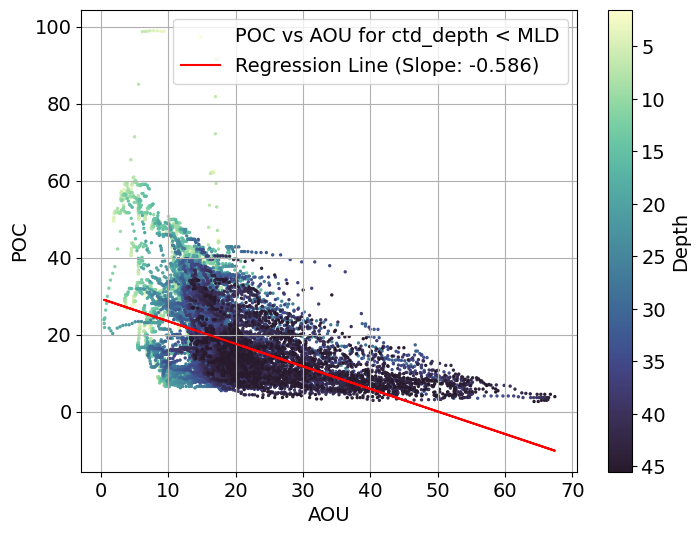

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import cmocean.cm as cmo

# Calculate AOU if not already done
ds_glider['AOU'] = ds_glider.sol - ds_glider.o2

# Flatten the arrays to 1D for easier masking
AOU_flat = ds_glider.AOU.values.flatten()
POC_flat = ds_glider.POC.values.flatten()
ctd_depth_flat = np.repeat(ds_glider.ctd_depth.values, ds_glider.distance.size)  # Repeat depth values along distance dimension

# Create a mask to include only data where ctd_depth < MLD and AOU is valid (non-NaN)
depth_mask = ctd_depth_flat < MLD
valid_mask = ~np.isnan(AOU_flat) & ~np.isnan(POC_flat) & depth_mask

# Apply the mask
clean_AOU = AOU_flat[valid_mask]
clean_POC = POC_flat[valid_mask]
clean_ctd_depth = ctd_depth_flat[valid_mask]  # Use the same mask for ctd_depth

# Scatter plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(clean_AOU, clean_POC, c=clean_ctd_depth, cmap=cmo.deep, s=2, label='POC vs AOU for ctd_depth < MLD')

# Perform linear regression on the cleaned data
if len(clean_AOU) > 1 and len(np.unique(clean_AOU)) > 1:
    slope, intercept = np.polyfit(clean_AOU, clean_POC, 1)
    regression_line = np.poly1d([slope, intercept])

    # Plot the regression line
    plt.plot(clean_AOU, regression_line(clean_AOU), color='red', label=f'Regression Line (Slope: {slope:.3f})')

# Add labels and title
plt.xlabel('AOU')
plt.ylabel('POC')
#plt.title('Scatter Plot of POC vs AOU with Regression Line for ctd_depth < MLD')

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Depth')
cbar.ax.invert_yaxis()

# Show the slope in the legend
plt.legend()

# Add grid
plt.grid(True)

# Show the plot
plt.show()


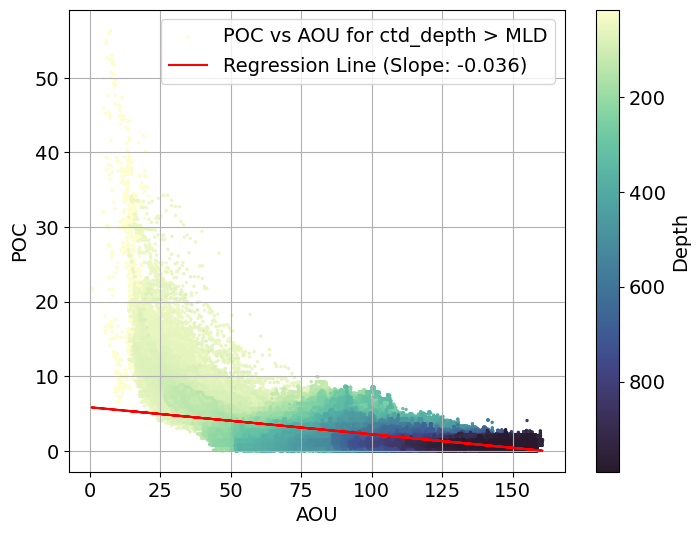

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import cmocean.cm as cmo

# Calculate AOU if not already done
ds_glider['AOU'] = ds_glider.sol - ds_glider.o2

# Flatten the arrays to 1D for easier masking
AOU_flat = ds_glider.AOU.stack(z=("ctd_depth", "distance")).values
POC_flat = ds_glider.POC.stack(z=("ctd_depth", "distance")).values
ctd_depth_flat = ds_glider.ctd_depth.values.repeat(ds_glider.distance.size)  # Repeat depth values only along distance

# Check if MLD is defined along the `distance` dimension and broadcast if necessary
MLD_flat = np.repeat(MLD, ds_glider.ctd_depth.size) if MLD.ndim == 1 else MLD

# Create a mask to include only data where ctd_depth < MLD and AOU is valid (non-NaN)
depth_mask = ctd_depth_flat > MLD_flat
valid_mask = ~np.isnan(AOU_flat) & ~np.isnan(POC_flat) & depth_mask

# Apply the mask
clean_AOU = AOU_flat[valid_mask]
clean_POC = POC_flat[valid_mask]
clean_ctd_depth = ctd_depth_flat[valid_mask]  # Use the same mask for ctd_depth

# Scatter plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(clean_AOU, clean_POC, c=clean_ctd_depth, cmap=cmo.deep, s=2, label='POC vs AOU for ctd_depth > MLD')

# Perform linear regression on the cleaned data
if len(clean_AOU) > 1 and len(np.unique(clean_AOU)) > 1:
    slope, intercept = np.polyfit(clean_AOU, clean_POC, 1)
    regression_line = np.poly1d([slope, intercept])

    # Plot the regression line
    plt.plot(clean_AOU, regression_line(clean_AOU), color='red', label=f'Regression Line (Slope: {slope:.3f})')

# Add labels and title
plt.xlabel('AOU')
plt.ylabel('POC')
#plt.title('Scatter Plot of POC vs AOU with Regression Line for ctd_depth < MLD')

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Depth')
cbar.ax.invert_yaxis()

# Show the slope in the legend
plt.legend()

# Add grid
plt.grid(True)

plt.show()

In [229]:
ds_work['POC'] = POC


# density grid

In [357]:
ds_work= ds_glider
density = gsw.sigma0(ds_work.salinity, ds_work.temp)
delta_rho = np.diff(density)
np.shape(delta_rho)
density = gsw.sigma0(ds_work.salinity, ds_work.temp)
den_grid_002 = np.arange(np.min(density), np.max(density)+0.002, 0.002)

def grid_to_den(density, var, den_grid):
    
    var_grid = np.ndarray([var.distance.size, den_grid.size])
    
    for v in range(var.distance.size):
        
        density_profile = density.isel(distance=v)
        var_profile = var.isel(distance=v)
    
        ind_sort = np.argsort(density_profile.data)
        den_sort = np.sort(density_profile.data)

        var_grid[v] = griddata(den_sort, var_profile[ind_sort], den_grid)
        
    return var_grid
ox_sol = gsw.O2sol(ds_work.salinity, ds_work.temp, ds_work.p, ds_work.long, ds_work.lat)
temp_den_grid_002 = grid_to_den(density, ds_work.temp, den_grid_002)
sal_den_grid_002 = grid_to_den(density, ds_work.salinity, den_grid_002)
ox_den_grid_002 = grid_to_den(density, ds_work.o2, den_grid_002)
sol_den_grid_002 = grid_to_den(density, ox_sol, den_grid_002)
backscatter_den_grid_002 = grid_to_den(density, ds_work.spectral_slope, den_grid_002)
POC_den_grid_002 = grid_to_den(density, ds_work.POC , den_grid_002)
alg_den_grid_002 = grid_to_den(density, ds_work.chl_15 , den_grid_002)


# Create a Dataset with dimensions ctd_depth and ATD
ds_den = xr.Dataset(
    {'temp': (['density', 'distance'], temp_den_grid_002.T),
     'salinity': (['density', 'distance'], sal_den_grid_002.T),
     'o2': (['density', 'distance'], ox_den_grid_002.T),
     'sol': (['density', 'distance'], sol_den_grid_002.T),
     'spectral_slope': (['density', 'distance'], backscatter_den_grid_002.T),
     'POC': (['density', 'distance'], POC_den_grid_002.T),
     'chl': (['density', 'distance'], alg_den_grid_002.T)},
    coords={'density': den_grid_002,
            'distance': ds_work.distance,}
)

# Add attributes to the dataset
ds_den.attrs['description'] = 'dataset including gridded data in density and distance with cleaned variables'


ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral_slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    POC             (density, distance) float64 nan nan nan nan ... nan nan nan
    chl             (density, distance) float64 nan nan nan nan ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...

In [358]:
ds_den['AOU'] = ds_den.sol - ds_den.o2
ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral_slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    POC             (density, distance) float64 nan nan nan nan ... nan nan nan
    chl             (density, distance) float64 nan nan nan nan ... nan nan nan
    AOU             (density, distance) float64 nan nan nan nan ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...


# Mixing Length spice

In [557]:
import numpy as np
from scipy.signal import convolve

# Parameters
window_size = 41  # Window size (odd number)
blackman_window = np.blackman(window_size)  # Blackman window

# Normalize the Blackman window
blackman_window /= blackman_window.sum()

ds_den['temp_filt'] = (('density', 'distance'), np.zeros_like(ds_den['temp'])) 
ds_den['salinity_filt'] = (('density', 'distance'), np.zeros_like(ds_den['salinity'])) 

# Filtering CT
for i in range(ds_den['temp'].shape[1]):
    ds_den['temp_filt'][:, i] = convolve(ds_den['temp'][:, i], blackman_window, mode='same')

# Filtering SA
for i in range(ds_den['salinity'].shape[1]):
    ds_den['salinity_filt'][:, i] = convolve(ds_den['salinity'][:, i], blackman_window, mode='same')

spice = gsw.spiciness0(ds_den.salinity_filt, ds_den.temp_filt)
ds_den['spice'] = spice

df = pd.DataFrame(ds_den.spice)

# Create a mask for the original NaN values
nan_mask = df.isna()

# Apply a rolling mean along each row (distance axis)
window_size = 15

# Calculate the rolling mean with center=True
smoothed_df = df.rolling(window=window_size, min_periods=1, axis=1, center=True).mean()

# Create a smoothed array while keeping original NaNs in place
smoothed_spice = smoothed_df.where(~nan_mask, np.nan)

# Ensure the edges are handled correctly
for i in range(len(smoothed_spice)):
    # For the first point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_spice.iloc[i, 0]) and not nan_mask.iloc[i, 0]:
        smoothed_spice.iloc[i, 0] = df.iloc[i, :window_size].mean()

    # For the last point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_spice.iloc[i, -1]) and not nan_mask.iloc[i, -1]:
        smoothed_spice.iloc[i, -1] = df.iloc[i, -window_size:].mean()

# Ensure original NaNs are retained
smoothed_spice[nan_mask] = np.nan

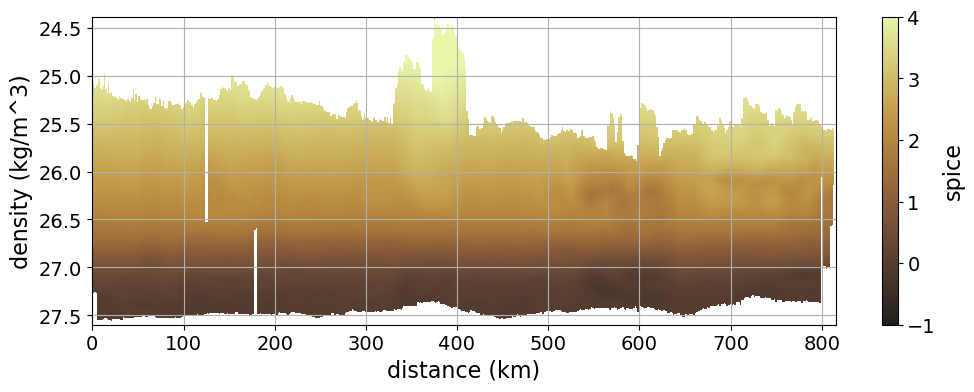

In [558]:
plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance,ds_den.density,smoothed_spice,cmap=cmo.cm.turbid_r,vmin=-1,vmax=4)
#plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km)')
plt.ylabel('density (kg/m^3)')
cbar = plt.colorbar()
cbar.set_label('spice')
#plt.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)


In [572]:
# Calculate N2
spicegrad = np.abs(np.diff(smoothed_spice, axis=1) / 1500)

zero_column = np.zeros((spicegrad.shape[0], 1))

spicegrad = np.hstack([spicegrad,zero_column])
spicegrad

array([[nan, nan, nan, ..., nan, nan,  0.],
       [nan, nan, nan, ..., nan, nan,  0.],
       [nan, nan, nan, ..., nan, nan,  0.],
       ...,
       [nan, nan, nan, ..., nan, nan,  0.],
       [nan, nan, nan, ..., nan, nan,  0.],
       [nan, nan, nan, ..., nan, nan,  0.]])

In [605]:
df = pd.DataFrame(spicegrad)

# Create a mask for the original NaN values
nan_mask = df.isna()

# Apply a rolling mean along each row (distance axis)
window_size = 5

# Calculate the rolling mean with center=True
smoothed_df = df.rolling(window=window_size, min_periods=1, axis=1, center=True).mean()

# Create a smoothed array while keeping original NaNs in place
smoothed_grad = smoothed_df.where(~nan_mask, np.nan)

# Ensure the edges are handled correctly
for i in range(len(smoothed_grad)):
    # For the first point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_grad.iloc[i, 0]) and not nan_mask.iloc[i, 0]:
        smoothed_grad.iloc[i, 0] = df.iloc[i, :window_size].mean()

    # For the last point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_grad.iloc[i, -1]) and not nan_mask.iloc[i, -1]:
        smoothed_grad.iloc[i, -1] = df.iloc[i, -window_size:].mean()

# Ensure original NaNs are retained
smoothed_grad[nan_mask] = np.nan

spicegrad= smoothed_grad

In [573]:
spice = gsw.spiciness0(ds_den.salinity_filt, ds_den.temp_filt)
ds_den['spice'] = spice

df = pd.DataFrame(ds_den.spice)

# Create a mask for the original NaN values
nan_mask = df.isna()

# Apply a rolling mean along each row (distance axis)
window_size = 15

# Calculate the rolling mean with center=True
smoothed_df = df.rolling(window=window_size, min_periods=1, axis=1, center=True).mean()

# Create a smoothed array while keeping original NaNs in place
smoothed_spice = smoothed_df.where(~nan_mask, np.nan)

# Ensure the edges are handled correctly
for i in range(len(smoothed_spice)):
    # For the first point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_spice.iloc[i, 0]) and not nan_mask.iloc[i, 0]:
        smoothed_spice.iloc[i, 0] = df.iloc[i, :window_size].mean()

    # For the last point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_spice.iloc[i, -1]) and not nan_mask.iloc[i, -1]:
        smoothed_spice.iloc[i, -1] = df.iloc[i, -window_size:].mean()

# Ensure original NaNs are retained
smoothed_spice[nan_mask] = np.nan

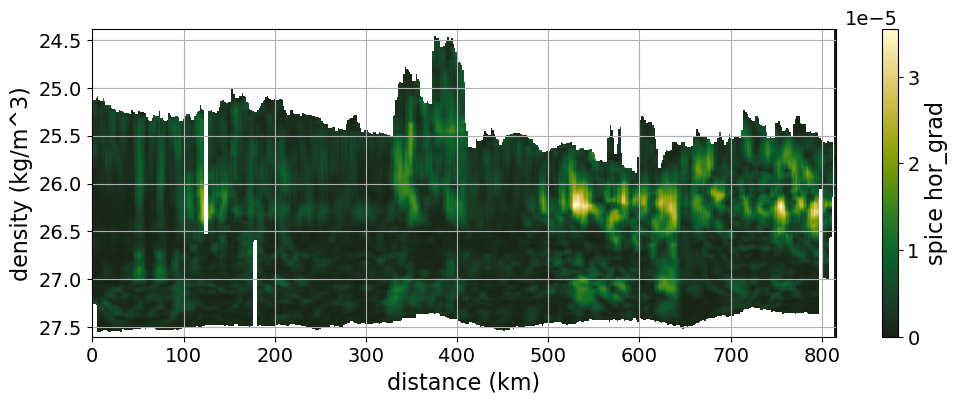

In [606]:
plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance,ds_den.density, spicegrad,cmap=cmo.cm.speed_r)
#plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km)')
plt.ylabel('density (kg/m^3)')
cbar = plt.colorbar()
cbar.set_label('spice hor_grad')

In [607]:
# Step 2: Calculate the deviation of temp_an from the smoothed temperature anomalies
anomaly_to_mean = ds_den.spice - smoothed_spice

# Step 3: Compute the standard deviation along each transect (distance)
anomaly_to_mean

<xarray.DataArray 'spice' (density: 1605, distance: 544)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * density   (density) float64 24.39 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance  (distance) float64 0.0 1.5 3.0 4.5 6.0 ... 810.0 811.5 813.0 814.5

In [608]:
# Initialize an empty list to store the RMS values for each profile (2D array in density and distance)
RMS_2D = []

# Loop over each distance index
for distance_idx in range(anomaly_to_mean.distance.size):
    # Select the profile at the current distance, keeping density dimension intact
    spice_an_profile = anomaly_to_mean.isel(distance=distance_idx)
    
    # Calculate the squared anomaly for the current profile across density
    squared_anomaly_profile = spice_an_profile ** 2
    
    # Divide by the number of non-NaN values along the density axis
    N = np.sum(~np.isnan(squared_anomaly_profile), axis=0)  # Number of valid (non-NaN) data points per density
    RMS_profile = np.sqrt(squared_anomaly_profile )  # RMS along the density dimension
    
    # Append the result to RMS_2D
    RMS_2D.append(RMS_profile)

# Stack the list into a 2D array in density and distance dimensions
RMS_2D_array = xr.DataArray(
    RMS_2D, 
    coords=[ds_den.distance, ds_den.density], 
    dims=["distance", "density"]
).transpose("density", "distance")

RMS_2D_array

<xarray.DataArray (density: 1605, distance: 544)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * distance  (distance) float64 0.0 1.5 3.0 4.5 6.0 ... 810.0 811.5 813.0 814.5
  * density   (density) float64 24.39 24.39 24.39 24.39 ... 27.59 27.59 27.6

In [609]:
df = pd.DataFrame(RMS_2D_array)

# Create a mask for the original NaN values
nan_mask = df.isna()

# Apply a rolling mean along each row (distance axis)
window_size = 5

# Calculate the rolling mean with center=True
smoothed_df = df.rolling(window=window_size, min_periods=1, axis=1, center=True).mean()

# Create a smoothed array while keeping original NaNs in place
smoothed_grad = smoothed_df.where(~nan_mask, np.nan)

# Ensure the edges are handled correctly
for i in range(len(smoothed_grad)):
    # For the first point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_grad.iloc[i, 0]) and not nan_mask.iloc[i, 0]:
        smoothed_grad.iloc[i, 0] = df.iloc[i, :window_size].mean()

    # For the last point, set to the mean of available points if it is not NaN in the original
    if pd.isna(smoothed_grad.iloc[i, -1]) and not nan_mask.iloc[i, -1]:
        smoothed_grad.iloc[i, -1] = df.iloc[i, -window_size:].mean()

# Ensure original NaNs are retained
smoothed_grad[nan_mask] = np.nan

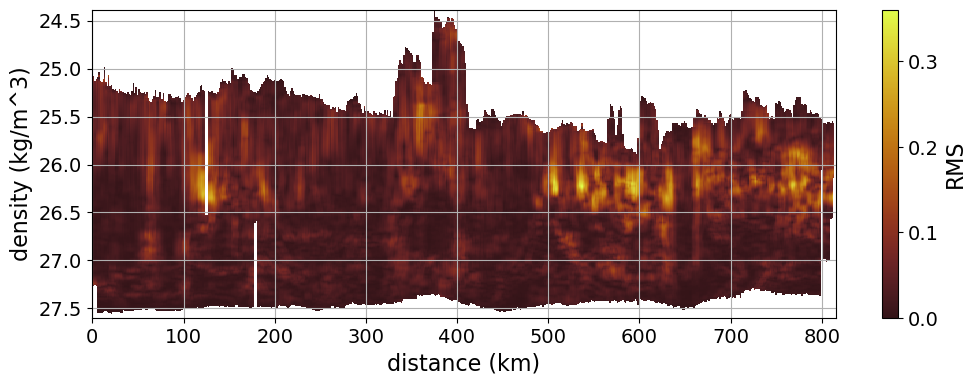

In [601]:
plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance,ds_den.density,smoothed_grad,cmap=cmo.cm.solar)
#plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km)')
plt.ylabel('density (kg/m^3)')
cbar = plt.colorbar()
cbar.set_label('RMS')

In [610]:
Mixing_Length = smoothed_grad/spicegrad
Mixing_Length

,0,1,2,3,4,5,6,7,8,9,...,534,535,536,537,538,539,540,541,542,543
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1602,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1603,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


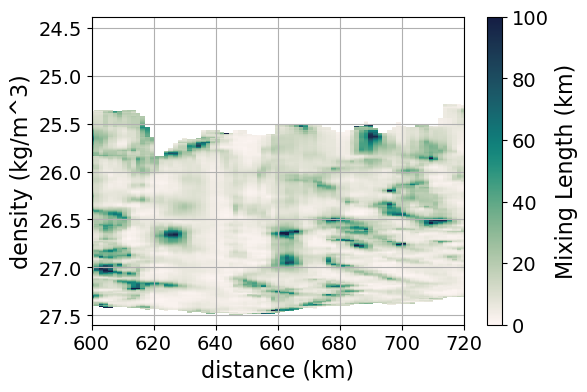

In [612]:
plt.figure(figsize=(6,4))
plt.pcolormesh(ds_den.distance,ds_den.density,Mixing_Length/1000,cmap=cmo.cm.tempo,vmin=0,vmax=100)
#plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth =2)
plt.gca().invert_yaxis()
plt.grid()
plt.xlim(600,720)
plt.xlabel('distance (km)')
plt.ylabel('density (kg/m^3)')
cbar = plt.colorbar()
cbar.set_label('Mixing Length (km)')

In [613]:
import xarray as xr
import numpy as np

# Ensure Mixing_Length is a NumPy array
Mixing_Length_array = Mixing_Length.to_numpy()  # Convert DataFrame to NumPy array

# Check if Mixing_Length contains only NaN values
if np.isnan(Mixing_Length_array).all():
    raise ValueError("Mixing_Length contains only NaN values. Cannot add it to the dataset.")

# Convert Mixing_Length to an xarray.DataArray
mixing_length_da = xr.DataArray(
    Mixing_Length_array,
    dims=["density", "distance"],  # Dimensions matching ds_den
    coords={
        "density": ds_den.density,  # Use ds_den's density coordinate
        "distance": ds_den.distance  # Use ds_den's distance coordinate
    },
    name="Mixing_Length"  # Name of the variable
)

# Add Mixing_Length to ds_den
ds_den["Mixing_Length"] = mixing_length_da

# Inspect the updated dataset
print(ds_den)


<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral_slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    POC             (density, distance) float64 nan nan nan nan ... nan nan nan
    chl             (density, distance) float64 nan nan nan nan ... nan nan nan
    AOU             (density, distance) float64 nan nan nan nan ... nan nan nan
    temp_filt       (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity_filt   (density,

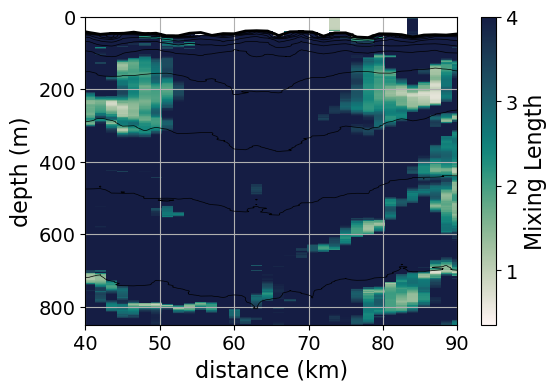

In [614]:
from scipy.interpolate import griddata
import numpy as np

# Ensure Mixing_Length is a 2D array
Mixing_Length_array = ds_den["Mixing_Length"].data

# Get the density and distance grid from ds_den
density_grid = ds_den["density"].data
distance_grid = ds_den["distance"].data

# Get the original density from ds_work
density_original = gsw.sigma0(ds_work["salinity"], ds_work["temp"]).data

# Create an empty array to store remapped Mixing_Length
Mixing_Length_remapped = np.full_like(ds_work["temp"], np.nan)  # Same shape as ds_work's variables

# Loop through each distance point and interpolate back to depth
for i, dist in enumerate(ds_work["distance"]):
    if not np.isnan(density_original[:, i]).all():
        # Interpolate Mixing_Length from density grid to depth
        Mixing_Length_remapped[:, i] = griddata(
            density_grid,  # Input density grid
            Mixing_Length_array[:, i],  # Corresponding Mixing_Length values
            density_original[:, i],  # Target densities at each depth
            method="linear",  # Linear interpolation
            fill_value=np.nan,  # Handle out-of-bounds densities
        )

# Add remapped Mixing_Length to ds_work
ds_work["Mixing_Length"] = (["depth", "distance"], Mixing_Length_remapped)

# Inspect the updated dataset
ds_work

beginning = 25  # Beginning value
ending = 28    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)

# Plot the smoothed data
plt.figure(figsize=(6, 4))
plt.pcolormesh(ds_work.distance, ds_work.ctd_depth, ds_work.Mixing_Length/1000,cmap=cmo.cm.tempo, vmax=4)
plt.ylim(0,850)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel('distance (km)')
plt.ylabel('depth (m)')

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Mixing Length')
plt.xlim(40,90)

plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Add contours (optional)
plt.contour(density.distance, density.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
#plt.title('after gaussian filter')

plt.show()

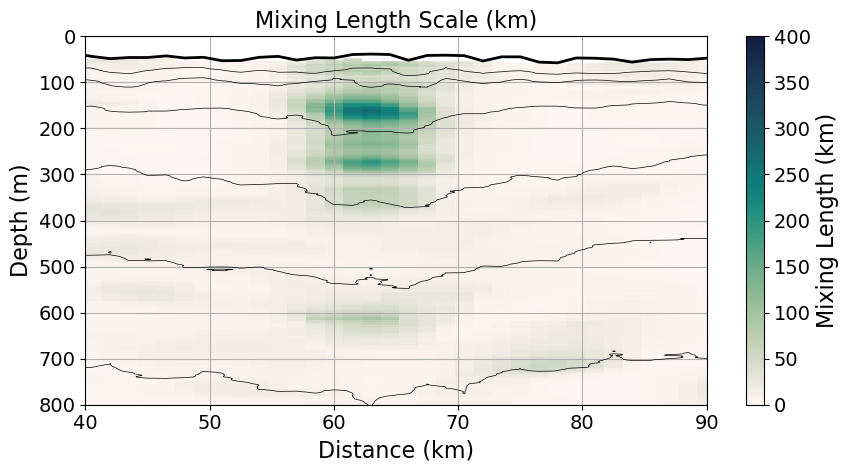

In [621]:
import matplotlib.pyplot as plt
import cmocean as cmo
import numpy as np

# Define a function for the 5-point running mean
def running_mean(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='same')

# Extract and process the data for Mixing Length Scale
mixing_length_data = ds_work["Mixing_Length"].data / 1000  # Convert Mixing Length to km

# Apply 5-point running mean smoothing along the distance dimension
smoothed_mixing_length = np.apply_along_axis(running_mean, axis=1, arr=mixing_length_data)

# Create the plot
fig, ax = plt.subplots(figsize=(9, 5))

# Plot the smoothed Mixing Length Scale
cmesh = ax.pcolormesh(
    ds_work.distance,
    ds_work.ctd_depth,
    smoothed_mixing_length,
    cmap=cmo.cm.tempo,
    vmin=0,
    vmax=400
)

# Add the mixed layer density line
ax.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Add density contours
ax.contour(
    density.distance,
    density.ctd_depth,
    density,
    levels=np.arange(26.4, 27.8, 0.2),  # Example levels
    colors='k',
    linewidths=0.5
)

# Customize plot
ax.set_ylim(0, 800)
ax.invert_yaxis()  # Invert depth axis
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')
ax.set_title('Mixing Length Scale (km)')
ax.grid(True)
ax.set_xlim(40, 90)

# Add colorbar
cbar = plt.colorbar(cmesh, ax=ax)
cbar.set_label("Mixing Length (km)")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


# spice and spiciness curvature 

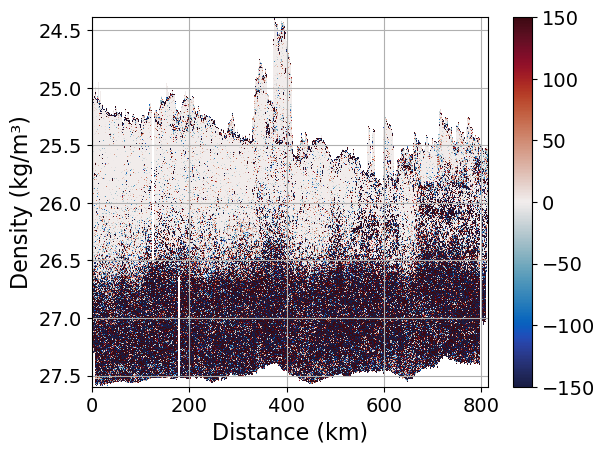

In [351]:
spice = spice = gsw.spiciness0(ds_den.salinity, ds_den.temp)

first_da = (np.diff(spice, axis=0)/-0.002)

zero_row = np.zeros((1, first_da.shape[1])) 

# Concatenate the zero row to the top of N2
first_da = np.vstack([zero_row, first_da])

second_da = (np.diff(first_da, axis=0)/-0.002)

zero_row = np.zeros((1, second_da.shape[1])) 

# Concatenate the zero row to the top of N2
second_da = np.vstack([zero_row, second_da])

plt.pcolormesh(ds_den.distance, ds_den.density, second_da, cmap = cmo.cm.balance,vmin= -150, vmax = 150)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.gca().invert_yaxis()
plt.grid()
cbar = plt.colorbar()

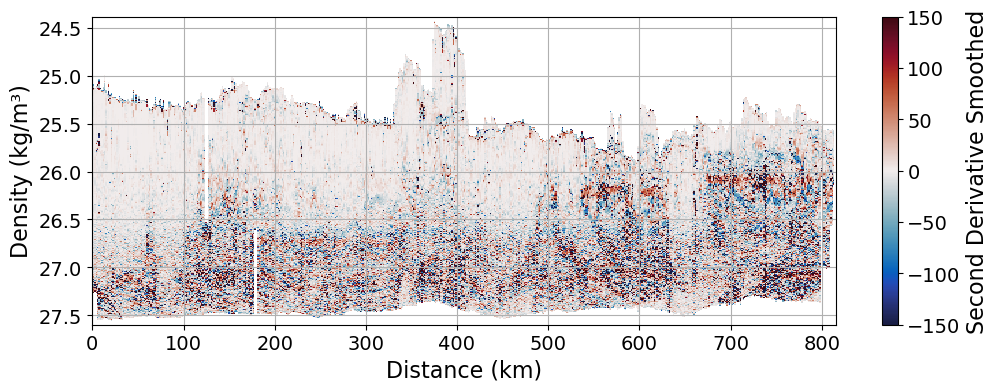

In [158]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean.cm as cmo
from scipy.ndimage import uniform_filter1d  # Alternative for rolling mean smoothing

  # Calculate the density interval
window_size = 41  # Number of points corresponding to 8 kg/m³

# Create the second_da DataArray for smoothing, assuming it is aligned with ds_den coordinates
second_da_xr = xr.DataArray(
    second_da,
    coords={'density': ds_den.density, 'distance': ds_den.distance},
    dims=['density', 'distance']
)

# Apply rolling mean or smoothing over the 'density' axis
smoothed_second_da = second_da_xr.rolling(density=window_size, center=True).mean()

# Optionally, if NaNs need to be handled, fill or interpolate as necessary
#smoothed_second_da = smoothed_second_da.fillna(0)  # or use interpolation if preferred


plt.figure(figsize=(12,4))
# Plot the smoothed data
plt.pcolormesh(ds_den.distance, ds_den.density, smoothed_second_da, cmap=cmo.balance, vmin=-150, vmax=150)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.gca().invert_yaxis()
plt.grid()
cbar = plt.colorbar()
cbar.set_label('Second Derivative Smoothed')
plt.show()


In [292]:
import numpy as np
from scipy.signal import convolve

# Parameters
window_size = 41  # Window size (odd number)
blackman_window = np.blackman(window_size)  # Blackman window

# Normalize the Blackman window
blackman_window /= blackman_window.sum()

ds_den['temp_filt'] = (('density', 'distance'), np.zeros_like(ds_den['temp'])) 
ds_den['salinity_filt'] = (('density', 'distance'), np.zeros_like(ds_den['salinity'])) 

# Filtering CT
for i in range(ds_den['temp'].shape[1]):
    ds_den['temp_filt'][:, i] = convolve(ds_den['temp'][:, i], blackman_window, mode='same')

# Filtering SA
for i in range(ds_den['salinity'].shape[1]):
    ds_den['salinity_filt'][:, i] = convolve(ds_den['salinity'][:, i], blackman_window, mode='same')

In [293]:
spice = gsw.spiciness0(ds_den.salinity_filt, ds_den.temp_filt)
ds_den['spice'] = spice

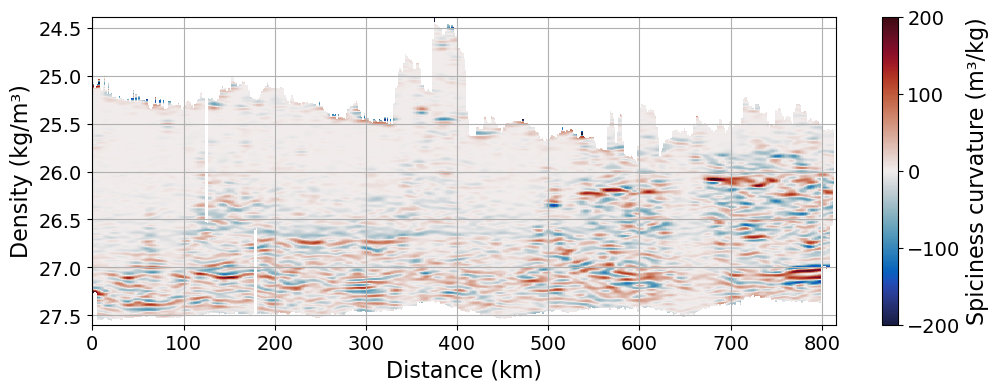

In [161]:
import cmocean.cm as cmo
first_da = (np.diff(spice, axis=0)/-0.002)

zero_row = np.zeros((1, first_da.shape[1])) 

# Concatenate the zero row to the top of N2
first_da = np.vstack([zero_row, first_da])

second_da = (np.diff(first_da, axis=0)/-0.002)

zero_row = np.zeros((1, second_da.shape[1])) 

# Concatenate the zero row to the top of N2
second_da = np.vstack([zero_row, second_da])


import numpy as np
from scipy.ndimage import gaussian_filter

# Define sigma for the Gaussian filter
sigma = 3


# Create a mask where NaN values are False and others are True
mask = np.isfinite(second_da)

# Replace NaNs with zero for smoothing
second_da_filled = np.where(mask, second_da, 0)

# Apply Gaussian filter to the filled data
smoothed_data = gaussian_filter(second_da_filled, sigma=sigma)

# Apply Gaussian filter to the mask to create a weight map
smoothed_mask = gaussian_filter(mask.astype(float), sigma=sigma)

# Divide the smoothed data by the smoothed mask to exclude NaNs influence
second_da_smoothed = smoothed_data / smoothed_mask

# Place the original NaN values back into the smoothed data
second_da_smoothed[~mask] = np.nan

plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance, ds_den.density, second_da_smoothed, cmap = cmo.balance,vmin= -200, vmax = 200)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
#plt.xlim(600,720)
plt.gca().invert_yaxis()
plt.grid()
cbar = plt.colorbar()
cbar.set_label('Spiciness curvature (m³/kg)')

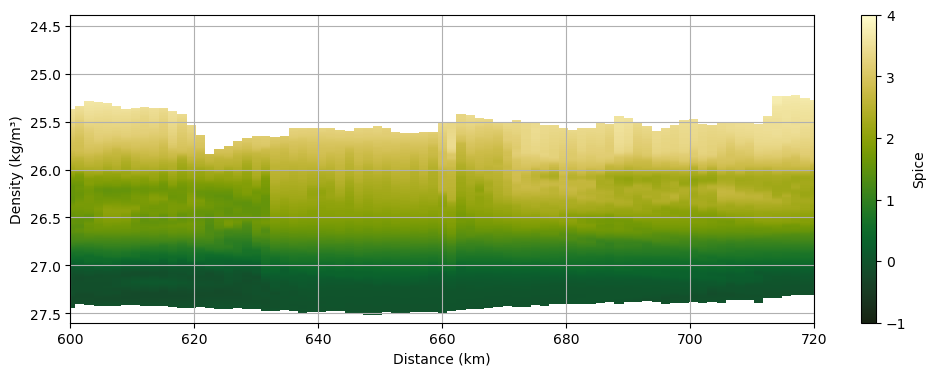

In [37]:
plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance, ds_den.density, spice, cmap = cmo.speed_r, vmin=-1, vmax=4)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.xlim(600,720)
plt.gca().invert_yaxis()
plt.grid()
cbar = plt.colorbar()
cbar.set_label('Spice')

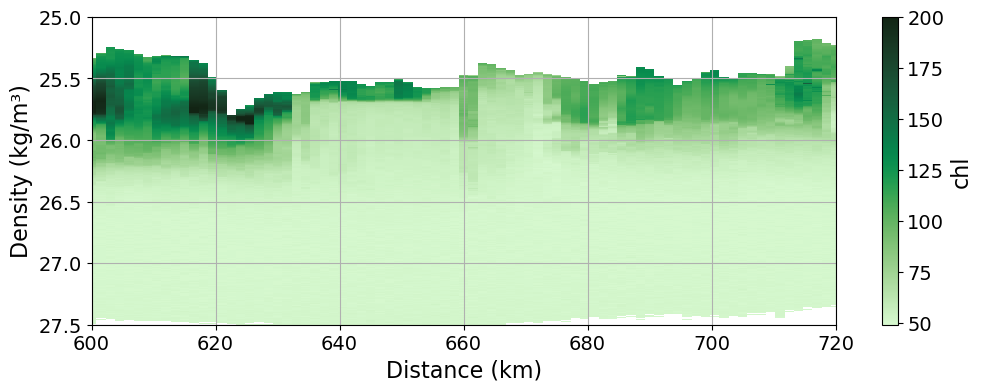

In [235]:
plt.figure(figsize=(12,4))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den.chl, cmap = cmo.algae, vmax=200)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.xlim(600,720)
plt.ylim(25,27.5)
plt.gca().invert_yaxis()
plt.grid()
cbar = plt.colorbar()
cbar.set_label('chl')

In [290]:
# Define as DataArray with explicit dimensions
second_da_smoothed_xr = xr.DataArray(
    second_da_smoothed,
    coords={'density': ds_den.density, 'distance': ds_den.distance},
    dims=['density', 'distance']
)

# Assign smoothed data to `ds_den`
ds_den['spice_curv'] = second_da_smoothed_xr

In [291]:
ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral_slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    POC             (density, distance) float64 nan nan nan nan ... nan nan nan
    chl             (density, distance) float64 nan nan nan nan ... nan nan nan
    spice_curv      (density, distance) float64 0.0 0.0 0.0 0.0 ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...

In [77]:
ds_work["ctd_depth"].data 

array([0.000e+00, 5.000e-01, 1.000e+00, ..., 9.990e+02, 9.995e+02,
       1.000e+03])

spice shape: (1605, 544)
spice_curv shape: (1605, 544)
spectral_slope shape: (1605, 544)
AOU shape: (1605, 544)
Processing spice...
Reshaped density_grid to 2D: (1605, 544)
Expanded depth_grid to 2D: (2001, 544)
Processing spice_curv...
Reshaped density_grid to 2D: (1605, 544)
Expanded depth_grid to 2D: (2001, 544)
Processing spectral_slope...
Reshaped density_grid to 2D: (1605, 544)
Expanded depth_grid to 2D: (2001, 544)
Processing AOU...
Reshaped density_grid to 2D: (1605, 544)
Expanded depth_grid to 2D: (2001, 544)


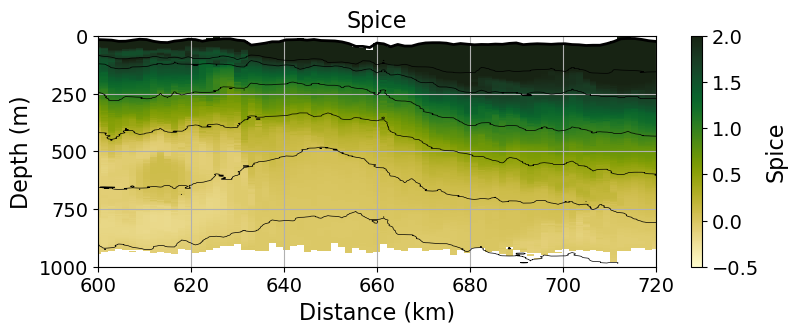

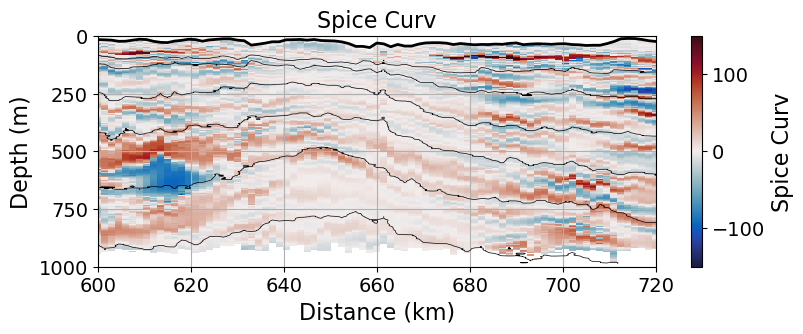

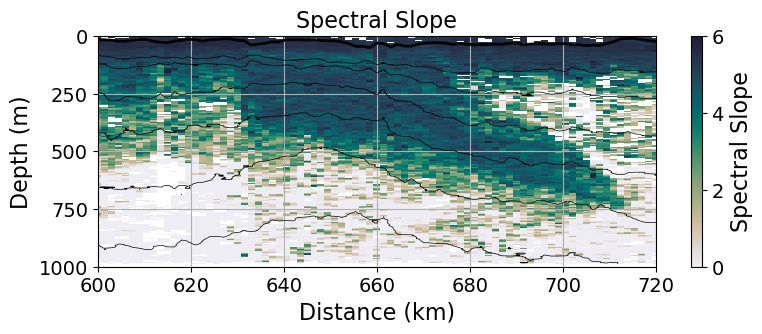

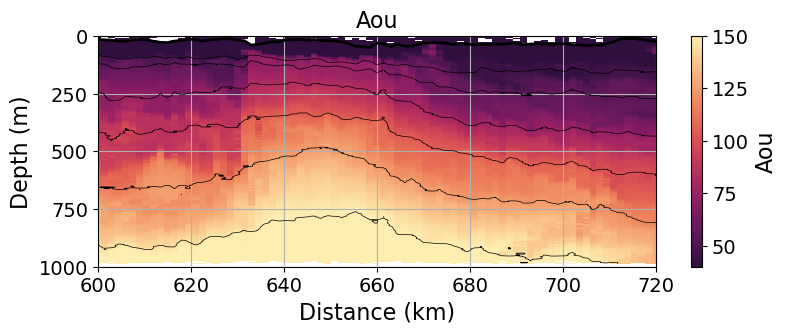

In [164]:
from scipy.interpolate import griddata

variables = ["spice", "spice_curv", "spectral_slope", "AOU"]
for var in variables:
    if var not in ds_den.data_vars:
        raise ValueError(f"Variable '{var}' not found in ds_den.")
    var_density_space = ds_den[var].data
    print(f"{var} shape:", np.shape(var_density_space))

depth_grid = ds_work["ctd_depth"].data 

def remap_to_depth(var_density_space, density_grid, depth_grid, density_original):
    # Ensure density_grid is 2D
    if len(density_grid.shape) == 1:
        density_grid = np.tile(density_grid[:, None], (1, var_density_space.shape[1]))
        print("Reshaped density_grid to 2D:", density_grid.shape)

    # Ensure depth_grid matches density_original
    if depth_grid.shape != density_original.shape:
        if len(depth_grid.shape) == 1:  # If 1D, expand to 2D
            depth_grid = np.tile(depth_grid[:, None], (1, density_original.shape[1]))
            print("Expanded depth_grid to 2D:", depth_grid.shape)
        else:
            raise ValueError("Depth grid shape is incompatible with density_original.")

    # Ensure shapes match
    assert density_grid.shape == var_density_space.shape, "Density and variable mismatch in shape!"
    assert depth_grid.shape == density_original.shape, "Depth grid and density_original mismatch!"

    # Create an empty array for the remapped variable
    remapped_var = np.full_like(density_original, np.nan)

    # Loop through each distance point
    for i in range(density_original.shape[1]):  # Iterate over columns (distance points)
        if not np.isnan(density_original[:, i]).all():
            remapped_var[:, i] = griddata(
                density_grid[:, i],          # Density grid for this distance point
                var_density_space[:, i],     # Corresponding variable values
                density_original[:, i],      # Target densities at each depth
                method="linear",
                fill_value=np.nan,
            )
    return remapped_var


variables = ["spice", "spice_curv", "spectral_slope", "AOU"]

for var in variables:
    print(f"Processing {var}...")
    var_density_space = ds_den[var].data
    remapped_var = remap_to_depth(
        var_density_space,
        density_grid,
        ds_work.ctd_depth.data,
        density_original,
    )
    ds_work[var] = (["depth", "distance"], remapped_var)
    
# Plot remapped variables
cmap_dict = {
    "spice": cmo.speed,
    "spice_curv": cmo.balance,
    "spectral_slope": cmo.rain,
    "AOU": cmo.matter_r,
}
vmin_dict = {"spice": -0.5, "spice_curv": -150, "spectral_slope": 0, "AOU": 40}
vmax_dict = {"spice": 2, "spice_curv": 150, "spectral_slope": 6, "AOU": 150}

for var in variables:
    plt.figure(figsize=(9, 3))
    plt.pcolormesh(
        ds_work.distance,
        ds_work.ctd_depth,
        ds_work[var].data,
        cmap=cmap_dict[var],
        vmin=vmin_dict[var],
        vmax=vmax_dict[var],
    )
    plt.xlabel('Distance (km)')
    plt.ylabel('Depth (m)')
    plt.title(var.replace('_', ' ').title())
    plt.gca().invert_yaxis()
    plt.grid(True)
    cbar = plt.colorbar()
    cbar.set_label(var.replace('_', ' ').title())
    plt.xlim(600, 720)
    
    plt.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

    # Add contours (optional)
    plt.contour(density.distance, density.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
    plt.show()


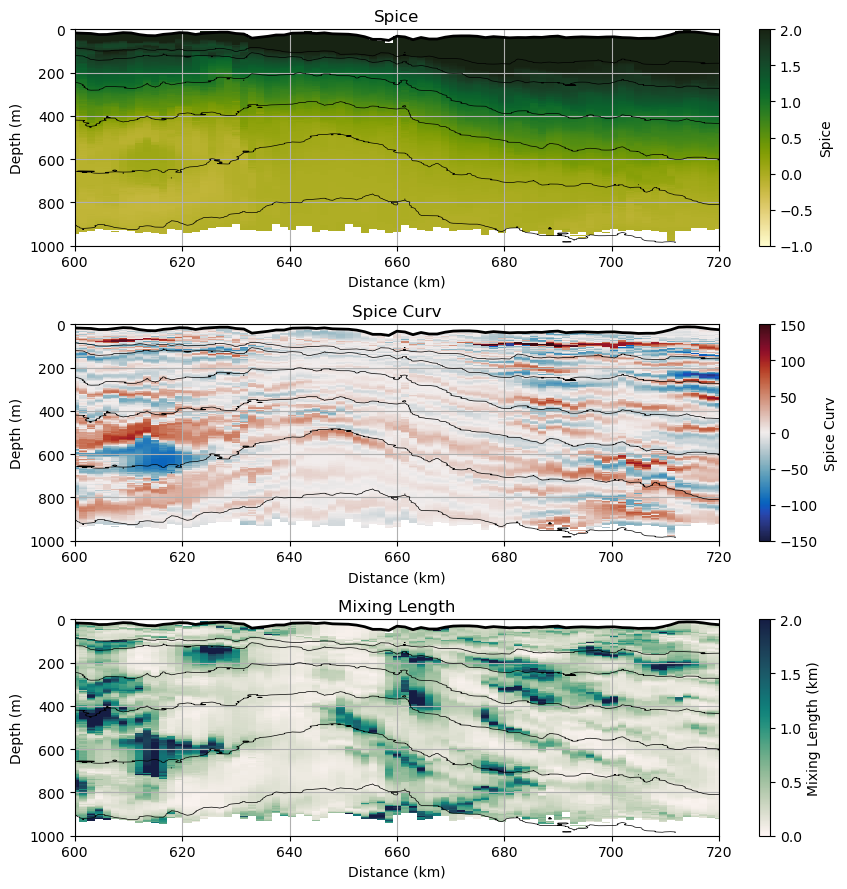

In [93]:
import matplotlib.pyplot as plt
import cmocean as cmo

# Define the variables to be plotted
variables = ["spice", "spice_curv", "Mixing_Length"]

# Create the subplots (3 rows, 1 column)
fig, axes = plt.subplots(3, 1, figsize=(9, 9))

# Loop through each variable and create its corresponding subplot
for idx, var in enumerate(variables):
    ax = axes[idx]  # Get the current subplot axis
    
    # Plot the variable data (spice, spice_curv, or Mixing_Length)
    if var == "Mixing_Length":
        data_to_plot = ds_work[var].data / 1000  # Convert Mixing Length to km
        cmap = cmo.cm.tempo
        vmax = 2
        vmin =0
        cbar_label = "Mixing Length (km)"
    else:
        data_to_plot = ds_work[var].data
        if var == "spice":
            cmap = cmo.cm.speed
            vmax = 2
            vmin = -1
        elif var == "spice_curv":
            cmap = cmo.cm.balance
            vmin=-150
            vmax = 150
        cbar_label = var.replace('_', ' ').title()

    # Plot the pcolormesh for the current variable
    cmesh = ax.pcolormesh(
        ds_work.distance,
        ds_work.ctd_depth,
        data_to_plot,
        cmap=cmap,
        vmax=vmax,
        vmin=vmin
    )
    
    # Add the mixed layer density line
    ax.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)
    
    # Add density contours
    ax.contour(
        density.distance,
        density.ctd_depth,
        density,
        levels=np.arange(26.4, 27.8, 0.2),  # Example levels
        colors='k',
        linewidths=0.5
    )
    
    # Customize plot
    ax.invert_yaxis()  # Invert depth axis
    ax.set_xlabel('Distance (km)')
    ax.set_ylabel('Depth (m)')
    ax.set_title(var.replace('_', ' ').title())
    ax.grid(True)
    ax.set_xlim(600, 720)
    
    # Add colorbar for the current subplot
    cbar = plt.colorbar(cmesh, ax=ax)
    cbar.set_label(cbar_label)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


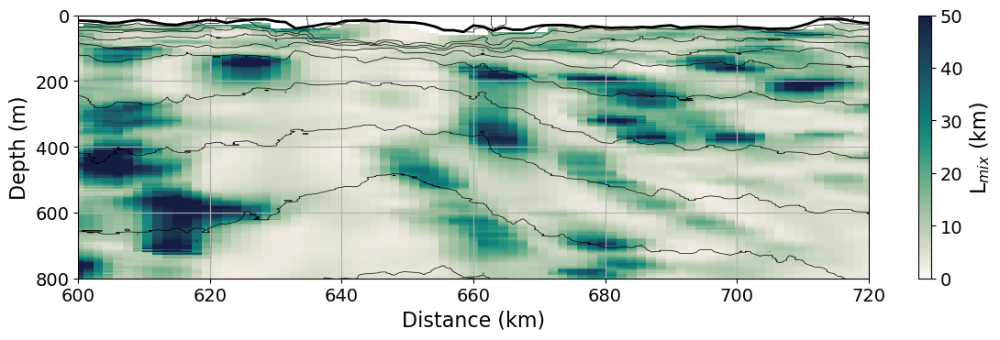

In [620]:
import matplotlib.pyplot as plt
import cmocean as cmo
import numpy as np

# Define a function for the 5-point running mean
def running_mean(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='same')

# Extract and process the data for Mixing Length Scale
mixing_length_data = ds_work["Mixing_Length"].data / 1000  # Convert Mixing Length to km

# Apply 5-point running mean smoothing along the distance dimension
smoothed_mixing_length = np.apply_along_axis(running_mean, axis=1, arr=mixing_length_data)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 4))

# Plot the smoothed Mixing Length Scale
cmesh = ax.pcolormesh(
    ds_work.distance,
    ds_work.ctd_depth,
    smoothed_mixing_length,
    cmap=cmo.cm.tempo,
    vmin=0,
    vmax=50
)

# Add the mixed layer density line
ax.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Add density contours
ax.contour(
    density.distance,
    density.ctd_depth,
    density,
    levels=np.arange(25, 28, 0.2),  # Example levels
    colors='k',
    linewidths=0.5
)

# Customize plot
ax.set_ylim(0, 800)
ax.invert_yaxis()  # Invert depth axis
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Depth (m)')

ax.grid(True)
ax.set_xlim(600, 720)

# Add colorbar
cbar = plt.colorbar(cmesh, ax=ax)
cbar.set_label("L$_{mix}$ (km)")

# Adjust layout and show the plot
plt.tight_layout()

plt.savefig('Mixing_length.png', bbox_inches='tight', dpi=100)
plt.show()


In [71]:
print("density_grid:", density_grid)
print("density_grid shape:", np.shape(density_grid))

density_grid: [24.38778036 24.38978036 24.39178036 ... 27.59178036 27.59378036
 27.59578036]
density_grid shape: (1605,)


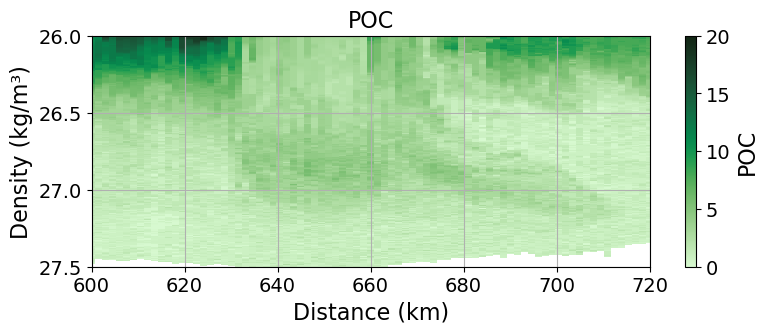

In [210]:
plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den['POC'], cmap=cmo.cm.algae, vmin=0, vmax=20)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('POC')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('POC')
plt.show()

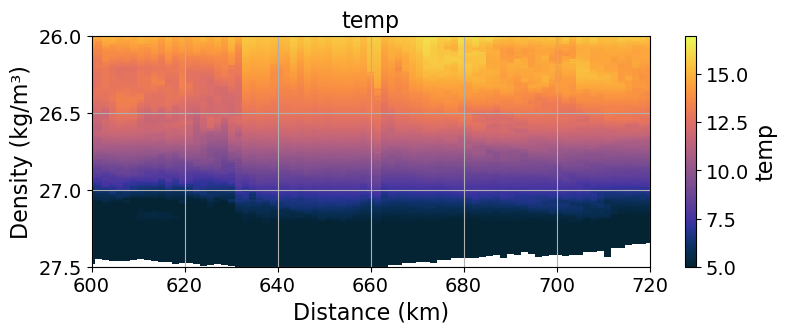

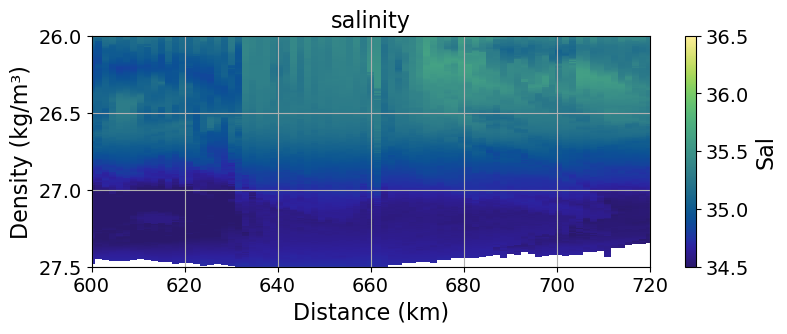

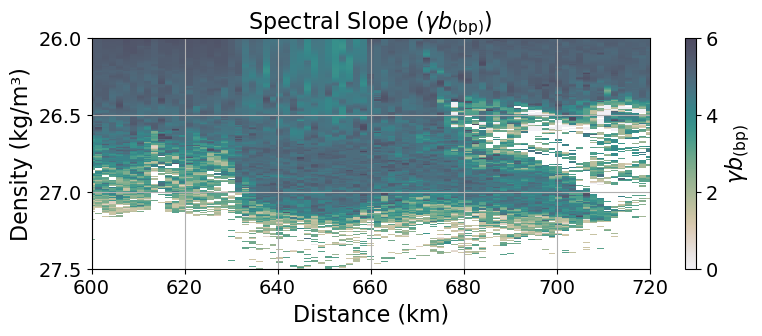

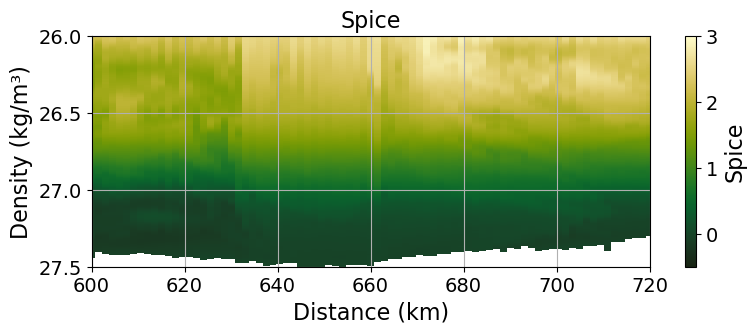

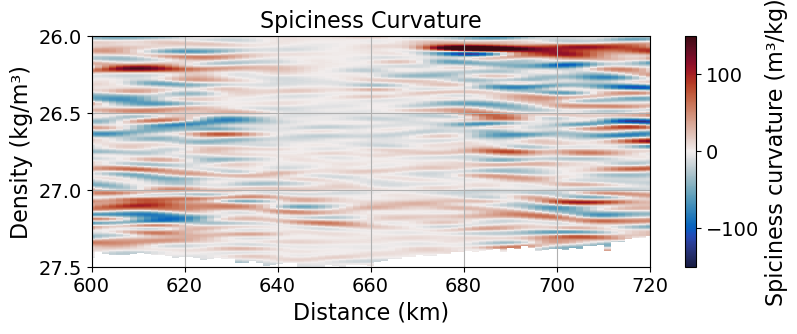

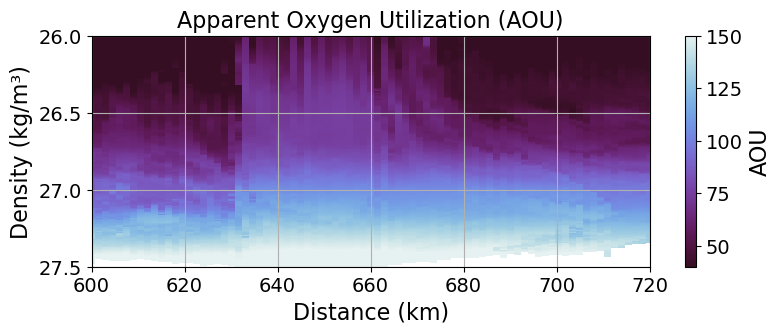

In [327]:
import matplotlib.pyplot as plt
import cmocean as cmo  # Assuming you're using cmocean for colormaps


plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den['temp'], cmap=cmo.cm.thermal, vmin=5, vmax=17)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('temp')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('temp')
plt.show()

plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den['salinity'], cmap=cmo.cm.haline, vmin=34.5, vmax=36.5)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('salinity')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('Sal')
plt.show()

plt.figure(figsize=(9,3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den.spectral_slope, vmin=0, vmax=6, cmap=cmo.cm.rain, alpha=0.8)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('Spectral Slope ($\gamma$$b_{\mathrm{(bp)}}$)')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$')
plt.show()

plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den['spice'], cmap=cmo.cm.speed_r, vmin=-0.5, vmax=3)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('Spice')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('Spice')
plt.show()

plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, second_da_smoothed, cmap=cmo.cm.balance, vmin=-150, vmax=150)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('Spiciness Curvature')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('Spiciness curvature (m³/kg)')
plt.show()





plt.figure(figsize=(9, 3))
plt.pcolormesh(ds_den.distance, ds_den.density, ds_den['AOU'], cmap=cmo.cm.dense_r, vmin=40, vmax=150)
plt.xlabel('Distance (km)')
plt.ylabel('Density (kg/m³)')
plt.title('Apparent Oxygen Utilization (AOU)')
plt.xlim(600, 720)
plt.ylim(26,27.5)
plt.gca().invert_yaxis()
plt.grid(True)
cbar = plt.colorbar()
cbar.set_label('AOU')
plt.show()



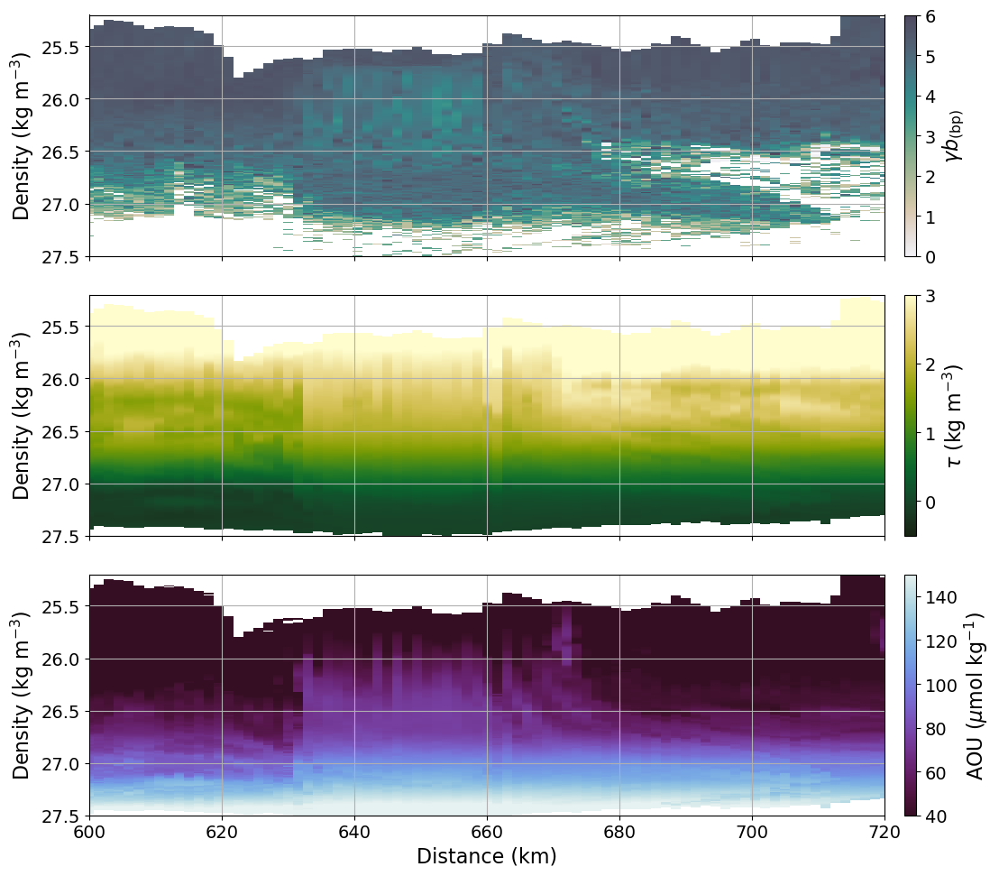

In [326]:
import matplotlib.pyplot as plt
import cmocean as cmo  # Assuming you're using cmocean for colormaps

# Create a figure with 3 rows and 1 column of subplots
fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True, sharey=True)

# Plot Spectral Slope
p1 = axs[0].pcolormesh(
    ds_den.distance, ds_den.density, ds_den.spectral_slope,
    vmin=0, vmax=6, cmap=cmo.cm.rain, alpha=0.8
)
axs[0].set_ylabel('Density (kg m$^{-3}$)')
axs[0].invert_yaxis()
axs[0].grid(True)
cbar1 = fig.colorbar(p1, ax=axs[0], orientation='vertical', pad=0.02)
cbar1.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$')

# Plot Spice
p2 = axs[1].pcolormesh(
    ds_den.distance, ds_den.density, ds_den['spice'],
    cmap=cmo.cm.speed_r, vmin=-0.5, vmax=3
)
axs[1].set_ylabel('Density (kg m$^{-3}$)')
axs[1].invert_yaxis()
axs[1].grid(True)
cbar2 = fig.colorbar(p2, ax=axs[1], orientation='vertical', pad=0.02)
cbar2.set_label(r'$\tau$ (kg m$^{-3}$)')

# Plot AOU
p3 = axs[2].pcolormesh(
    ds_den.distance, ds_den.density, ds_den['AOU'],
    cmap=cmo.cm.dense_r, vmin=40, vmax=150
)
axs[2].set_xlabel('Distance (km)')
axs[2].set_ylabel('Density (kg m$^{-3}$)')
axs[2].grid(True)
cbar3 = fig.colorbar(p3, ax=axs[2], orientation='vertical', pad=0.02)
cbar3.set_label('AOU ($\mu$mol kg$^{-1}$)')

plt.xlim(600, 720)
plt.ylim(25.2,27.5)
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
# Adjust layout for better readability
plt.tight_layout()

plt.plot(mixed_layer_densities)

plt.savefig('density.png', bbox_inches='tight', dpi=100)
plt.show()


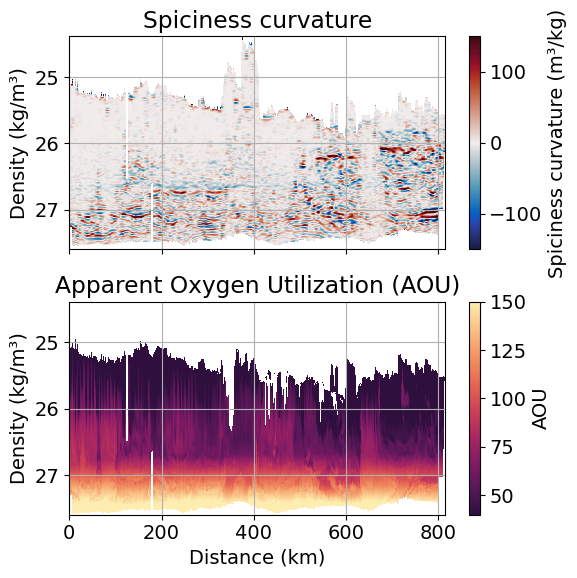

In [53]:
import matplotlib.pyplot as plt
import cmocean  # Assuming you're using cmocean for colormaps

# Create a figure with two subplots, stacked vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6), sharex=True)



# Plot spectral_slope on the first subplot with the same settings as in the depth-space plot
img2 = ax1.pcolormesh(ds_den.distance, ds_den.density, ds_den['spice_curv'], cmap = cmo.balance,vmin= -150, vmax = 150)
ax1.set_ylabel('Density (kg/m³)')
ax1.set_title('Spiciness curvature')
ax1.invert_yaxis()
fig.colorbar(img2, ax=ax1, label='Spiciness curvature (m³/kg)')
ax1.grid(True)




# Plot AOU on the second subplot with the same settings as in the depth-space plot
img3 = ax2.pcolormesh(ds_den.distance, ds_den.density, ds_den['AOU'], cmap=cmocean.cm.matter_r, vmin=40, vmax=150)
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Density (kg/m³)')
ax2.set_title('Apparent Oxygen Utilization (AOU)')
ax2.invert_yaxis()
fig.colorbar(img3, ax=ax2, label='AOU')


# Customize plot spacing
plt.tight_layout()
plt.grid()

# Show the figure
plt.show()


In [196]:
ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral_slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    spice           (density, distance) float64 nan nan nan nan ... nan nan nan
    AOU             (density, distance) float64 nan nan nan nan ... nan nan nan
    spice_curv      (density, distance) float64 0.0 0.0 0.0 0.0 ... nan nan nan
    temp_filt       (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity_filt   (density, distance) float64 nan nan nan nan ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...

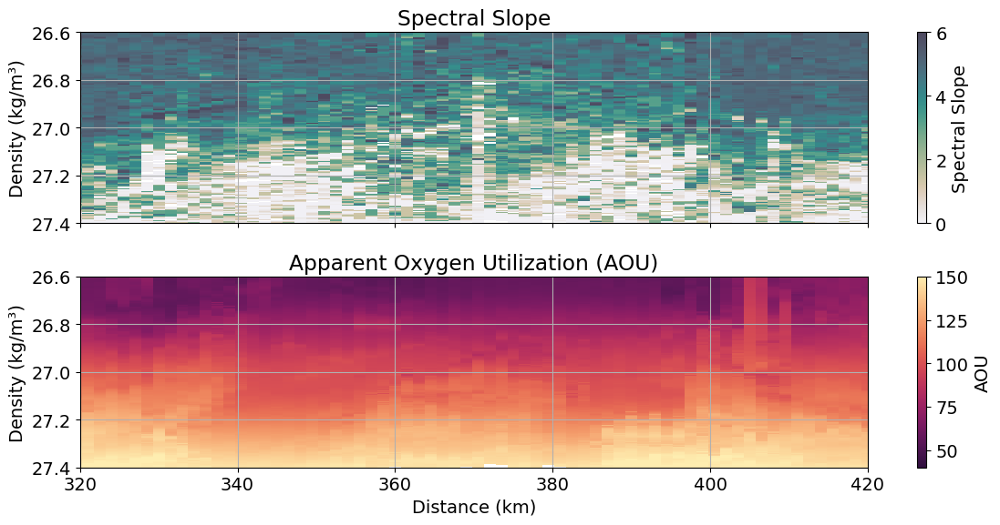

In [241]:
import matplotlib.pyplot as plt
import cmocean  # Assuming you're using cmocean for colormaps

# Create a figure with two subplots, stacked vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6), sharex=True)


# Set the y-limits for both subplots
ax1.set_ylim(26.6, 27.4)
ax2.set_ylim(26.6, 27.4)
# Plot spectral_slope on the first subplot with the same settings as in the depth-space plot
img2 = ax1.pcolormesh(ds_den.distance, ds_den.density, ds_den['spectral_slope'], vmin=0, vmax=6, cmap=cmocean.cm.rain, alpha=0.8)
ax1.set_ylabel('Density (kg/m³)')
ax1.set_title('Spectral Slope')
ax1.invert_yaxis()
fig.colorbar(img2, ax=ax1, label='Spectral Slope')
ax1.grid(True)




# Plot AOU on the second subplot with the same settings as in the depth-space plot
img3 = ax2.pcolormesh(ds_den.distance, ds_den.density, ds_den['AOU'], cmap=cmocean.cm.matter_r, vmin=40, vmax=150)
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Density (kg/m³)')

ax2.set_title('Apparent Oxygen Utilization (AOU)')
ax2.invert_yaxis()
fig.colorbar(img3, ax=ax2, label='AOU')


# Customize plot spacing
plt.tight_layout()
plt.grid()
plt.xlim(320,420)

# Show the figure
plt.show()



# AOU analyzation between 300m to 700m

In [147]:
# Define the depth range with MLD
#depth_min = mixed_layer_densities.ctd_depth
#depth_max = mixed_layer_densities.ctd_depth + 100

depth_min = 300
depth_max = 700


# Select AOU values within the depth range
AOU_subset = AOU.where((AOU.ctd_depth >= depth_min) & (AOU.ctd_depth <= depth_max), drop=True)



# satelite images

### SLA changing over time 

In [233]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from matplotlib.colors import Normalize
import mpl_toolkits.axes_grid1


# Define start and end dates
start_date = pd.to_datetime("2023-03-22").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-23").strftime('%Y-%m-%d')


# vmin and vmax
vmin = -2.0
vmax = 2.0
#cmap = 'balance'

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-42, -32)
lon_range = slice(12, 21)

    
# Initialize a list to store image paths
image_paths = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)

    latitude = ds['latitude']
    longitude = ds['longitude']
    # Extract sea surface height data for the specified region
    ssh_subset = ds['sla'].sel(latitude=lat_range, longitude=lon_range) # (Sea Level Anomaly)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range) # (ADT)
    
    plt.figure(figsize=(10, 8)) # Adjust the figure size to make space for the title
    # Create a map projection
    ax = plt.axes(projection=ccrs.PlateCarree())
    # Plot the data on the map with fixed colorbar range and colormap
    plt.contourf(ssh_subset.longitude, ssh_subset.latitude, ssh_subset.isel(time=0),
                 transform=ccrs.PlateCarree(), cmap=cmo.balance, levels=np.arange(vmin, vmax, 0.1))
    plt.colorbar(label='Sea Level Anomaly (m)')
    
    # Add the thick black contour line
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0),
                levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())
 
    
  
    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Set labels and title
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    

    # Plot quiver plot
    plt.quiver(ds.longitude.sel(longitude=lon_range),
                       ds.latitude.sel(latitude=lat_range), ugos.isel(time=0), vgos.isel(time=0), color='grey', linewidth=2)
    
    # Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(distance=nearest_time_index)
    lon = ds_work['long'].isel(distance=nearest_time_index)

    # Convert current_date to a NumPy datetime object
    current_date = np.datetime64(current_date)
    
    # First day of the year
    first_day_of_year = np.datetime64('2023-01-01')

    # Calculate the difference in days (0-based indexing)
    yearday = (current_date - first_day_of_year).astype('timedelta64[D]').astype(int)
    
    # Convert the current date to a string
    #day = np.datetime_as_string(yearday, unit='D')
    
    day = yearday
        
    # Add the current date as a title above the graph
    #day = np.datetime_as_string(current_date, unit='D')
    plt.title(f'SLA DOY {day}', pad=30)
    

    # Normalize the colormap based on the levels
    norm = Normalize(vmin=levels.min(), vmax=levels.max())

    # Plot scatter points for latitude and longitude
    scatter = ax.scatter(lon, lat, label='location glider')
    

    # Show legend in the top right corner
    plt.legend(loc='upper right', bbox_to_anchor=(0.97, 0.95), borderaxespad=0.)
    
    plt.grid(True) 
    
    
    
    # Save the plot as an image
    day = np.datetime_as_string(current_date, unit='D')
    image_path = f"SLA/sla_{day}.png"
    plt.savefig(image_path)
    plt.close()  # Close the plot to prevent displaying each plot

    image_paths.append(image_path)



# Combine the images into a GIF
images = [Image.open(image_path) for image_path in image_paths]
gif_path = "SLA/sla.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], duration=500, loop=0)

print(f"GIF saved at: {gif_path}")


GIF saved at: SLA/sla.gif


### SLA including trajectory of glider

In [125]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import cartopy.crs as ccrs
import numpy as np
from matplotlib.colors import Normalize
import cmocean.cm as cmo

# Define start and end dates
start_date = pd.to_datetime("2023-05-02").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-16").strftime('%Y-%m-%d')

# vmin and vmax
vmin = -0.8
vmax =0.8

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-39, -34)
lon_range = slice(15, 20)

# Initialize a list to store image paths
image_paths = []

# Initialize lists to store cumulative latitudes and longitudes
cumulative_lat = []
cumulative_lon = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)

    latitude = ds['latitude']
    longitude = ds['longitude']
    # Extract sea surface height data for the specified region
    ssh_subset = ds['sla'].sel(latitude=lat_range, longitude=lon_range) # (Sea Level Anomaly)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range) # (ADT)
    
    plt.figure(figsize=(10, 8)) # Adjust the figure size to make space for the title
    # Create a map projection
    ax = plt.axes(projection=ccrs.PlateCarree())
    # Plot the data on the map with fixed colorbar range and colormap
    plt.contourf(ssh_subset.longitude, ssh_subset.latitude, ssh_subset.isel(time=0),
                 transform=ccrs.PlateCarree(), cmap=cmo.balance, levels=np.arange(vmin, vmax, 0.01))
    plt.colorbar(label='Sea Level Anomaly (m)')
    
    # Add the thick black contour line
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0),
                levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())
 
    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    # Plot quiver plot
    plt.quiver(ds.longitude.sel(longitude=lon_range),
               ds.latitude.sel(latitude=lat_range), ugos.isel(time=0), vgos.isel(time=0), color='grey', linewidth=2)
    
       
    # Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(distance=nearest_time_index)
    lon = ds_work['long'].isel(distance=nearest_time_index)

  
    scatter = ax.scatter(lon, lat, s=100, label='location glider')
    
    
    # Show legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.97, 0.95), borderaxespad=0.)
    
    plt.grid(True) 
        # Add title and labels
    
    

    image_path = f"SST/sst_{current_date.strftime('%Y%m%d')}.png"
    plt.savefig(image_path)
    plt.close()  # Close the plot to prevent displaying each plot

    image_paths.append(image_path)

# Combine the images into a GIF
images = [Image.open(image_path) for image_path in image_paths]
gif_path = "SLA/sla.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], duration=1800, loop=0)

print(f"GIF saved at: {gif_path}")



GIF saved at: SLA/sla.gif


### EKE over time

In [157]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-03-22").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-23").strftime('%Y-%m-%d')

# vmin and vmax
vmin = 0
vmax = 1
cmap = 'viridis'

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-42, -32)
lon_range = slice(12, 21)

# Initialize a list to store image paths
image_paths = []

# Initialize lists to store ugos and vgos data for mean calculation
ugos_list = []
vgos_list = []

# Iterate over the dates to collect data for mean calculation
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')

# Iterate over the dates again for calculating and plotting EKE
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    # Calculate the deviations from the mean
    ugos_anomaly = ugos - ugos_mean
    vgos_anomaly = vgos - vgos_mean
    
    # Calculate EKE
    eke = 0.5 * (ugos_anomaly**2 + vgos_anomaly**2)
    
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range)
    
    plt.figure()  # Adjust the figure size to make space for the title
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    plt.contourf(eke.longitude, eke.latitude, eke.isel(time=0), cmap=cmap, levels=np.linspace(vmin, vmax, 41), extend='both', transform=ccrs.PlateCarree())
    #plt.colorbar(label='EKE (m$^2$/s$^2$)', pad=0.2)

    # Add the thick black contour line
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0), levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())

    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    # Plot quiver plot using the mean ugos and vgos
    plt.quiver(ugos.longitude, ugos.latitude, ugos_mean, vgos_mean, transform=ccrs.PlateCarree(), color= 'grey')
    
    # Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(ATD=nearest_time_index)
    lon = ds_work['long'].isel(ATD=nearest_time_index)

    # Convert current_date to a NumPy datetime object
    current_date = np.datetime64(current_date)
    
    # First day of the year
    first_day_of_year = np.datetime64('2023-01-01')

    # Calculate the difference in days (0-based indexing)
    yearday = (current_date - first_day_of_year).astype('timedelta64[D]').astype(int)
    
    # Convert the current date to a string
    #day = np.datetime_as_string(yearday, unit='D')
    
    day = yearday
        
    plt.title(f'EKE DOY {day}', pad=30)
    
    # Group AOU_subset by the 'ATD' dimension
    AOU_grouped = AOU_subset.groupby('distance')

    # Compute the mean over 'ctd_depth' for each group
    AOU_mean = AOU_grouped.mean(dim='ctd_depth')

    AOU_value = AOU_mean.isel(distance=nearest_time_index)

    # Define the levels
    levels = np.arange(50, 150, 0.1)

    # Normalize the colormap based on the levels
    norm = Normalize(vmin=levels.min(), vmax=levels.max())

    # Plot scatter points for latitude and longitude
    scatter = ax.scatter(lon, lat, s=100, c=AOU_value, cmap=cmo.matter_r, norm=norm, edgecolors='white', linewidths=1, label='location glider')
    

    # Add colorbar at the bottom with specified levels
    #cbar = plt.colorbar(scatter, orientation='horizontal', ticks=np.arange(50, 150, 10))
    #cbar.set_label('AOU Value')  # Label for the colorbar

    # Show legend in the top right corner
    plt.legend(loc='upper right', bbox_to_anchor=(0.97, 0.95), borderaxespad=0.)
    
    # Save the plot as an image
    day = np.datetime_as_string(current_date, unit='D')
    image_path = f"EKE/EKE_{day}.png"
    plt.savefig(image_path)
    plt.close()  # Close the plot to prevent displaying each plot

    image_paths.append(image_path)

# Combine the images into a GIF
images = [Image.open(image_path) for image_path in image_paths]
gif_path = "EKE/EKE.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], duration=500, loop=0)

print(f"GIF saved at: {gif_path}")


GIF saved at: EKE/EKE.gif


### Mean KE

In [12]:
ds_work = ds_glider
ds_sel = ds_work.where((ds_work.lat >= -42) & (ds_work.lat <= -32) & 
                       (ds_glider.distance >= 600) & (ds_glider.distance <= 720) )
ds_sel

<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544, time: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 17.32 17.34 17.35 ... 16.83 16.82 16.8
    lat             (distance) float64 -37.52 -37.53 -37.54 ... -34.18 -34.16
    time            (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05...
Data variables:
    temp            (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    salinity        (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    o2              (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    sol             (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    p               (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    spectral_slope  (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    bp_470_grid_15  (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    bp_700_grid_15  (ctd_depth, distance) float64 nan nan nan ... nan nan nan
    year_day        (time, distance) float64 nan nan nan nan ... nan nan nan nan
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2024-10-05
    comment:        This dataset contains temperature, salinity, oxygen, and ...

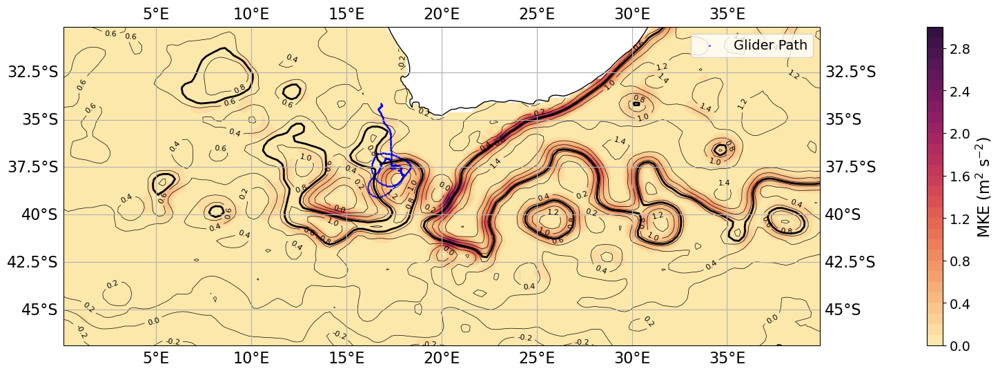

In [272]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-01-01").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-12-31").strftime('%Y-%m-%d')

# vmin and vmax for EKE
vmin = 0
vmax = 3

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-47, -30)
lon_range = slice(0, 40)


# Initialize lists to store datasets
#eke_datasets = []
adt_datasets = []

# Initialize lists to store ugos and vgos data for mean calculation
ugos_list = []
vgos_list = []

# Iterate over the dates to collect data for mean calculation
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = np.abs(ds['ugos'].sel(latitude=lat_range, longitude=lon_range))
    vgos = np.abs(ds['vgos'].sel(latitude=lat_range, longitude=lon_range))
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')


# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Extract ADT data
    adt = ds['adt'].sel(latitude=lat_range, longitude=lon_range)
    adt_datasets.append(adt)
    
# MKE     
meke = 0.5 * (ugos_mean ** 2 + vgos_mean ** 2)
#eke_datasets.append(eke)

# Compute mean EKE and ADT over the period
#eke_mean = xr.concat(eke_datasets, dim='time').mean(dim='time')
adt_mean = xr.concat(adt_datasets, dim='time').mean(dim='time')

# Plot the mean EKE and ADT
plt.figure(figsize=(20, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

# Create a custom colormap that starts from a less dark color
cmap = cmo.matter


# Plot the mean EKE
eke_plot = plt.contourf(meke.longitude, meke.latitude, meke, 
                        cmap=cmap, levels=np.linspace(vmin, vmax, 31), transform=ccrs.PlateCarree())

# Add colorbar
plt.colorbar(eke_plot, label='MKE (m$^2$ s$^{-2}$)',pad=0.1)

# Plot the mean ADT with contours
adt_levels = np.arange(-0.2, 1.8, 0.2)
adt_contours = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=adt_levels, 
                           colors='black', linestyles='-', linewidths=0.5, transform=ccrs.PlateCarree())
plt.clabel(adt_contours, fmt='%2.1f', colors='black', fontsize=8)

# Highlight the contour at ADT = 0.7 with a thicker line
adt_highlight_contour = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=[0.7], 
                                    colors='black', linestyles='-', linewidths=2, transform=ccrs.PlateCarree())

# Add coastlines and gridlines
ax.coastlines()
ax.gridlines(draw_labels=True)

# Set labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')


# Extract glider path (example data)
# Replace with your actual glider data


# Add glider path
plt.scatter(ds_sel.long, ds_sel.lat, color='blue', label='Glider Path', s=0.5)

# Show legend
plt.legend()

# Show plot
plt.show()


In [111]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np
import cartopy.crs as ccrs
import cmocean.cm as cmo

# Define start and end dates
start_date = pd.to_datetime("2023-05-02").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-16").strftime('%Y-%m-%d')

# File path pattern and output directory
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"
output_dir = "EKE/"
os.makedirs(output_dir, exist_ok=True)

# Define lat/lon range and color range for EKE
lat_range = slice(-38, -35)
lon_range = slice(16, 19)
vmin = 0
vmax = 0.3

# Initialize a list for GIF images
gif_images = []

for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')



# Iterate over each day
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Skip if file doesn't exist
        print(f"File not found for {current_date.strftime('%Y-%m-%d')}. Skipping.")
        continue

    # Load dataset
    ds = xr.open_dataset(file_path)

    # Extract ugos, vgos, and compute EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range)  # ADT
    
        # Calculate eddy components
    eddy_ugos= ugos - ugos_mean
    eddy_vgos = vgos - vgos_mean 

    # Calculate daily EKE
    eke = 0.5 * (eddy_ugos**2 + eddy_vgos**2)


    # Plot the EKE
    plt.figure(figsize=(12, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    plt.contourf(eke.isel(time=0).longitude, eke.isel(time=0).latitude, eke.isel(time=0), 
                 levels=np.linspace(vmin, vmax, 31), cmap=cmo.matter, transform=ccrs.PlateCarree())
    plt.colorbar(label='EKE (m$^2$ s$^{-2}$)', pad=0.1)

    # Add the thick black contour line for ADT
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0),
                levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())

    # Plot quiver plot for geostrophic currents
    plt.quiver(ds.longitude.sel(longitude=lon_range),
               ds.latitude.sel(latitude=lat_range), ugos.isel(time=0), vgos.isel(time=0), color='grey')

# Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(distance=nearest_time_index)
    lon = ds_work['long'].isel(distance=nearest_time_index)
    
    scatter = ax.scatter(lon, lat, s=100, label='location glider')
    

   

    # Show legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.97, 0.95), borderaxespad=0.)

    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Add title and labels
    plt.title(f"EKE on {current_date.strftime('%Y-%m-%d')}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Save the figure
    image_path = os.path.join(output_dir, f"eke_{current_date.strftime('%Y%m%d')}.png")
    plt.savefig(image_path, dpi=150, bbox_inches='tight')
    plt.close()

    # Append the generated image to the list for GIF creation
    gif_images.append(Image.open(image_path))

    # Debugging: Check if images are being added
    print(f"Image for {current_date.strftime('%Y-%m-%d')} saved and added to GIF list.")

# Check if there are images in the gif_images list before trying to save the GIF
if gif_images:
    # Save images as GIF
    gif_path = os.path.join(output_dir, "daily_eke.gif")
    gif_images[0].save(gif_path, save_all=True, append_images=gif_images[1:], duration=1800, loop=0)
    print(f"GIF saved at {gif_path}")
else:
    print("No images found to create GIF.")

    

Image for 2023-05-02 saved and added to GIF list.
Image for 2023-05-03 saved and added to GIF list.
Image for 2023-05-04 saved and added to GIF list.
Image for 2023-05-05 saved and added to GIF list.
Image for 2023-05-06 saved and added to GIF list.
Image for 2023-05-07 saved and added to GIF list.
Image for 2023-05-08 saved and added to GIF list.
Image for 2023-05-09 saved and added to GIF list.
Image for 2023-05-10 saved and added to GIF list.
Image for 2023-05-11 saved and added to GIF list.
Image for 2023-05-12 saved and added to GIF list.
Image for 2023-05-13 saved and added to GIF list.
Image for 2023-05-14 saved and added to GIF list.
Image for 2023-05-15 saved and added to GIF list.
Image for 2023-05-16 saved and added to GIF list.
GIF saved at EKE/daily_eke.gif


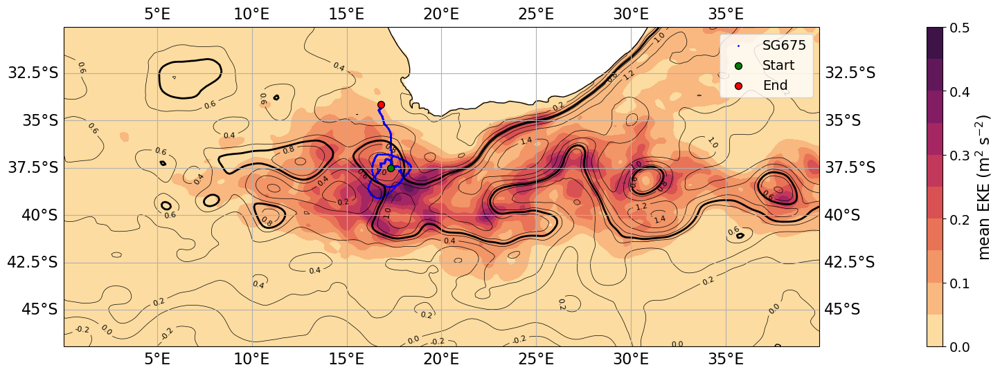

In [283]:
import pandas as pd
import xarray as xr
import numpy as np
import os

# Define start and end dates
start_date = pd.to_datetime("2023-01-01").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-12-31").strftime('%Y-%m-%d')


# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/aviso/dt_global_allsat_phy_l4_{:%Y%m%d}_20241023.nc"

# Select latitude and longitude range
lat_range = slice(-45, -30)
lon_range = slice(5, 32)


# Initialize lists to store datasets
ugos_list = []
vgos_list = []

# Iterate over the dates to collect data for mean calculation
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')

# Calculate MKE
meke = 0.5 * (ugos_mean ** 2 + vgos_mean ** 2)

# Calculate eddy components
eddy_ugos_list = [ugos - ugos_mean for ugos in ugos_list]
eddy_vgos_list = [vgos - vgos_mean for vgos in vgos_list]

# Calculate daily EKE
eke_daily_list = [
    0.5 * (eddy_ugos**2 + eddy_vgos**2)
    for eddy_ugos, eddy_vgos in zip(eddy_ugos_list, eddy_vgos_list)
]

# Concatenate daily EKE and compute mean
eke_all = xr.concat(eke_daily_list, dim='time')
eke_mean = eke_all.mean(dim='time')


# Compute mean EKE and ADT over the period
#eke_mean = xr.concat(eke_datasets, dim='time').mean(dim='time')
adt_mean = xr.concat(adt_datasets, dim='time').mean(dim='time')

# Plot the mean EKE and ADT
plt.figure(figsize=(20, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

# Create a custom colormap that starts from a less dark color
cmap = cmo.matter


# Plot the mean EKE
eke_plot = plt.contourf(eke_mean.longitude, eke_mean.latitude, eke_mean, 
                        cmap=cmap, levels=np.linspace(0, 0.5, 11), transform=ccrs.PlateCarree())

# Add colorbar
plt.colorbar(eke_plot, label='EKE (m$^2$ s$^{-2}$)',pad=0.1)

# Plot the mean ADT with contours
adt_levels = np.arange(-0.2, 1.8, 0.2)
adt_contours = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=adt_levels, 
                           colors='black', linestyles='-', linewidths=0.5, transform=ccrs.PlateCarree())
plt.clabel(adt_contours, fmt='%2.1f', colors='black', fontsize=8)

# Highlight the contour at ADT = 0.7 with a thicker line
adt_highlight_contour = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=[0.7], 
                                    colors='black', linestyles='-', linewidths=2, transform=ccrs.PlateCarree())

# Add coastlines and gridlines
ax.coastlines()
ax.gridlines(draw_labels=True)

# Set labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')


# Extract glider path (example data)
# Replace with your actual glider data

# Extract glider path (example data)
# Replace with your actual glider data
lat = ds_work['lat']
lon = ds_work['long']

# Add the glider path
plt.scatter(lon, lat, color='blue', label='SG675', s=1)

# Highlight the start point
plt.scatter(lon[0], lat[0], color='green', label='Start', s=50, edgecolor='black', zorder=3)

# Highlight the stop point
plt.scatter(lon[-1], lat[-1], color='red', label='End', s=50, edgecolor='black', zorder=3)


# Show legend
plt.legend()

plt.savefig('EKE/mean_EKE.png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()


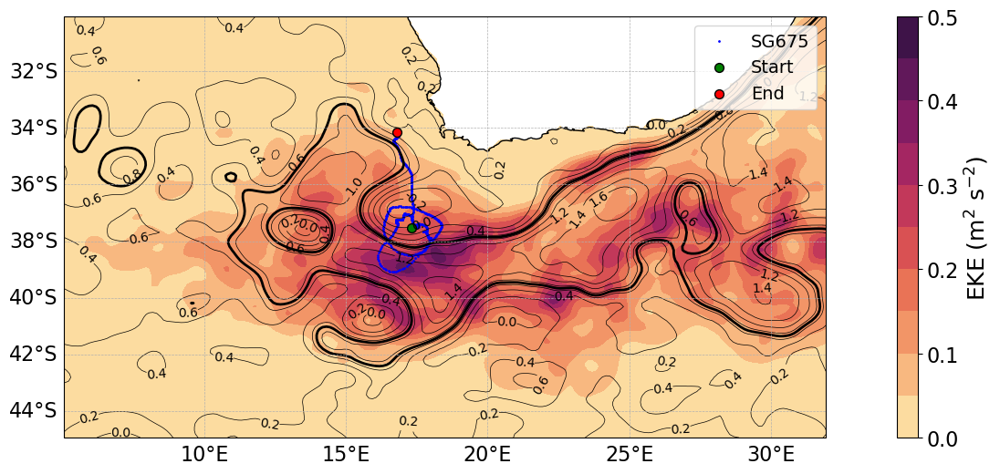

In [19]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cmocean.cm as cmo

# Define start and end dates
start_date = pd.to_datetime("2023-01-01").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-12-31").strftime('%Y-%m-%d')


# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/aviso/dt_global_allsat_phy_l4_{:%Y%m%d}_20241023.nc"

# Select latitude and longitude range
lat_range = slice(-45, -30)
lon_range = slice(5, 32)


# Initialize lists to store datasets
ugos_list = []
vgos_list = []

# Iterate over the dates to collect data for mean calculation
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')

# Calculate MKE
meke = 0.5 * (ugos_mean ** 2 + vgos_mean ** 2)

# Calculate eddy components
eddy_ugos_list = [ugos - ugos_mean for ugos in ugos_list]
eddy_vgos_list = [vgos - vgos_mean for vgos in vgos_list]

# Calculate daily EKE
eke_daily_list = [
    0.5 * (eddy_ugos**2 + eddy_vgos**2)
    for eddy_ugos, eddy_vgos in zip(eddy_ugos_list, eddy_vgos_list)
]

# Concatenate daily EKE and compute mean
eke_all = xr.concat(eke_daily_list, dim='time')
eke_mean = eke_all.mean(dim='time')

adt_datasets = ds['adt'].sel(latitude=lat_range, longitude=lon_range)

# Compute mean EKE and ADT over the period
#eke_mean = xr.concat(eke_datasets, dim='time').mean(dim='time')
adt_mean = xr.concat(adt_datasets, dim='time').mean(dim='time')


plt.figure(figsize=(20, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

# Create a custom colormap
cmap = cmo.matter

# Plot the mean EKE
eke_plot = plt.contourf(
    eke_mean.longitude, eke_mean.latitude, eke_mean, 
    cmap=cmap, levels=np.linspace(0, 0.5, 11), transform=ccrs.PlateCarree()
)

cbar = plt.colorbar(eke_plot, pad=0.05)
cbar.set_label('EKE (m$^2$ s$^{-2}$)', fontsize=18)  # Increase label font size
cbar.ax.tick_params(labelsize=16)  # Increase tick label size
# Plot the mean ADT with contours
adt_levels = np.arange(-0.2, 1.8, 0.2)
adt_contours = plt.contour(
    adt_mean.longitude, adt_mean.latitude, adt_mean, 
    levels=adt_levels, colors='black', linestyles='-', linewidths=0.5, transform=ccrs.PlateCarree()
)
plt.clabel(adt_contours, fmt='%2.1f', colors='black', fontsize=10)  # Increase contour label size

# Highlight the contour at ADT = 0.7 with a thicker line
adt_highlight_contour = plt.contour(
    adt_mean.longitude, adt_mean.latitude, adt_mean, levels=[0.7], 
    colors='black', linestyles='-', linewidths=2, transform=ccrs.PlateCarree()
)

# Add coastlines
ax.coastlines()

# Customize gridlines: Show only left (latitude) and bottom (longitude)
gl = ax.gridlines(draw_labels=True, linestyle="--", linewidth=0.5)
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True
gl.xlabel_style = {'size': 16}  # Increase longitude label size
gl.ylabel_style = {'size': 16}  # Increase latitude label size

# Set larger axis labels
plt.xlabel('Longitude', fontsize=18)
plt.ylabel('Latitude', fontsize=18)

# Customize tick sizes
ax.tick_params(axis='both', which='major', labelsize=16)

# Replace with your actual glider data
lat = ds_glider['lat']
lon = ds_glider['long']

# Plot the glider path
plt.scatter(lon, lat, color='blue', label='SG675', s=1)
plt.scatter(lon[0], lat[0], color='green', label='Start', s=50, edgecolor='black', zorder=3)
plt.scatter(lon[-1], lat[-1], color='red', label='End', s=50, edgecolor='black', zorder=3)

# Show legend
plt.legend(fontsize=14)

# Save and show plot
plt.savefig('EKE/mean_EKE.png', dpi=300, bbox_inches='tight')
plt.show()


# SST from Ostia

In [20]:
# Define the file path pattern
file_path = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path)

#ds_sst

### SST gradient over time

In [115]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-05-02")
end_date = pd.to_datetime("2023-05-16")


# vmin and vmax
vmin = 0
vmax = 0.1
#cmap = 'balance'

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"


# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path_sst)

# Select latitude and longitude range
lat_range = slice(-38, -35)
lon_range = slice(16, 19)

    
# Initialize a list to store image paths
image_paths = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)

    latitude = ds['latitude']
    longitude = ds['longitude']
    # Extract sea surface height data for the specified region
    ssh_subset = ds['sla'].sel(latitude=lat_range, longitude=lon_range) # (Sea Level Anomaly)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range) # (ADT)
    
    plt.figure(figsize=(12, 10)) # Adjust the figure size to make space for the title
    # Create a map projection
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    
    # plot the SST 
    sst_subset = ds_sst['analysed_sst'].sel(latitude=lat_range, longitude=lon_range)
    
    sst_sel = sst_subset.sel(time=current_date, method='nearest')
    
    sst_sel_degree = sst_sel - 272.15
    
    # Compute the partial derivatives
    partial_lon = np.gradient(sst_sel_degree, axis=1)  # Gradient along longitude
    partial_lat = np.gradient(sst_sel_degree, axis=0)  # Gradient along latitude
    
    length_per_degree_lat = 111 # km
    
    length_per_degree_lon = 111 * np.cos(np.deg2rad(sst_sel_degree.latitude.values))
    
    # Convert the gradients to degrees per km
    partial_lon_per_km = partial_lon/0.05 / length_per_degree_lon
    partial_lat_per_km = partial_lat/0.05 / length_per_degree_lat

    # Sum the partial derivatives (now in degrees per km)
    tempgrad = np.absolute(partial_lon_per_km + partial_lat_per_km)
    
        
    ds_grad = xr.Dataset(
        {
            "tempgrad": (("latitude", "longitude"), tempgrad)
        },
        coords={
            "longitude":sst_sel_degree.longitude ,
            "latitude": sst_sel_degree.latitude
        }
    )
    
    
    plt.contourf(ds_grad.longitude, ds_grad.latitude, ds_grad.tempgrad, cmap=cmo.thermal, levels=np.linspace(vmin, vmax, 41), extend='both') 
    
    plt.colorbar(label='Temperature gradient (°C/km)', pad=0.1)
    

 
    
  
    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Set labels and title
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    
   
    # Add the thick black contour line for ADT
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0),
                levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())

    # Plot quiver plot for geostrophic currents
    plt.quiver(ds.longitude.sel(longitude=lon_range),
               ds.latitude.sel(latitude=lat_range), ugos.isel(time=0), vgos.isel(time=0), color='grey')

# Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(distance=nearest_time_index)
    lon = ds_work['long'].isel(distance=nearest_time_index)
    
    scatter = ax.scatter(lon, lat, s=100, label='location glider')
    
    
    plt.grid(True) 
    
    
    

    image_path = f"SSTgrad/sst__grad{current_date.strftime('%Y%m%d')}.png"
    plt.savefig(image_path)
    plt.close()  # Close the plot to prevent displaying each plot

    image_paths.append(image_path)



# Combine the images into a GIF
images = [Image.open(image_path) for image_path in image_paths]
gif_path = "SSTgrad/sst_grad.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], duration=1800, loop=0)

print(f"GIF saved at: {gif_path}")


GIF saved at: SSTgrad/sst_grad.gif


### SST over time

In [126]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-05-02").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-16").strftime('%Y-%m-%d')


# vmin and vmax
vmin = 18
vmax = 23
#cmap = 'balance'

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-38, -35)
lon_range = slice(16, 19)


# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path_sst)



    
# Initialize a list to store image paths
image_paths = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)

    latitude = ds['latitude']
    longitude = ds['longitude']
    # Extract sea surface height data for the specified region
    ssh_subset = ds['sla'].sel(latitude=lat_range, longitude=lon_range) # (Sea Level Anomaly)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range) # (ADT)
    
    plt.figure(figsize=(10, 6)) # Adjust the figure size to make space for the title
    # Create a map projection
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    
    # plot the SST 
    sst_subset = ds_sst['analysed_sst'].sel(latitude=lat_range, longitude=lon_range)
    
    sst_sel = sst_subset.sel(time=current_date, method='nearest')
    
    sst_sel_degree = sst_sel - 272.15
    

    plt.contourf(sst_sel_degree.longitude, sst_sel_degree.latitude, sst_sel_degree, cmap=cmo.thermal, levels=np.linspace(vmin, vmax, 51), extend='both') 
    
    plt.colorbar(label='SST (°C)', pad=0.1)
    
    # Add the thick black contour line
    plt.contour(adt_subset.longitude, adt_subset.latitude, adt_subset.isel(time=0),
                levels=[0.7], colors='black', linewidths=2, transform=ccrs.PlateCarree())
 
    
  
    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Set labels and title
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    
    
   
    # Plot quiver plot
    plt.quiver(ds.longitude.sel(longitude=lon_range),
                       ds.latitude.sel(latitude=lat_range), ugos.isel(time=0), vgos.isel(time=0), color='grey')
    
    
    # Convert the date strings to pandas Timestamps for comparison
    current_date_timestamp = pd.Timestamp(current_date)
    ds_work_lat_times = pd.to_datetime(ds_work['lat'].time)

    # Find the index of the nearest time
    nearest_time_index = np.abs(ds_work_lat_times - current_date_timestamp).argmin()

    # Get the latitude and longitude corresponding to the nearest time
    lat = ds_work['lat'].isel(distance=nearest_time_index)
    lon = ds_work['long'].isel(distance=nearest_time_index)

  
    scatter = ax.scatter(lon, lat, s=100, label='location glider')
    
    
    # Show legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.97, 0.95), borderaxespad=0.)
    
    plt.grid(True) 
        # Add title and labels
    
    

    image_path = f"SST/sst_{current_date.strftime('%Y%m%d')}.png"
    plt.savefig(image_path)
    plt.close()  # Close the plot to prevent displaying each plot

    image_paths.append(image_path)



# Combine the images into a GIF
images = [Image.open(image_path) for image_path in image_paths]
gif_path = "SST/sst.gif"
images[0].save(gif_path, save_all=True, append_images=images[1:], duration=1800, loop=0)

print(f"GIF saved at: {gif_path}")

GIF saved at: SST/sst.gif


In [252]:
SST_mean

<xarray.DataArray 'analysed_sst' (latitude: 0, longitude: 500)>
array([], shape=(0, 500), dtype=float32)
Coordinates:
  * latitude   (latitude) float32 
  * longitude  (longitude) float32 5.025 5.075 5.125 5.175 ... 29.88 29.93 29.98

### mean SST

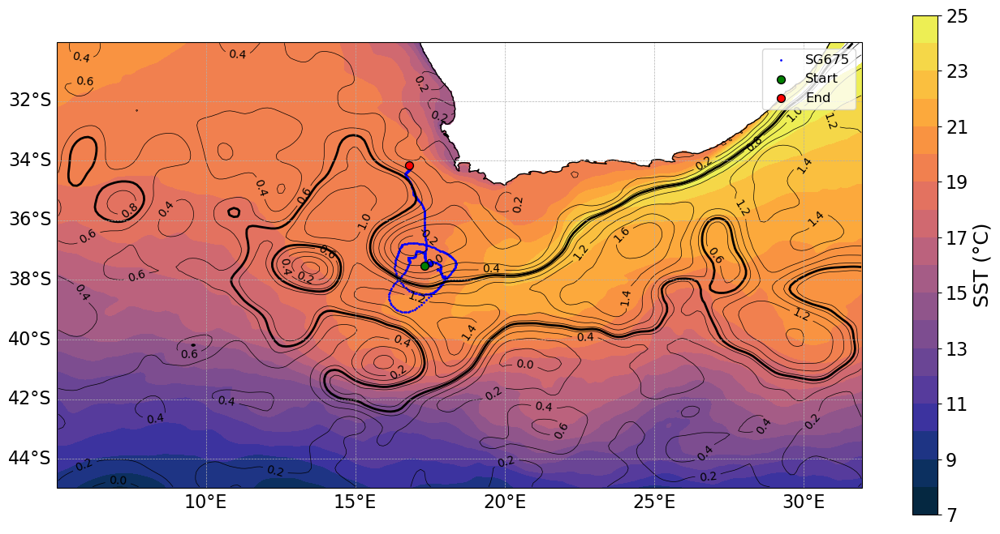

In [36]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-01-01").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-12-31").strftime('%Y-%m-%d')

# vmin and vmax for EKE
vmin = 7
vmax = 25


# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/aviso/dt_global_allsat_phy_l4_{:%Y%m%d}_20241023.nc"
# Select latitude and longitude range
lat_range = slice(-45, -30)
lon_range = slice(5, 32)

# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1737648193767.nc"

ds_sst = xr.open_dataset(file_path_sst)



# Initialize lists to store datasets
SST_datasets = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):


    
    #  Extract SST data 
    sst_subset = ds_sst['analysed_sst'].sel(latitude=lat_range, longitude=lon_range)
    sst_sel = sst_subset.sel(time=current_date, method='nearest')
    sst_sel_degree = sst_sel - 272.15
    SST_datasets.append(sst_sel_degree)
    


# Compute mean EKE and ADT over the period
#eke_mean = xr.concat(eke_datasets, dim='time').mean(dim='time')

SST_mean = xr.concat(SST_datasets, dim='time').mean(dim='time')

# Plot the mean EKE and ADT
plt.figure(figsize=(16, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Create a custom colormap that starts from a less dark color
cmap = cmo.matter
cmap = cmap(np.linspace(0, 1, cmap.N))  # Shift the colormap to start from a lighter color
cmap = plt.cm.colors.ListedColormap(cmap)

# Plot the mean EKE
SST_plot = plt.contourf(SST_mean.longitude, SST_mean.latitude, SST_mean, 
                        cmap=cmo.thermal, levels=np.linspace(vmin, vmax, 19), transform=ccrs.PlateCarree())

# Add colorbar
cbar = plt.colorbar(SST_plot)

cbar.set_label('SST (°C)', fontsize=18)  # Increase label font size
cbar.ax.tick_params(labelsize=16)  # Increase tick label size

adt_levels = np.arange(-0.2, 1.8, 0.2)
adt_contours = plt.contour(
    adt_mean.longitude, adt_mean.latitude, adt_mean, 
    levels=adt_levels, colors='black', linestyles='-', linewidths=0.5, transform=ccrs.PlateCarree()
)
plt.clabel(adt_contours, fmt='%2.1f', colors='black', fontsize=10)  # Increase contour label size
# Highlight the contour at ADT = 0.7 with a thicker line
adt_highlight_contour = plt.contour(
    adt_mean.longitude, adt_mean.latitude, adt_mean, levels=[0.7], 
    colors='black', linestyles='-', linewidths=2, transform=ccrs.PlateCarree()
)
# Add coastlines
ax.coastlines()

# Customize gridlines: Show only left (latitude) and bottom (longitude)
gl = ax.gridlines(draw_labels=True, linestyle="--", linewidth=0.5)
gl.right_labels = False
gl.top_labels = False
gl.left_labels = True
gl.bottom_labels = True
gl.xlabel_style = {'size': 16}  # Increase longitude label size
gl.ylabel_style = {'size': 16}  # Increase latitude label size

# Set larger axis labels

# Set labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Extract glider path (example data)
# Replace with your actual glider data
lat = ds_glider['lat']
lon = ds_glider['long']

# Add the glider path
plt.scatter(lon, lat, color='blue', label='SG675', s=1)

# Highlight the start point
plt.scatter(lon[0], lat[0], color='green', label='Start', s=50, edgecolor='black', zorder=3)

# Highlight the stop point
plt.scatter(lon[-1], lat[-1], color='red', label='End', s=50, edgecolor='black', zorder=3)


# Show legend
plt.legend(markerscale=1, fontsize=12)

plt.savefig('SST/mean_SST.png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()


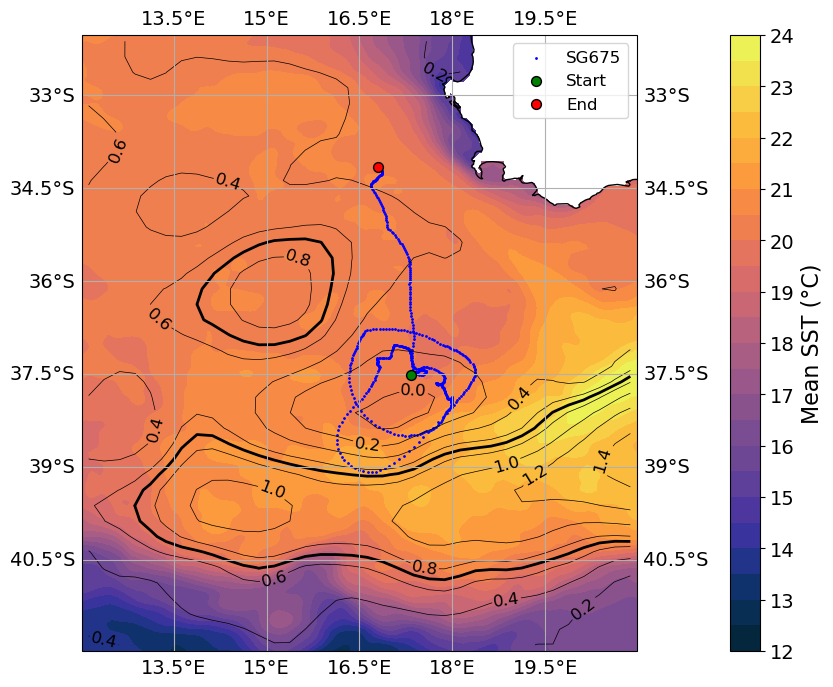

In [54]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-03-22").strftime('%Y-%m-%d')
end_date = pd.to_datetime("2023-05-23").strftime('%Y-%m-%d')

# vmin and vmax for EKE
vmin = 12
vmax = 25

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-42, -32)
lon_range = slice(12, 21)

# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path_sst)



# Initialize lists to store datasets
SST_datasets = []
adt_datasets = []

# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    #eke = 0.5 * (ugos ** 2 + vgos ** 2)
    #eke_datasets.append(eke)
    
    # Extract ADT data
    adt = ds['adt'].sel(latitude=lat_range, longitude=lon_range)
    adt_datasets.append(adt)
    
    #  Extract SST data 
    sst_subset = ds_sst['analysed_sst'].sel(latitude=lat_range, longitude=lon_range)
    
    sst_sel_degree = sst_subset - 272.15
    SST_datasets.append(sst_sel_degree)
    


# Compute mean EKE and ADT over the period
#eke_mean = xr.concat(eke_datasets, dim='time').mean(dim='time')
adt_mean = xr.concat(adt_datasets, dim='time').mean(dim='time')
SST_mean = xr.concat(SST_datasets, dim='time').mean(dim='time')




import matplotlib as mpl

# Increase font sizes globally
mpl.rcParams.update({
    'font.size': 14,            # Base font size
    'axes.labelsize': 16,       # Axis labels
    'axes.titlesize': 16,       # Title font size
    'xtick.labelsize': 14,      # X tick labels
    'ytick.labelsize': 14,      # Y tick labels
    'legend.fontsize': 14,      # Legend font size
    'figure.titlesize': 16      # Overall figure title size
})

# Plot the mean EKE and ADT
plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Create a custom colormap that starts from a less dark color
cmap = cmo.matter
cmap = cmap(np.linspace(0, 1, cmap.N))  # Shift the colormap to start from a lighter color
cmap = plt.cm.colors.ListedColormap(cmap)

# Plot the mean SST
SST_plot = plt.contourf(SST_mean.longitude, SST_mean.latitude, SST_mean, 
                        cmap=cmo.thermal, levels=np.arange(12, 24.5, 0.5) , transform=ccrs.PlateCarree())

# Add colorbar
plt.colorbar(SST_plot, ticks=np.arange(12, 25, 1) , label='Mean SST (°C)', pad=0.1)

# Highlight the contour at ADT = 0.6 with a thicker line
adt_highlight_contour = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=[0.7], 
                                    colors='black', linestyles='-', linewidths=2, transform=ccrs.PlateCarree())

# Plot the mean ADT with contours
adt_levels = np.arange(-0.2, 1.8, 0.2)
adt_contours = plt.contour(adt_mean.longitude, adt_mean.latitude, adt_mean, levels=adt_levels, 
                           colors='black', linestyles='-', linewidths=0.5, transform=ccrs.PlateCarree())
plt.clabel(adt_contours, fmt='%2.1f', colors='black', fontsize=12)  # Increase contour label size



# Add coastlines and gridlines
ax.coastlines()
gridlines = ax.gridlines(draw_labels=True)
gridlines.xlabel_style = {'fontsize': 14}  # Increase x-axis grid label font size
gridlines.ylabel_style = {'fontsize': 14}  # Increase y-axis grid label font size

# Set labels
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)

# Extract glider path (example data)
# Replace with your actual glider data
lat = ds_work['lat']
lon = ds_work['long']

# Add the glider path
plt.scatter(lon, lat, color='blue', label='SG675', s=1)

# Highlight the start point
plt.scatter(lon[0], lat[0], color='green', label='Start', s=50, edgecolor='black', zorder=3)

# Highlight the stop point
plt.scatter(lon[-1], lat[-1], color='red', label='End', s=50, edgecolor='black', zorder=3)

# Show legend
plt.legend(markerscale=1, fontsize=12)
plt.savefig('avg_temp', bbox_inches='tight', dpi=100)

# Show plot
plt.show()


# SST plot against time 

In [77]:
# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path_sst)
SST_global = ds_sst.analysed_sst
#SST_global

In [80]:
# Load the datasets
analysed_sst = SST_global

# Interpolate SST at the locations and times of the temp dataset
sst_at_temp_locs = analysed_sst.interp(
    latitude=ds_glider['lat'],
    longitude=ds_glider['long'],
    time=ds_glider['time'],
    method="linear"
)

# Now sst_at_temp_locs contains the SST values at the same times and locations as the temp dataset
SST_global_glider = sst_at_temp_locs - 272.15

### SST in time

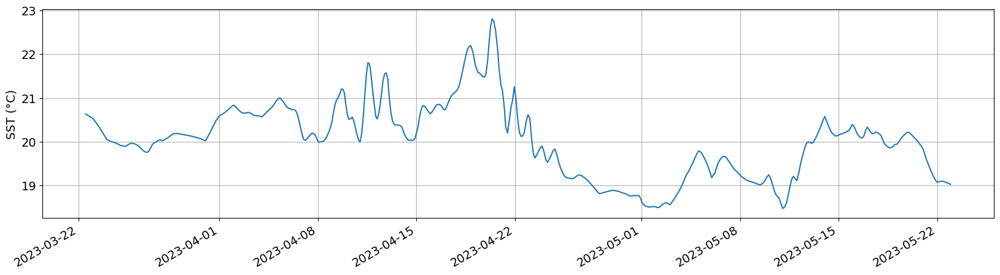

In [18]:
plt.figure(figsize=(20,5))
plt.plot(SST_global_glider.time,SST_global_glider, label='global')

# Set labels

plt.ylabel('SST (°C)')
plt.grid()

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

# EKE in space and time

In [68]:
import os

# Define start and end dates
start_date = pd.to_datetime("2023-03-22")
end_date = pd.to_datetime("2023-05-23")

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Generate a list of file paths for the given date range
file_paths = [file_path_pattern.format(current_date) for current_date in pd.date_range(start=start_date, end=end_date)]

# Filter out the paths that do not exist
existing_file_paths = [file_path for file_path in file_paths if os.path.exists(file_path)]

# Open multiple files as a single dataset
combined_ds = xr.open_mfdataset(existing_file_paths, combine='by_coords')

# Print the combined dataset
#combined_ds

In [69]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-03-22")
end_date = pd.to_datetime("2023-05-23")


# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Select latitude and longitude range
lat_range = slice(-42, -32)
lon_range = slice(12, 21)

# Initialize a list to store image paths
image_paths = []

# Initialize lists to store ugos and vgos data for mean calculation
ugos_list = []
vgos_list = []

# Iterate over the dates to collect data for mean calculation
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Select ugos and vgos for the specified region
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    # Append data to the lists for mean calculation
    ugos_list.append(ugos)
    vgos_list.append(vgos)

# Concatenate all data arrays along the time dimension
ugos_all = xr.concat(ugos_list, dim='time')
vgos_all = xr.concat(vgos_list, dim='time')

# Calculate the mean over time
ugos_mean = ugos_all.mean(dim='time')
vgos_mean = vgos_all.mean(dim='time')


    
    # Select ugos and vgos for the specified region
ugos1 = combined_ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
vgos1 = combined_ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
    
    # Calculate the deviations from the mean
ugos_anomaly = ugos1 - ugos_mean
vgos_anomaly = vgos1 - vgos_mean
    
    # Calculate EKE
eke = 0.5 * (ugos_anomaly**2 + vgos_anomaly**2)
#eke

In [70]:
# Load the datasets

#temp = ds_date.temp

# Ensure the temp dataset has latitude and longitude as coordinates
#temp = temp.assign_coords(lat=temp['lat'], lon=temp['long'])



# Interpolate SST at the locations and times of the temp dataset
eke_global_glider = eke.interp(
    latitude=ds_glider['lat'],
    longitude=ds_glider['long'],
    time=ds_glider['time'],
    method="linear"
)

#eke_global_glider

### EKE in time

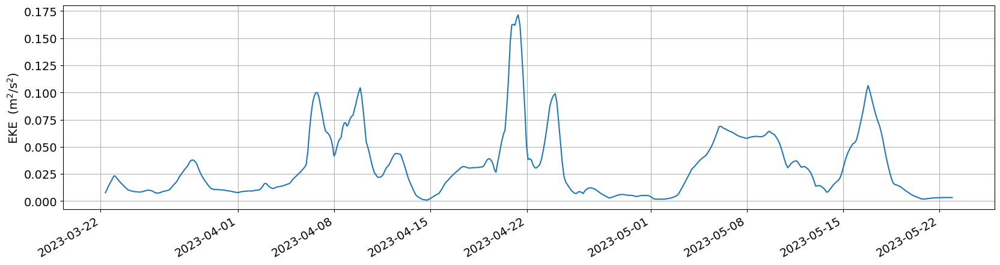

In [165]:
# Create a figure with a specific size
plt.figure(figsize=(20,5))

plt.plot(eke_global_glider.time, eke_global_glider, label='global')

# Set labels

plt.ylabel('EKE  (m$^2$/s$^2$)')
plt.grid()

# Set x-axis ticks to have steps of 200
#plt.xticks(np.arange(0, max(eke_global_glider.ATD)+ 200, 200))

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

### EKE in space

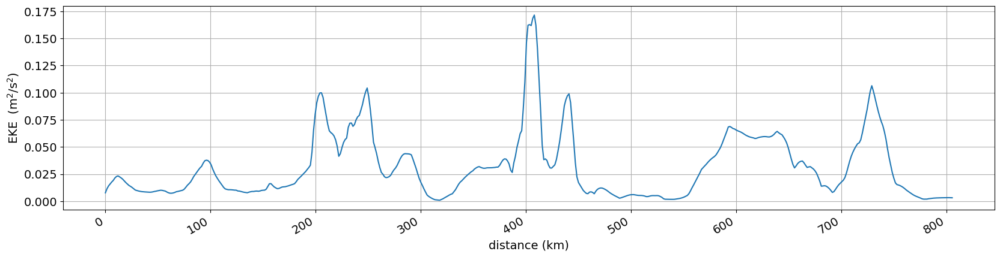

In [166]:
# Create a figure with a specific size
plt.figure(figsize=(20,5))

plt.plot(eke_global_glider.distance, eke_global_glider, label='global')

# Set labels
plt.xlabel('distance (km)')
plt.ylabel('EKE  (m$^2$/s$^2$)')
plt.grid()

# Set x-axis ticks to have steps of 200
#plt.xticks(np.arange(0, max(eke_global_glider.ATD)+ 200, 200))

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

# Temperature gradient in space and time

In [71]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

# Define start and end dates
start_date = pd.to_datetime("2023-03-22")
end_date = pd.to_datetime("2023-05-23")


# vmin and vmax
vmin = -.05
vmax = 0.1
#cmap = 'balance'

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"


# Define the file path pattern
file_path_sst = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/METOFFICE-GLO-SST-L4-NRT-OBS-SST-V2_1716288824368.nc"

ds_sst = xr.open_dataset(file_path_sst)

# Select latitude and longitude range
lat_range = slice(-41, -33)
lon_range = slice(12, 20)

    
# Initialize lists to store gradients and corresponding coordinates
tempgrad_list = []
times = []


# Iterate over the dates
for current_date in pd.date_range(start=start_date, end=end_date):
    file_path = file_path_pattern.format(current_date)
    if not os.path.exists(file_path):  # Check if the file exists
        continue
    
    ds = xr.open_dataset(file_path)
    
    # Calculate EKE
    ugos = ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
    vgos = ds['vgos'].sel(latitude=lat_range, longitude=lon_range)

    latitude = ds['latitude']
    longitude = ds['longitude']
    # Extract sea surface height data for the specified region
    ssh_subset = ds['sla'].sel(latitude=lat_range, longitude=lon_range) # (Sea Level Anomaly)
    adt_subset = ds['adt'].sel(latitude=lat_range, longitude=lon_range) # (ADT)
    
    #plt.figure(figsize=(10, 6)) # Adjust the figure size to make space for the title
    # Create a map projection
    #ax = plt.axes(projection=ccrs.PlateCarree())
    
    
    # plot the SST 
    sst_subset = ds_sst['analysed_sst'].sel(latitude=lat_range, longitude=lon_range)
    
    sst_sel = sst_subset.sel(time=current_date, method='nearest')
    
    sst_sel_degree = sst_sel - 272.15
    
    # Compute the partial derivatives
    partial_lon = np.gradient(sst_sel_degree, axis=1)  # Gradient along longitude
    partial_lat = np.gradient(sst_sel_degree, axis=0)  # Gradient along latitude
    
    length_per_degree_lat = 111 # km
    
    length_per_degree_lon = 11 * np.cos(np.deg2rad(sst_sel_degree.latitude.values))
    
    # Convert the gradients to degrees per km
    partial_lon_per_km = partial_lon/0.05 / length_per_degree_lon
    partial_lat_per_km = partial_lat/0.05 / length_per_degree_lat

    # Sum the partial derivatives (now in degrees per km)
    tempgrad = np.absolute(partial_lon_per_km + partial_lat_per_km)
    
    # Append the results and time to the lists
    tempgrad_list.append(tempgrad)
    times.append(current_date)

# Convert lists to numpy arrays
tempgrad_array = np.array(tempgrad_list)
times_array = np.array(times)


# Create a new xarray Dataset to store the gradients with time, latitude, and longitude dimensions
ds_grad = xr.Dataset(
    {
        "tempgrad": (("time", "latitude", "longitude"), tempgrad_array)
    },
    coords={
        "time": times_array,
        "latitude": sst_subset.latitude,
        "longitude": sst_subset.longitude
    }
)

#ds_grad





In [72]:
# Load the datasets
#tempgrad= ds_grad.tempgrad
#temp = ds_date.temp

# Ensure the temp dataset has latitude and longitude as coordinates
#temp = temp.assign_coords(lat=temp['lat'], lon=temp['long'])

# Interpolate SST at the locations and times of the temp dataset
tempgrad_global_glider = ds_grad.interp(
    latitude=ds_glider['lat'],
    longitude=ds_glider['long'],
    time=ds_glider['time'],
    method="linear"
)

tempgrad_global_glider


<xarray.Dataset>
Dimensions:    (distance: 544)
Coordinates:
    latitude   (distance) float64 -37.52 -37.53 -37.54 ... -34.19 -34.18 -34.16
    longitude  (distance) float64 17.32 17.34 17.35 17.35 ... 16.83 16.82 16.8
    time       (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05-23T1...
  * distance   (distance) float64 0.0 1.5 3.0 4.5 ... 810.0 811.5 813.0 814.5
    long       (distance) float64 17.32 17.34 17.35 17.35 ... 16.83 16.82 16.8
    lat        (distance) float64 -37.52 -37.53 -37.54 ... -34.19 -34.18 -34.16
Data variables:
    tempgrad   (distance) float64 0.02695 0.05245 0.06346 ... nan nan nan

In [121]:
ds_glider.spice_curv

<xarray.DataArray 'spice_curv' (depth: 2001, distance: 544)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * distance  (distance) float64 0.0 1.5 3.0 4.5 6.0 ... 810.0 811.5 813.0 814.5
    long      (distance) float64 17.32 17.34 17.35 17.35 ... 16.83 16.82 16.8
    lat       (distance) float64 -37.52 -37.53 -37.54 ... -34.19 -34.18 -34.16
    time      (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05-23T16...
Dimensions without coordinates: depth

### Temperature gradient against distance

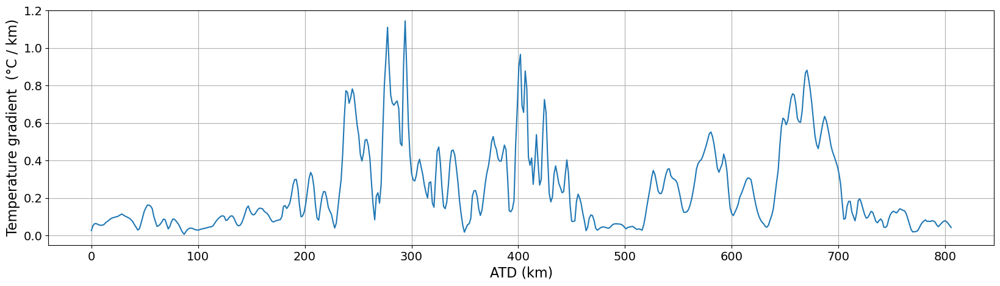

In [74]:
# Create a figure with a specific size
plt.figure(figsize=(20,5))

plt.plot(tempgrad_global_glider.distance,tempgrad_global_glider.tempgrad)
#plt.plot(AOU_integrated.ATD, AOU_integrated)

# Set labels
plt.xlabel('ATD (km)')
plt.ylabel('Temperature gradient  (°C / km)')
plt.grid()

# Set x-axis ticks to have steps of 200
#plt.xticks(np.arange(0, max(tempgrad_global_glider.ATD) + 200, 200))



# AOU below MLD and 300 - 700 m depth

In [82]:
# Define the depth range with MLD
depth_min_mld = mixed_layer_densities.ctd_depth
depth_max_mld = mixed_layer_densities.ctd_depth + 100

depth_min = 300
depth_max = 700

AOU = ds_glider.sol- ds_glider.o2

# Select AOU values within the depth range
AOU_subset = AOU.where((AOU.ctd_depth >= depth_min) & (AOU.ctd_depth <= depth_max), drop=True)
AOU_subset_mld = AOU.where((AOU.ctd_depth >= depth_min_mld) & (AOU.ctd_depth <= depth_max_mld), drop=True)

In [83]:
# Group AOU_subset by the 'ATD' dimension
AOU_grouped_mld = AOU_subset_mld.groupby('distance')

# Compute the mean over 'ctd_depth' for each group
AOU_mean_mld = AOU_grouped_mld.mean(dim='ctd_depth')

#AOU_mean_mld

In [84]:
# Group AOU_subset by the 'ATD' dimension
AOU_grouped = AOU_subset.groupby('distance')

# Compute the mean over 'ctd_depth' for each group
AOU_mean = AOU_grouped.mean(dim='ctd_depth')

#AOU_mean

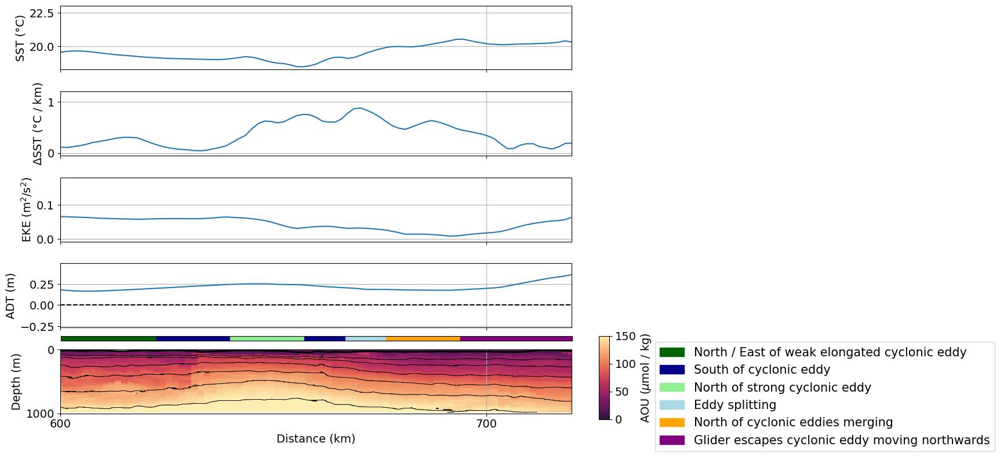

In [201]:
import matplotlib.pyplot as plt
import numpy as np
import cmocean  # Assuming cmocean is used for the colormap
import gsw  # Assuming gsw is used for density calculation

# Data preparation (Assuming the datasets are already defined)
# SST_global_glider, tempgrad_global_glider, eke_global_glider, ds_glider, AOU_mean, AOU_mean_mld, mixed_layer_densities

# Create a figure with four subplots
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=5, figsize=(12, 8), sharex=True)

# Plot the first dataset on the first axis (SST vs ATD)
ax1.plot(SST_global_glider.distance, SST_global_glider, label='Global')
ax1.set_ylabel('SST (°C)')

ax1.grid()


# Set the xlabel on the top


ax1.tick_params(axis='x', which='major', labelsize='10')


# Plot the second dataset on the second axis (Temperature Gradient vs ATD)
ax2.plot(tempgrad_global_glider.distance, tempgrad_global_glider.tempgrad)
ax2.set_ylabel('$\Delta$SST (°C / km)')
ax2.grid()
ax2.set_xticks(np.arange(0, max(tempgrad_global_glider.distance) + 100, 100))

# Plot the third dataset on the third axis (EKE vs ATD)
ax3.plot(eke_global_glider.distance, eke_global_glider, label='Global')
ax3.set_ylabel('EKE (m$^2$/s$^2$)')
ax3.grid()

# Plot the ADT as the top panel (new addition)
ax4.plot(adt_at_temp_locs.distance, adt_at_temp_locs)
ax4.set_ylabel('ADT (m)')
ax4.axhline(0, color='black', linestyle='--')
ax4.grid()

# Plot the fourth dataset on the fourth axis (AOU vs ATD and Depth)
density = gsw.sigma0(ds_glider.salinity, ds_glider.temp)
AOU = ds_glider.sol - ds_glider.o2
img5 = ax5.pcolormesh(ds_glider.distance, ds_glider.ctd_depth, AOU, cmap=cmocean.cm.matter_r, vmin=0, vmax=150)
ax5.invert_yaxis()
ax5.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
ax5.set_ylabel('Depth (m)')
ax5.set_xlabel('Distance (km)')
ax5.grid()

# Generate levels for the contour lines
beginning = 26.4  # Beginning value
ending = 27.8    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)
ax5.contour(ds_glider.distance, ds_glider.ctd_depth, density, levels=levels, colors='k', linewidths=0.5)
ax5.plot(mixed_layer_densities.distance, mixed_layer_densities.ctd_depth, color='k', linewidth=2)

# Add the colorbar separately
fig.subplots_adjust(right=0.85)  # Adjust the right side of the plot to make space for the colorbar
cbar_ax = fig.add_axes([0.87, 0.08, 0.015, 0.18])  # [left, bottom, width, height]
cbar5 = fig.colorbar(img5, cax=cbar_ax)
cbar5.set_label(r'AOU ($\mu$mol / kg)')

# Adjust the layout to make space for the titles and labels
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the colorbar



# Define the time intervals as day-of-year (DOY)
time_intervals = [
    (81, 93),   # 22-03 till 02-04 (DOY for March 22 is 81)
    (93, 102),  # 02-04 till 11-04
    (102, 111), # 11-04 till 20-04
    (111, 116), # 20-04 till 25-04
    (116, 121), # 25-04 till 01-05
    (121, 130), # 01-05 till 10-05
    (130, ds_glider.year_day.max())  # 08-05 till the end
]

# Colors for each time interval
colors = ['darkgreen', 'darkblue', 'lightgreen', 'darkblue', 'lightblue', 'orange', 'purple']

# Create a new axis at the top for the time-based color bar
ax_colorbar = fig.add_axes([0.097, 0.25, 0.735, 0.01])  # [left, bottom, width, height]



# Draw the horizontal color bar based on time intervals using axvspan
for (start_day, end_day), color in zip(time_intervals, colors):
    ax_colorbar.axvspan(start_day, end_day, color=color, alpha=1.0)
    
# Set the limits of the new axis to match the year_day axis (DOY)
ax_colorbar.set_xlim(ds_glider.year_day.min(), ds_glider.year_day.max())

# Remove the xlabel and ylabel from the color bar
ax_colorbar.set_xlabel('')  # Remove the label
ax_colorbar.set_ylabel('')  # Remove the y-axis label

# Remove ticks and labels from the color bar axis
ax_colorbar.tick_params(axis='both', which='both', length=0)  # No tick marks
ax_colorbar.set_xticks([])  # No x ticks
ax_colorbar.set_yticks([])  # No y ticks (if applicable)


# Create the custom legend for the colors and their meanings
legend_patches = [
    mpatches.Patch(color='darkgreen', label='North / East of weak elongated cyclonic eddy'),
    mpatches.Patch(color='darkblue', label='South of cyclonic eddy'),
    mpatches.Patch(color='lightgreen', label='North of strong cyclonic eddy'),
    mpatches.Patch(color='lightblue', label='Eddy splitting'),
    mpatches.Patch(color='orange', label='North of cyclonic eddies merging'),
    mpatches.Patch(color='purple', label='Glider escapes cyclonic eddy moving northwards')
]

# Position the legend on the side
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1.15, 1), fontsize=15)


# Show the plot
plt.show()




In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute the average AOU for the specified density ranges
density_masks = {
    "26.0 ≤ density < 26.5": (ds_den.density >= 26.0) & (ds_den.density < 26.5),
    "26.5 ≤ density < 27.0": (ds_den.density >= 26.5) & (ds_den.density < 27.0),
    "27.0 ≤ density < 27.5": (ds_den.density >= 27.0) & (ds_den.density < 27.5),
}
avg_AOUs = {label: ds_den.AOU.where(mask).mean(dim="density") for label, mask in density_masks.items()}

# Create a figure with four subplots
fig, axs = plt.subplots(4, 1, figsize=(8, 6), sharex=True)

# Top panel: SST vs distance
axs[0].plot(SST_global_glider.distance, SST_global_glider, label="Global", color="blue")
axs[0].set_ylabel("SST (°C)")
axs[0].set_title("SST vs Distance")
axs[0].legend()
axs[0].grid()

# Bottom three panels: Average AOU vs distance for each density range
for ax, (label, avg_AOU) in zip(axs[1:], avg_AOUs.items()):
    ax.plot(ds_den.distance, avg_AOU, label=label, color="orange")
    ax.set_ylabel("AOU (μmol/kg)")
    ax.set_title(f"Average AOU vs Distance for {label}")
    ax.legend()
    ax.grid()

# Shared x-axis label
axs[-1].set_xlabel("Distance (km)")

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()



In [53]:
ds_glider

<xarray.Dataset>
Dimensions:    (ctd_depth: 2001, distance: 539)
Coordinates:
  * ctd_depth  (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 998.5 999.0 999.5 1e+03
  * distance   (distance) float64 0.0 1.5 3.0 4.5 ... 802.5 804.0 805.5 807.0
    long       (distance) float64 nan 17.34 17.35 17.35 ... 16.84 16.83 nan
    lat        (distance) float64 nan -37.53 -37.54 -37.54 ... -34.2 -34.19 nan
    time       (distance) datetime64[ns] 2023-03-22T08:33:43.000416 ... NaT
Data variables:
    temp       (ctd_depth, distance) float64 nan nan nan nan ... nan nan nan nan
    salinity   (ctd_depth, distance) float64 nan nan nan nan ... nan nan nan nan
    o2         (ctd_depth, distance) float64 nan 214.4 214.3 ... nan nan nan
    sol        (ctd_depth, distance) float64 ...
    p          (ctd_depth, distance) float64 ...
    year_day   (distance) float64 80.36 80.5 80.59 80.67 ... 142.3 142.5 0.0
    AOU        (ctd_depth, distance) float64 nan nan nan nan ... nan nan nan nan
Attributes:
    description:  dataset including gridded data in distance and cleaned vari...

# ADT in space and time

In [177]:

import os

# Define start and end dates
start_date = pd.to_datetime("2023-03-22")
end_date = pd.to_datetime("2023-05-23")

# Define the file path pattern
file_path_pattern = "C:/Users/rensk/OneDrive/Documenten/Physical Oceanography Master GU/mast thesis/Data/may/dt_global_twosat_phy_l4_{:%Y%m%d}_vDT2021.nc"

# Generate a list of file paths for the given date range
file_paths = [file_path_pattern.format(current_date) for current_date in pd.date_range(start=start_date, end=end_date)]

# Filter out the paths that do not exist
existing_file_paths = [file_path for file_path in file_paths if os.path.exists(file_path)]

# Open multiple files as a single dataset
combined_ds = xr.open_mfdataset(existing_file_paths, combine='by_coords')

# Print the combined dataset
#combined_ds

In [178]:
# Load the datasets
sla = combined_ds.sla

# Interpolate SST at the locations and times of the temp dataset
sla_at_temp_locs = sla.interp(
    latitude=ds_glider['lat'],
    longitude=ds_glider['long'],
    time=ds_glider['time'],
    method="linear"
)

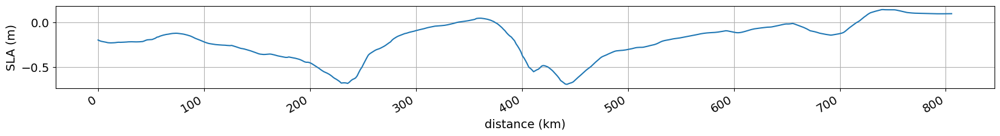

In [179]:
# Create a figure with a specific size
plt.figure(figsize=(20,2))
plt.plot(sla_at_temp_locs.distance,sla_at_temp_locs)

# Set labels
plt.xlabel('distance (km)')
plt.ylabel('SLA (m)')
plt.grid()

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

In [180]:
# Load the datasets
adt = combined_ds.adt

# Interpolate SST at the locations and times of the temp dataset
adt_at_temp_locs = adt.interp(
    latitude=ds_glider['lat'],
    longitude=ds_glider['long'],
    time=ds_glider['time'],
    method="linear"
)

#adt_at_temp_locs


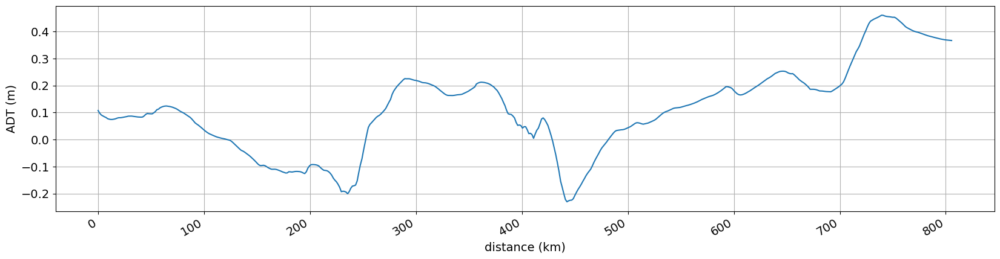

In [181]:
# Create a figure with a specific size
plt.figure(figsize=(20,5))
plt.plot(adt_at_temp_locs.distance,adt_at_temp_locs)

# Set labels
plt.xlabel('distance (km)')
plt.ylabel('ADT (m)')
plt.grid()

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

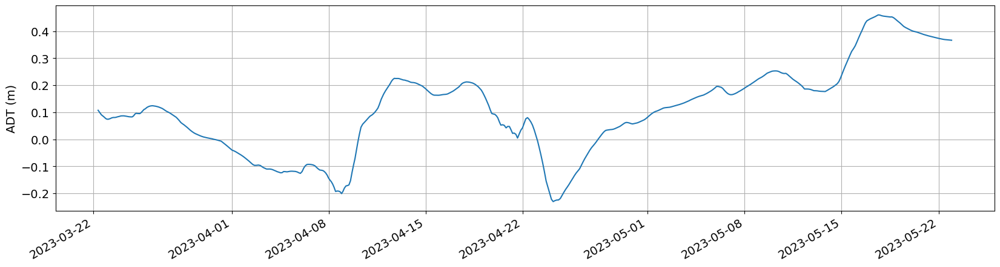

In [182]:
# Create a figure with a specific size
plt.figure(figsize=(20,5))
plt.plot(adt_at_temp_locs.time,adt_at_temp_locs)

# Set labels

plt.ylabel('ADT (m)')
plt.grid()

# Set x-axis ticks to have steps of 200
#plt.xticks(np.arange(0, max(tempgrad_global_glider.ATD) + 200, 200))

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

# EKE along time 



In [183]:
# Select latitude and longitude range
lat_range = slice(-41, -32)
lon_range = slice(12, 21)

# Calculate EKE
ugos = combined_ds['ugos'].sel(latitude=lat_range, longitude=lon_range)
vgos = combined_ds['vgos'].sel(latitude=lat_range, longitude=lon_range)
eke = 0.5 * (ugos ** 2 + vgos ** 2)

temp = ds_date.temp

# Ensure the temp dataset has latitude and longitude as coordinates
temp = temp.assign_coords(lat=temp['lat'], lon=temp['long'])

# Interpolate SST at the locations and times of the temp dataset
eke_at_temp_locs = eke.interp(
    latitude=temp['lat'],
    longitude=temp['long'],
    time=temp['time'],
    method="linear"
)

#eke_at_temp_locs

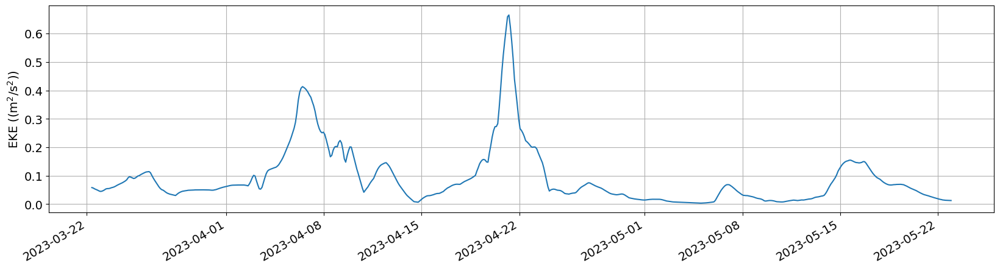

In [184]:
plt.figure(figsize=(20,5))
plt.plot(eke_at_temp_locs.time,eke_at_temp_locs, label='global')

# Set labels

plt.ylabel('EKE ((m$^2$/s$^2$))')
plt.grid()

# Rotate date labels for better readability
plt.gcf().autofmt_xdate()

# Resolution density

In [186]:
density = gsw.sigma0(ds_work.salinity, ds_work.temp)
delta_rho = np.diff(density)
np.shape(delta_rho)
#delta_rho

(2001, 543)

# Grid along density for all variables

In [35]:
ds_work = ds_glider
ds_work

<xarray.Dataset>
Dimensions:         (ctd_depth: 2001, distance: 544, time: 544)
Coordinates:
  * ctd_depth       (ctd_depth) float64 0.0 0.5 1.0 1.5 ... 999.0 999.5 1e+03
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
    long            (distance) float64 17.32 17.34 17.35 ... 16.83 16.82 16.8
    lat             (distance) float64 -37.52 -37.53 -37.54 ... -34.18 -34.16
    time            (distance) datetime64[ns] 2023-03-22T08:33:43 ... 2023-05...
Data variables:
    temp            (ctd_depth, distance) float64 ...
    salinity        (ctd_depth, distance) float64 ...
    o2              (ctd_depth, distance) float64 ...
    sol             (ctd_depth, distance) float64 ...
    p               (ctd_depth, distance) float64 ...
    spectral_slope  (ctd_depth, distance) float64 ...
    bp_470_grid_15  (ctd_depth, distance) float64 ...
    bp_700_grid_15  (ctd_depth, distance) float64 ...
    year_day        (time) float64 81.36 81.5 81.59 81.67 ... 143.5 143.6 143.7
Attributes:
    title:          Gridded Dataset in distance relative to current
    description:    Dataset including gridded data in distance and cleaned va...
    author:         Renske Koets
    institution:    Gothenburg University
    creation_date:  2024-10-05
    comment:        This dataset contains temperature, salinity, oxygen, and ...

In [36]:
density = gsw.sigma0(ds_work.salinity, ds_work.temp)
den_grid_002 = np.arange(np.min(density), np.max(density)+0.002, 0.002)

def grid_to_den(density, var, den_grid):
    
    var_grid = np.ndarray([var.distance.size, den_grid.size])
    
    for v in range(var.distance.size):
        
        density_profile = density.isel(distance=v)
        var_profile = var.isel(distance=v)
    
        ind_sort = np.argsort(density_profile.data)
        den_sort = np.sort(density_profile.data)

        var_grid[v] = griddata(den_sort, var_profile[ind_sort], den_grid)
        
    return var_grid

In [37]:
ox_sol = gsw.O2sol(ds_work.salinity, ds_work.temp, ds_work.p, ds_work.long, ds_work.lat)

In [38]:
temp_den_grid_002 = grid_to_den(density, ds_work.temp, den_grid_002)
sal_den_grid_002 = grid_to_den(density, ds_work.salinity, den_grid_002)
ox_den_grid_002 = grid_to_den(density, ds_work.o2, den_grid_002)
sol_den_grid_002 = grid_to_den(density, ox_sol, den_grid_002)
backscatter_den_grid_002 = grid_to_den(density, ds_work.spectral_slope, den_grid_002)

### Create dataset gridded in density

In [39]:
# Create a Dataset with dimensions ctd_depth and ATD
ds_den = xr.Dataset(
    {'temp': (['density', 'distance'], temp_den_grid_002.T),
     'salinity': (['density', 'distance'], sal_den_grid_002.T),
     'o2': (['density', 'distance'], ox_den_grid_002.T),
     'sol': (['density', 'distance'], sol_den_grid_002.T),
     'spectral slope': (['density', 'distance'], backscatter_den_grid_002.T)},
    coords={'density': den_grid_002,
            'distance': ds_work.distance,}
)

# Add attributes to the dataset
ds_den.attrs['description'] = 'dataset including gridded data in density and distance with cleaned variables'


ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral slope  (density, distance) float64 nan nan nan nan ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...

In [64]:
ds_den.to_netcdf('ds_den.nc')

In [53]:
ds_den = xr.open_dataset('ds_den.nc')
ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 ...
    salinity        (density, distance) float64 ...
    o2              (density, distance) float64 ...
    sol             (density, distance) float64 ...
    spectral_slope  (density, distance) float64 ...
    spice           (density, distance) float64 ...
    AOU             (density, distance) float64 ...
    spice_curv      (density, distance) float64 ...
    temp_filt       (density, distance) float64 ...
    salinity_filt   (density, distance) float64 ...
Attributes:
    description:  dataset including gridded data in density and distance with...

NameError: name 'colorbar_ax0' is not defined

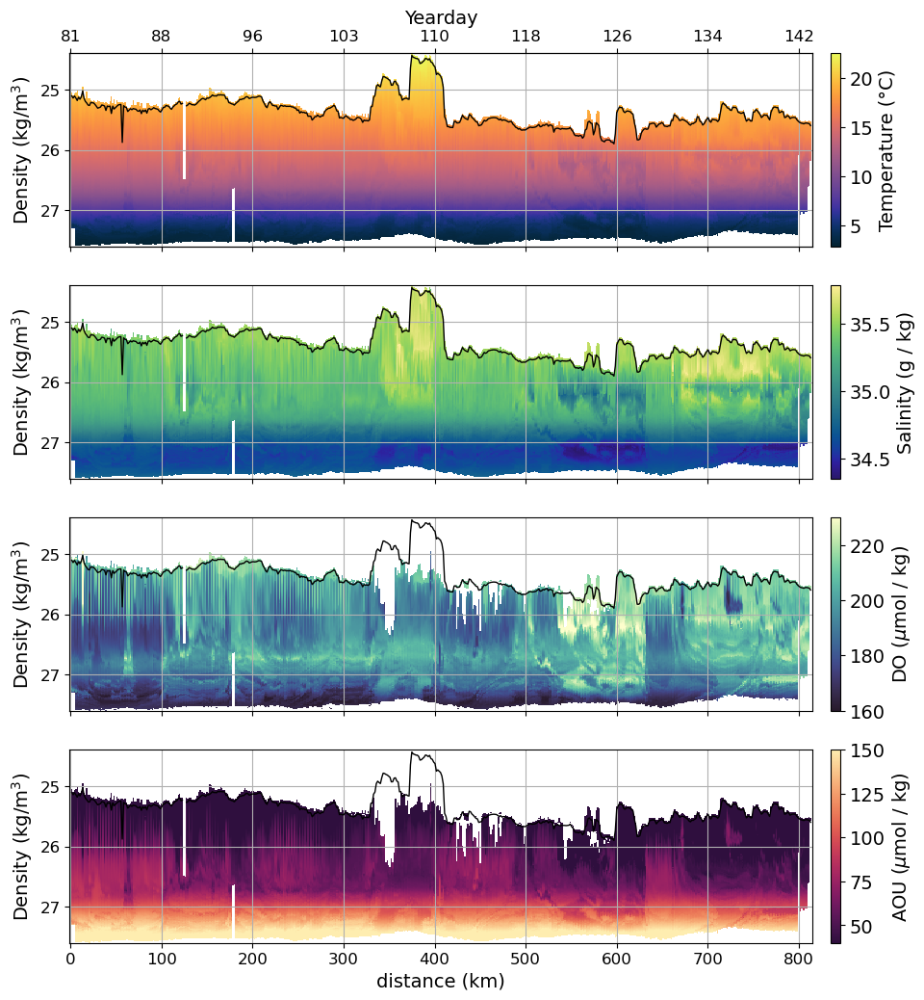

In [26]:
fig, ax = plt.subplots(4, figsize=(12, 12), sharex=True)

vmin = 160
vmax = 230

density = gsw.sigma0(sal_den_grid_002, temp_den_grid_002)
AOU = sol_den_grid_002 - ox_den_grid_002

# Create the bar chart
img0 = ax[0].pcolormesh(ds_work.distance, den_grid_002, temp_den_grid_002.T, cmap = cmo.thermal)
img1 = ax[1].pcolormesh(ds_work.distance, den_grid_002, sal_den_grid_002.T, cmap = cmo.haline)
img2 = ax[2].pcolormesh(ds_work.distance, den_grid_002, ox_den_grid_002.T, cmap = cmo.deep_r, vmin =160, vmax=230)
img3 = ax[3].pcolormesh(ds_work.distance, den_grid_002, AOU.T, cmap = cmo.matter_r, vmin = 40, vmax = 150)

[a.invert_yaxis() for a in ax]
# Add colorbars to the plots
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label('Temperature (°C)')

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label('Salinity (g / kg)')

cbar2 = plt.colorbar(img2, ax=ax[2], pad=0.02)
cbar2.set_label(r'DO ($\mu$mol / kg)')

cbar3 = plt.colorbar(img3, ax=ax[3], pad=0.02)
cbar3.set_label(r'AOU ($\mu$mol / kg)')





#ax[0].set_title('Temperature')
#ax[1].set_title('Salinity')
#ax[2].set_title('DO')
#ax[3].set_title('AOU')

ax[3].set_xlabel('distance (km)')
ax[0].set_ylabel(r'Density (kg/m$^3$)')
ax[1].set_ylabel(r'Density (kg/m$^3$)')
ax[2].set_ylabel(r'Density (kg/m$^3$)')
ax[3].set_ylabel(r'Density (kg/m$^3$)')

ax[0].grid()
ax[1].grid()
ax[2].grid()
ax[3].grid()

# Generate levels for the contour lines
# Specify the beginning, ending, and spacing
beginning = 26.5  # Beginning value
ending = 27.6    # Ending value
spacing = 0.2    # Spacing between contour lines
levels = np.arange(beginning, ending + spacing, spacing)


ax[0].plot(mixed_layer_densities.distance, mixed_layer_densities, color='k', linewidth =1)
ax[1].plot(mixed_layer_densities.distance, mixed_layer_densities, color='k', linewidth =1)
ax[2].plot(mixed_layer_densities.distance, mixed_layer_densities, color='k', linewidth =1)
ax[3].plot(mixed_layer_densities.distance, mixed_layer_densities, color='k', linewidth =1)



# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})  # Set the default font size






# Set the xlabel on the top
ax0 = ax[0].twiny()
ax0.set_xlabel('Yearday')



tick_positions = np.arange(0, max(ds_work.distance), 100)
tick_labels = ds_work.year_day[np.searchsorted(ds_work.distance, tick_positions)].astype(int)  # Convert to integers
ax0.set_xlim(ax[0].get_xlim())
ax0.set_xticks(tick_positions)
ax0.set_xticklabels([f'{t:.0f}' for t in tick_labels])

ax0.tick_params(axis='x', which='major', labelsize='12')

# Set font sizes for specific elements
for a in ax:
    a.set_title(a.get_title(), fontsize=14)  # Increase title font size
    a.set_xlabel(a.get_xlabel(), fontsize=14)  # Increase x-axis label font size
    a.set_ylabel(a.get_ylabel(), fontsize=14)  # Increase y-axis label font size
    a.tick_params(axis='both', which='major', labelsize=12)  # Increase tick label font size

colorbar_ax0.tick_params(axis='both', which='major', labelsize=10)     
colorbar_ax1.tick_params(axis='both', which='major', labelsize=10)  # Increase colorbar tick label font size
colorbar_ax2.tick_params(axis='both', which='major', labelsize=10)  
colorbar_ax3.tick_params(axis='both', which='major', labelsize=10)  

# Increase font size for colorbar labels
colorbar_ax0.set_ylabel(colorbar_ax0.get_ylabel(), fontsize=12) 
colorbar_ax1.set_ylabel(colorbar_ax1.get_ylabel(), fontsize=12)  
colorbar_ax2.set_ylabel(colorbar_ax2.get_ylabel(), fontsize=12)  
colorbar_ax3.set_ylabel(colorbar_ax3.get_ylabel(), fontsize=12)  



# Save the figure
plt.savefig('CombinedATD.png', bbox_inches='tight', dpi=100)

# plots in TS space

In [40]:
ds_den['AOU'] = ds_den.sol - ds_den.o2
ds_den

<xarray.Dataset>
Dimensions:         (density: 1605, distance: 544)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
  * distance        (distance) float64 0.0 1.5 3.0 4.5 ... 811.5 813.0 814.5
Data variables:
    temp            (density, distance) float64 nan nan nan nan ... nan nan nan
    salinity        (density, distance) float64 nan nan nan nan ... nan nan nan
    o2              (density, distance) float64 nan nan nan nan ... nan nan nan
    sol             (density, distance) float64 nan nan nan nan ... nan nan nan
    spectral slope  (density, distance) float64 nan nan nan nan ... nan nan nan
    AOU             (density, distance) float64 nan nan nan nan ... nan nan nan
Attributes:
    description:  dataset including gridded data in density and distance with...

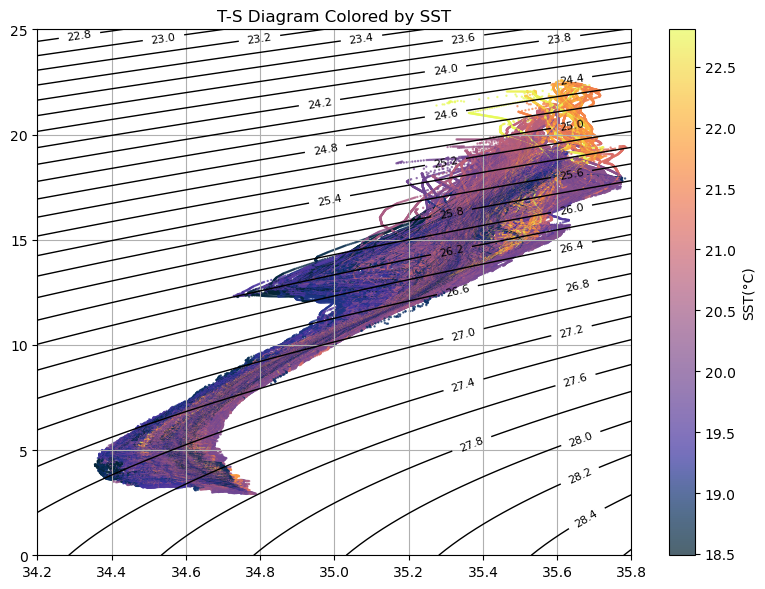

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import seawater as sw

# Extract variables
temp = ds_den.temp.values  # Extract temperature
salinity = ds_den.salinity.values  # Extract salinity
adt= SST_global_glider.values
# Broadcast ADT to match the shape of temp and salinity
adt_broadcasted = np.broadcast_to(adt, temp.shape)

# Mask invalid (nan) values
valid_mask = ~np.isnan(temp) & ~np.isnan(salinity) & ~np.isnan(adt_broadcasted)
temp_valid = temp[valid_mask]
salinity_valid = salinity[valid_mask]
adt_valid = adt_broadcasted[valid_mask]

# Create scatter plot
plt.figure(figsize=(8, 6))
sc = plt.scatter(salinity_valid, temp_valid, c=adt_valid, cmap=cmo.thermal, s=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(sc)
cbar.set_label('SST(°C)')

# Generate density contour levels
levels = np.arange(22, 30, 0.2)

# Create a grid of salinity and temperature
salinity_range = np.linspace(34.2, 35.8, 100)
temperature_range = np.linspace(0, 25, 100)
S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

# Calculate density on the grid
density_grid = gsw.sigma0(S_grid, T_grid)

contour= plt.contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=1)
plt.clabel(contour, inline=True, fontsize=8, fmt='%1.1f')

# Labels and title
ax.set_xlabel("Salinity (g/kg)")
ax.set_ylabel("CT(°C)")
plt.title('T-S Diagram Colored by SST')
plt.grid()
plt.tight_layout()

# Show or save the plot
plt.show()


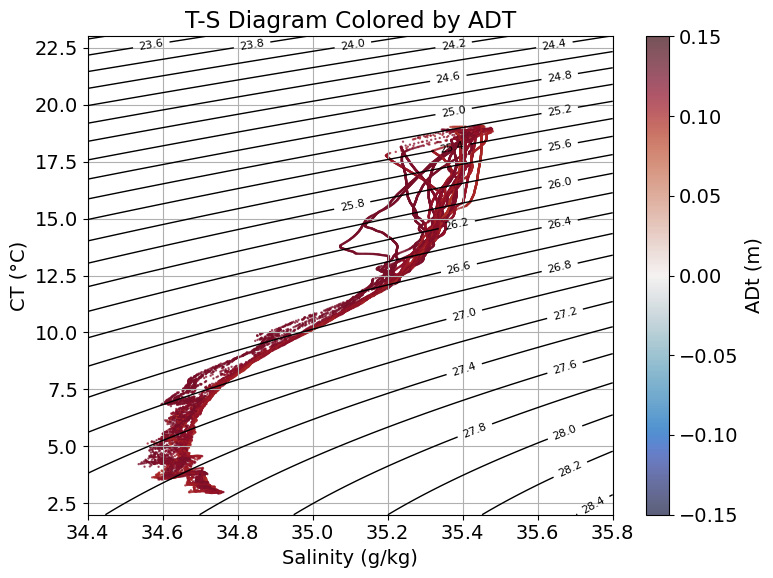

In [293]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cmocean.cm as cmo
import gsw  # Gibbs Seawater Toolbox

# Extract variables and filter by distance
distance_mask = (ds_den.distance >= 50) & (ds_den.distance <= 80)
temp = ds_den.temp.where(distance_mask, drop=True).values  # Filter temperature
salinity = ds_den.salinity.where(distance_mask, drop=True).values  # Filter salinity
adt = adt_at_temp_locs.where(distance_mask, drop=True).values  # Filter SST

# Broadcast ADT to match the shape of temp and salinity
adt_broadcasted = np.broadcast_to(adt, temp.shape)

# Mask invalid (nan) values
valid_mask = ~np.isnan(temp) & ~np.isnan(salinity) & ~np.isnan(adt_broadcasted)
temp_valid = temp[valid_mask]
salinity_valid = salinity[valid_mask]
adt_valid = adt_broadcasted[valid_mask]

# Create scatter plot
plt.figure(figsize=(8, 6))
sc = plt.scatter(salinity_valid, temp_valid, c=adt_valid, cmap=cmo.balance,vmin = 0.15, vmax=0.15, s=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(sc)
cbar.set_label('ADt (m)')

# Generate density contour levels
levels = np.arange(22, 30, 0.2)

# Create a grid of salinity and temperature
salinity_range = np.linspace(34.4, 35.8, 100)
temperature_range = np.linspace(2, 23, 100)
S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

# Calculate density on the grid
density_grid = gsw.sigma0(S_grid, T_grid)

contour = plt.contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=1)
plt.clabel(contour, inline=True, fontsize=8, fmt='%1.1f')

# Labels and title
plt.xlabel("Salinity (g/kg)")
plt.ylabel("CT (°C)")
plt.title('T-S Diagram Colored by ADT')
plt.grid()
plt.tight_layout()

# Show or save the plot
plt.show()


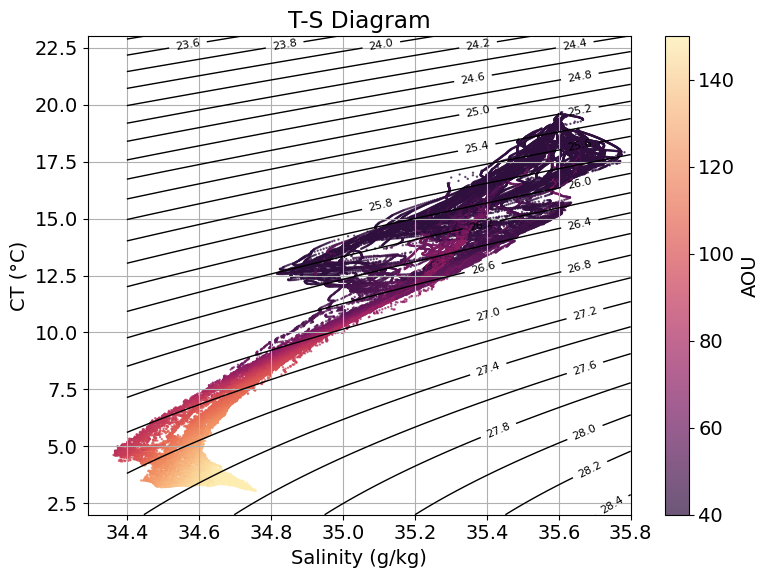

In [89]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cmocean.cm as cmo
import gsw  # Gibbs Seawater Toolbox

# Extract variables and filter by distance
distance_mask = (ds_den.distance >= 600) & (ds_den.distance <= 720)
temp = ds_den.temp.where(distance_mask, drop=True).values  # Filter temperature
salinity = ds_den.salinity.where(distance_mask, drop=True).values  # Filter salinity
AOU = ds_den.AOU.where(distance_mask, drop=True).values  # Filter SST


# Create scatter plot
plt.figure(figsize=(8, 6))
sc = plt.scatter(salinity, temp, c=AOU, cmap="cmo.matter_r", vmin=40, vmax=150, s=0.5, alpha=0.7)

# Add colorbar
cbar = plt.colorbar(sc)
cbar.set_label('AOU')

# Generate density contour levels
levels = np.arange(22, 30, 0.2)

# Create a grid of salinity and temperature
salinity_range = np.linspace(34.4, 35.8, 100)
temperature_range = np.linspace(2, 23, 100)
S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

# Calculate density on the grid
density_grid = gsw.sigma0(S_grid, T_grid)

contour = plt.contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=1)
plt.clabel(contour, inline=True, fontsize=8, fmt='%1.1f')

# Labels and title
plt.xlabel("Salinity (g/kg)")
plt.ylabel("CT (°C)")
plt.title('T-S Diagram')
plt.grid()
plt.tight_layout()

# Show or save the plot
plt.show()


In [61]:
ds_sel= ds_den.sel(distance=615)
ds_sel

<xarray.Dataset>
Dimensions:         (density: 1605)
Coordinates:
  * density         (density) float64 24.39 24.39 24.39 ... 27.59 27.59 27.6
    distance        float64 615.0
Data variables:
    temp            (density) float64 ...
    salinity        (density) float64 ...
    o2              (density) float64 ...
    sol             (density) float64 ...
    spectral_slope  (density) float64 ...
    spice           (density) float64 ...
    AOU             (density) float64 ...
    spice_curv      (density) float64 ...
    temp_filt       (density) float64 ...
    salinity_filt   (density) float64 ...
Attributes:
    description:  dataset including gridded data in density and distance with...

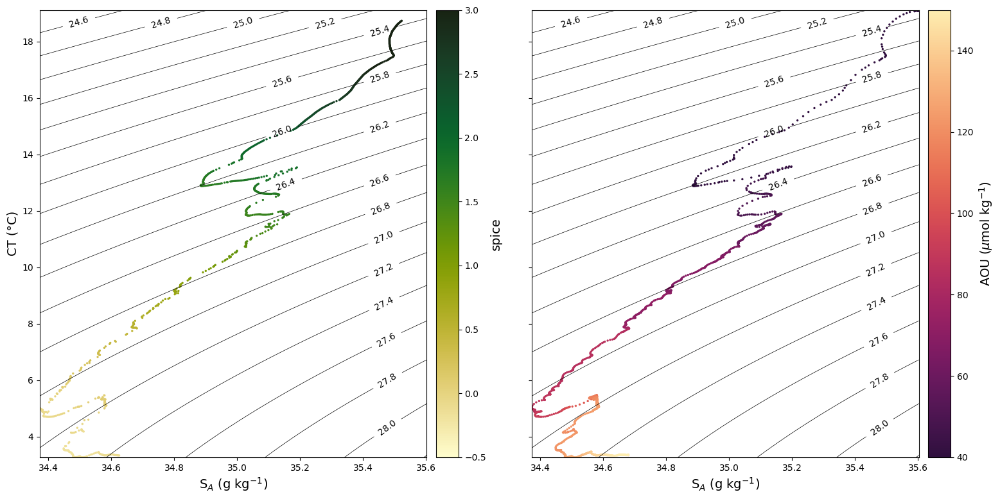

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo


fig, ax = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)

vmin = 160
vmax = 230

ds_work  = ds_glider

ds_work = ds_work.sel(distance =615)

# Calculate density and AOU
density = gsw.sigma0(ds_work.salinity, ds_work.temp)
AOU = ds_work.sol - ds_work.o2

# Create the scatter plots with smaller dots (e.g., s=10)
img0 = ax[0].scatter(ds_sel.salinity, ds_sel.temp, c=ds_sel.spice, cmap=cmo.speed, vmin=-0.5, vmax=3, s=2)
img1 = ax[1].scatter(ds_work.salinity, ds_work.temp, c=AOU, cmap=cmo.matter_r, vmin=40, vmax = 150,  s=2)

# Add colorbars to the plots
cbar0 = plt.colorbar(img0, ax=ax[0], pad=0.02)
cbar0.set_label(r'spice')

cbar1 = plt.colorbar(img1, ax=ax[1], pad=0.02)
cbar1.set_label(r'AOU ($\mu$mol kg$^{-1}$)')

# Set axis labels
ax[0].set_xlabel('S$_A$ (g kg$^{-1}$)')
ax[0].set_ylabel('CT (°C)')
ax[1].set_xlabel('S$_A$ (g kg$^{-1}$)')

# Generate density contour levels
levels = np.arange(22, 30, 0.2)

# Create a grid of salinity and temperature
salinity_range = np.linspace(ds_work.salinity.min(), ds_work.salinity.max(), 100)
temperature_range = np.linspace(ds_work.temp.min(), ds_work.temp.max(), 100)
S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

# Calculate density on the grid
density_grid = gsw.sigma0(S_grid, T_grid)

# Add contour lines
contours0 = ax[0].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
contours1 = ax[1].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)

# Add labels to contour lines
ax[0].clabel(contours0, inline=True, fontsize=10, fmt='%1.1f')
ax[1].clabel(contours1, inline=True, fontsize=10, fmt='%1.1f')

# Increase font sizes for all text and numbers
plt.rcParams.update({'font.size': 14})

#plt.grid()

# Set font sizes for specific elements
for a in ax:
    a.set_title(a.get_title(), fontsize=14)
    a.set_xlabel(a.get_xlabel(), fontsize=14)
    a.set_ylabel(a.get_ylabel(), fontsize=14)
    a.tick_params(axis='both', which='major', labelsize=10)
    a.invert_yaxis()

# Ensure colorbar tick labels are also adjusted
cbar0.ax.tick_params(axis='both', which='major', labelsize=10)
cbar1.ax.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()


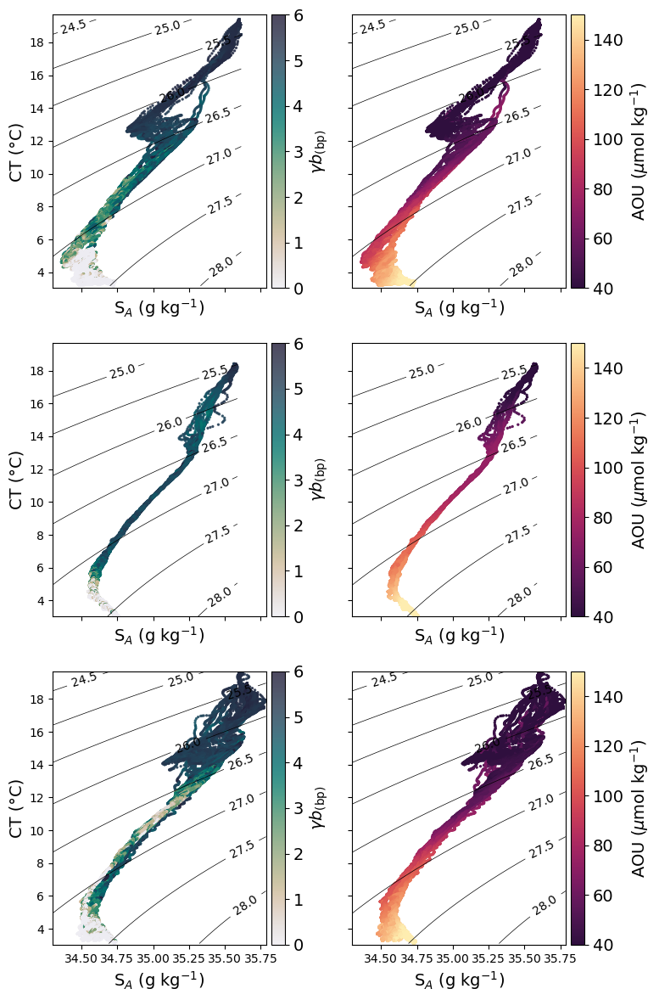

In [352]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(600,635), (635, 660), (660,720)]

fig, axs = plt.subplots(len(distance_ranges), 2, figsize=(8, 4 * len(distance_ranges)), sharex=True, sharey=True)

vmin = 0
vmax = 6

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    ds_filtered = ds_work.where((ds_work.distance >= d_min) & (ds_work.distance <= d_max), drop=True)

    # Extract variables
    salinity = ds_filtered.salinity
    temperature = ds_filtered.temp
    oxygen = ds_filtered.o2
    AOU = ds_filtered.sol - oxygen
    oxygen = ds_filtered.spectral_slope
    
    # Calculate density
    density = gsw.sigma0(salinity, temperature)

    # Create scatter plots for each subplot pair
    img0 = axs[i, 0].scatter(salinity, temperature, c=oxygen, cmap=cmo.rain, alpha= 0.8, vmin=vmin, vmax=vmax, s=2)
    img1 = axs[i, 1].scatter(salinity, temperature, c=AOU, cmap=cmo.matter_r, vmin=40, vmax=150, s=2)

    # Add colorbars
    cbar0 = plt.colorbar(img0, ax=axs[i, 0], pad=0.02)
    cbar0.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$')
    
    cbar1 = plt.colorbar(img1, ax=axs[i, 1], pad=0.02)
    cbar1.set_label(r'AOU ($\mu$mol kg$^{-1}$)')

    # Set axis labels and titles
    axs[i, 0].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i, 0].set_ylabel('CT (°C)')
    axs[i, 1].set_xlabel('S$_A$ (g kg$^{-1}$)')


    # Generate density contour levels
    levels = np.arange(22, 30, 0.5)

    # Create grid for salinity and temperature
    salinity_range = np.linspace(34.3, salinity.max(), 100)
    temperature_range = np.linspace(temperature.min(), temperature.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

    # Calculate density on the grid
    density_grid = gsw.sigma0(S_grid, T_grid)

    # Add contour lines
    contours0 = axs[i, 0].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    contours1 = axs[i, 1].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)

    # Add labels to contour lines
    axs[i, 0].clabel(contours0, inline=True, fontsize=10, fmt='%1.1f')
    axs[i, 1].clabel(contours1, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    for a in axs[i, :]:
        a.invert_yaxis()
        a.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()


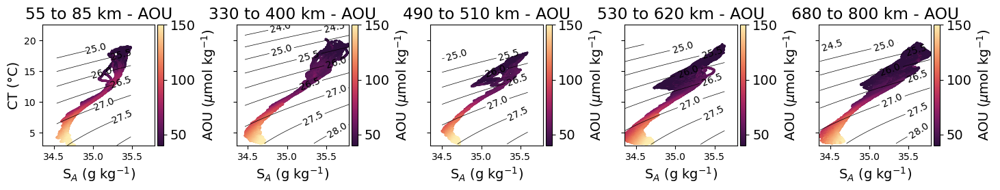

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(55, 85), (330, 400), (490, 510), (530, 620), (680, 800)]

# Create a row of subplots
fig, axs = plt.subplots(1, len(distance_ranges), figsize=(3 * len(distance_ranges), 3), sharex=True, sharey=True)

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    ds_filtered = ds_den.where((ds_den.distance >= d_min) & (ds_den.distance <= d_max), drop=True)

    # Calculate AOU
    AOU = ds_filtered.sol - ds_filtered.o2

    # Scatter plot of AOU
    img = axs[i].scatter(ds_filtered.salinity, ds_filtered.temp, c=AOU, cmap=cmo.matter_r, vmin=40, vmax=150, s=2)

    # Add colorbar for each subplot
    cbar = plt.colorbar(img, ax=axs[i], pad=0.02)
    cbar.set_label(r'AOU ($\mu$mol kg$^{-1}$)')

    # Set axis labels and title
    axs[i].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i].set_title(f"{d_min} to {d_max} km - AOU")

    # Generate and add density contour levels
    levels = np.arange(22, 30, 0.5)
    salinity_range = np.linspace(ds_filtered.salinity.min(), ds_filtered.salinity.max(), 100)
    temperature_range = np.linspace(ds_filtered.temp.min(), ds_filtered.temp.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)
    density_grid = gsw.sigma0(S_grid, T_grid)
    contours = axs[i].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    axs[i].clabel(contours, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    #axs[i].invert_yaxis()
    axs[i].tick_params(axis='both', which='major', labelsize=10)

axs[0].set_ylabel('CT (°C)')
plt.tight_layout()
plt.show()


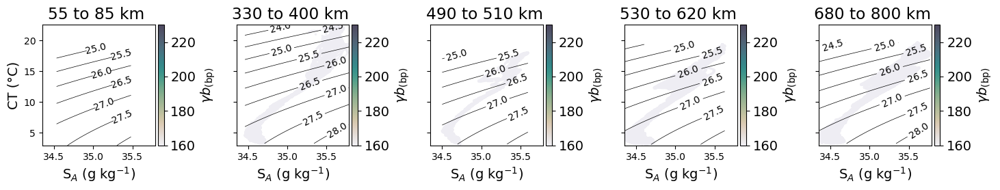

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(55, 85), (330, 400), (490, 510), (530, 620), (680, 800)]

# Create a row of subplots
fig, axs = plt.subplots(1, len(distance_ranges), figsize=(3 * len(distance_ranges), 3), sharex=True, sharey=True)

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    ds_filtered = ds_work.where((ds_work.distance >= d_min) & (ds_work.distance <= d_max), drop=True)

    # Calculate AOU
    AOU = ds_filtered.spectral_slope

    # Scatter plot of AOU
    img = axs[i].scatter(ds_filtered.salinity, ds_filtered.temp, c=AOU, cmap=cmo.rain, alpha= 0.8, vmin=vmin, vmax=vmax, s=2)

    # Add colorbar for each subplot
    cbar = plt.colorbar(img, ax=axs[i], pad=0.02)
    cbar.set_label(r'$\gamma$$b_{\mathrm{(bp)}}$')

    # Set axis labels and title
    axs[i].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i].set_title(f"{d_min} to {d_max} km ")

    # Generate and add density contour levels
    levels = np.arange(22, 30, 0.5)
    salinity_range = np.linspace(ds_filtered.salinity.min(), ds_filtered.salinity.max(), 100)
    temperature_range = np.linspace(ds_filtered.temp.min(), ds_filtered.temp.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)
    density_grid = gsw.sigma0(S_grid, T_grid)
    contours = axs[i].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    axs[i].clabel(contours, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    #axs[i].invert_yaxis()
    axs[i].tick_params(axis='both', which='major', labelsize=10)

axs[0].set_ylabel('CT (°C)')
plt.tight_layout()
plt.show()


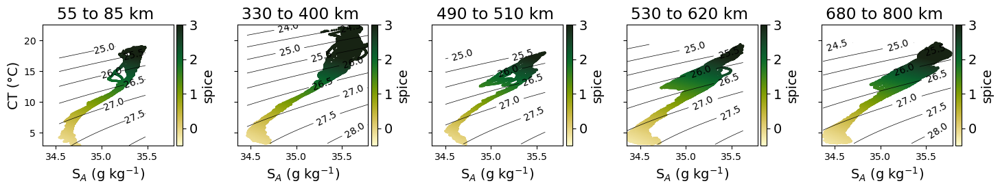

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(55, 85), (330, 400), (490, 510), (530, 620), (680, 800)]

# Create a row of subplots
fig, axs = plt.subplots(1, len(distance_ranges), figsize=(3 * len(distance_ranges), 3), sharex=True, sharey=True)

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    
    ds_filtered = ds_den.where((ds_den.distance >= d_min) & (ds_den.distance <= d_max), drop=True)
    # Calculate AOU
    AOU = ds_filtered.spice

    # Scatter plot of AOU
    img = axs[i].scatter(ds_filtered.salinity, ds_filtered.temp, c=AOU, cmap = cmo.speed, vmin=-0.5, vmax=3, s=2)

    # Add colorbar for each subplot
    cbar = plt.colorbar(img, ax=axs[i], pad=0.02)
    cbar.set_label(r'spice')

    # Set axis labels and title
    axs[i].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i].set_title(f"{d_min} to {d_max} km ")

    # Generate and add density contour levels
    levels = np.arange(22, 30, 0.5)
    salinity_range = np.linspace(ds_filtered.salinity.min(), ds_filtered.salinity.max(), 100)
    temperature_range = np.linspace(ds_filtered.temp.min(), ds_filtered.temp.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)
    density_grid = gsw.sigma0(S_grid, T_grid)
    contours = axs[i].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    axs[i].clabel(contours, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    #axs[i].invert_yaxis()
    axs[i].tick_params(axis='both', which='major', labelsize=10)

axs[0].set_ylabel('CT (°C)')
plt.tight_layout()
plt.show()


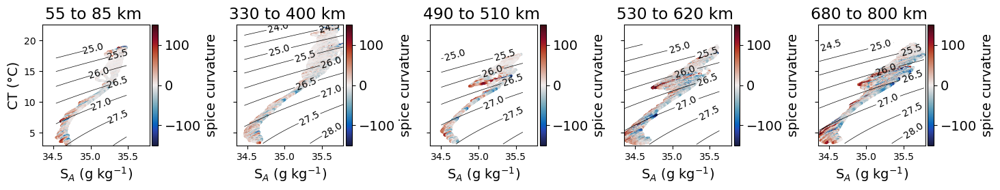

In [57]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(55, 85), (330, 400), (490, 510), (530, 620), (680, 800)]

# Create a row of subplots
fig, axs = plt.subplots(1, len(distance_ranges), figsize=(3 * len(distance_ranges), 3), sharex=True, sharey=True)

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    
    ds_filtered = ds_den.where((ds_den.distance >= d_min) & (ds_den.distance <= d_max), drop=True)
    # Calculate AOU
    AOU = ds_filtered.spice_curv

    # Scatter plot of AOU
    img = axs[i].scatter(ds_filtered.salinity, ds_filtered.temp, c=AOU, cmap = cmo.balance,vmin= -150, vmax = 150, s=2)

    # Add colorbar for each subplot
    cbar = plt.colorbar(img, ax=axs[i], pad=0.02)
    cbar.set_label(r'spice curvature')

    # Set axis labels and title
    axs[i].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i].set_title(f"{d_min} to {d_max} km ")

    # Generate and add density contour levels
    levels = np.arange(22, 30, 0.5)
    salinity_range = np.linspace(ds_filtered.salinity.min(), ds_filtered.salinity.max(), 100)
    temperature_range = np.linspace(ds_filtered.temp.min(), ds_filtered.temp.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)
    density_grid = gsw.sigma0(S_grid, T_grid)
    contours = axs[i].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    axs[i].clabel(contours, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    #axs[i].invert_yaxis()
    axs[i].tick_params(axis='both', which='major', labelsize=10)

axs[0].set_ylabel('CT (°C)')
plt.tight_layout()
plt.show()


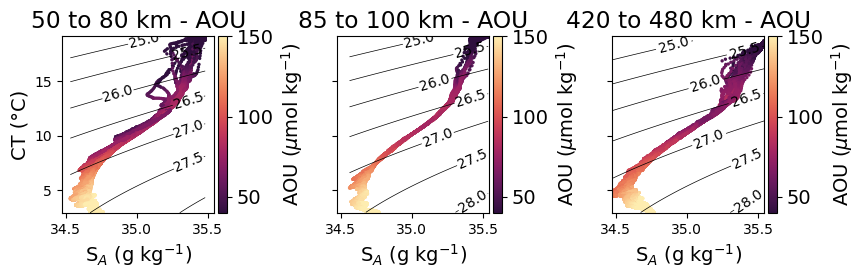

In [290]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(50,80) , (85,100), (420,480)]

# Create a row of subplots
fig, axs = plt.subplots(1, len(distance_ranges), figsize=(3 * len(distance_ranges), 3), sharex=True, sharey=True)

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    ds_filtered = ds_work.where((ds_work.distance >= d_min) & (ds_work.distance <= d_max), drop=True)

    # Calculate AOU
    AOU = ds_filtered.sol - ds_filtered.o2

    # Scatter plot of AOU
    img = axs[i].scatter(ds_filtered.salinity, ds_filtered.temp, c=AOU, cmap=cmo.matter_r, vmin=40, vmax=150, s=2)

    # Add colorbar for each subplot
    cbar = plt.colorbar(img, ax=axs[i], pad=0.02)
    cbar.set_label(r'AOU ($\mu$mol kg$^{-1}$)')

    # Set axis labels and title
    axs[i].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i].set_title(f"{d_min} to {d_max} km - AOU")

    # Generate and add density contour levels
    levels = np.arange(22, 30, 0.5)
    salinity_range = np.linspace(ds_filtered.salinity.min(), ds_filtered.salinity.max(), 100)
    temperature_range = np.linspace(ds_filtered.temp.min(), ds_filtered.temp.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)
    density_grid = gsw.sigma0(S_grid, T_grid)
    contours = axs[i].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    axs[i].clabel(contours, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    #axs[i].invert_yaxis()
    axs[i].tick_params(axis='both', which='major', labelsize=10)

axs[0].set_ylabel('CT (°C)')
plt.tight_layout()
plt.show()


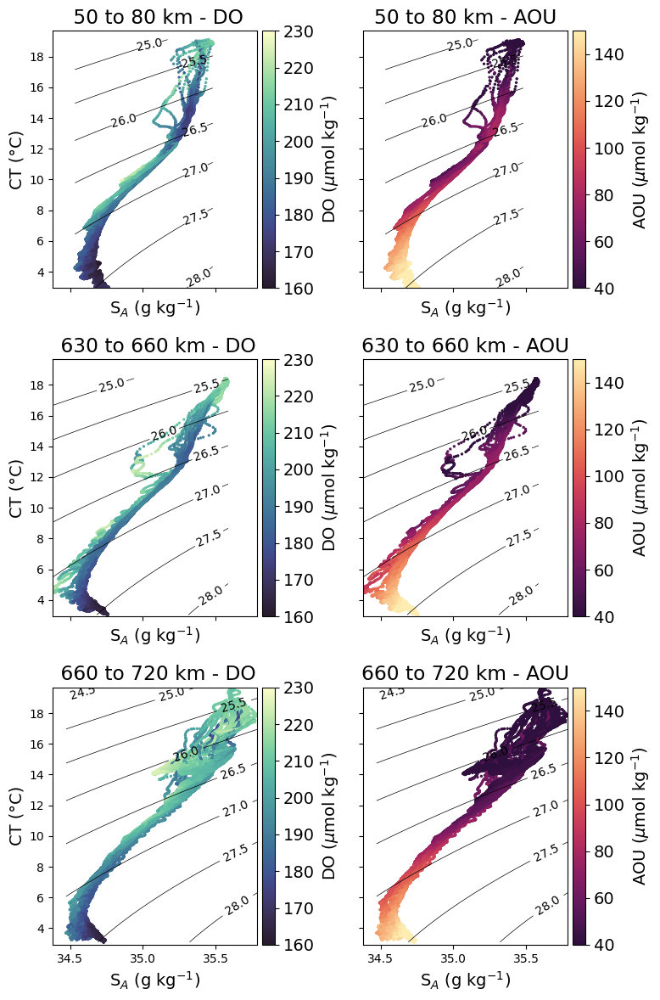

In [291]:
import matplotlib.pyplot as plt
import numpy as np
import gsw
import cmocean.cm as cmo

# Define distance ranges
distance_ranges = [(50,80) , (630,660), (660,720)]

fig, axs = plt.subplots(len(distance_ranges), 2, figsize=(8, 4 * len(distance_ranges)), sharex=True, sharey=True)

vmin = 160
vmax = 230

for i, (d_min, d_max) in enumerate(distance_ranges):
    # Filter dataset by distance range
    ds_filtered = ds_work.where((ds_work.distance >= d_min) & (ds_work.distance <= d_max), drop=True)

    # Extract variables
    salinity = ds_filtered.salinity
    temperature = ds_filtered.temp
    oxygen = ds_filtered.o2
    AOU = ds_filtered.sol - oxygen

    # Calculate density
    density = gsw.sigma0(salinity, temperature)

    # Create scatter plots for each subplot pair
    img0 = axs[i, 0].scatter(salinity, temperature, c=oxygen, cmap=cmo.deep_r, vmin=vmin, vmax=vmax, s=2)
    img1 = axs[i, 1].scatter(salinity, temperature, c=AOU, cmap=cmo.matter_r, vmin=40, vmax=150, s=2)

    # Add colorbars
    cbar0 = plt.colorbar(img0, ax=axs[i, 0], pad=0.02)
    cbar0.set_label(r'DO ($\mu$mol kg$^{-1}$)')
    
    cbar1 = plt.colorbar(img1, ax=axs[i, 1], pad=0.02)
    cbar1.set_label(r'AOU ($\mu$mol kg$^{-1}$)')

    # Set axis labels and titles
    axs[i, 0].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i, 0].set_ylabel('CT (°C)')
    axs[i, 1].set_xlabel('S$_A$ (g kg$^{-1}$)')
    axs[i, 0].set_title(f" {d_min} to {d_max} km - DO")
    axs[i, 1].set_title(f"{d_min} to {d_max} km - AOU")

    # Generate density contour levels
    levels = np.arange(22, 30, 0.5)

    # Create grid for salinity and temperature
    salinity_range = np.linspace(salinity.min(), salinity.max(), 100)
    temperature_range = np.linspace(temperature.min(), temperature.max(), 100)
    S_grid, T_grid = np.meshgrid(salinity_range, temperature_range)

    # Calculate density on the grid
    density_grid = gsw.sigma0(S_grid, T_grid)

    # Add contour lines
    contours0 = axs[i, 0].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)
    contours1 = axs[i, 1].contour(S_grid, T_grid, density_grid, levels=levels, colors='k', linewidths=0.5)

    # Add labels to contour lines
    axs[i, 0].clabel(contours0, inline=True, fontsize=10, fmt='%1.1f')
    axs[i, 1].clabel(contours1, inline=True, fontsize=10, fmt='%1.1f')

    # Set axis properties
    for a in axs[i, :]:
        a.invert_yaxis()
        a.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()
